# Auto_VTNA for SNAr Base Catalysis work

This Notebook shows how automatic VTNA calculations were carried out for the SAKE project. 

### Import Necessary Packages

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from functools import partial
import logging
logging.getLogger('matplotlib.font_manager').disabled = True
import auto_vtna
from auto_vtna.Normal_VTNA import Normal_VTNA
from auto_vtna.Automatic_VTNA import Automatic_VTNA

In [2]:
%matplotlib inline

### Names of datasets

In [3]:
Experiment_names=['C1_E1', 'C1_E2', 'C1_E3', 'C1_E4a','C1_E4b', 'C1_E5', 'C1_E6', 'C1_E7',
'C2_E1', 'C2_E2', 'C2_E3', 'C2_E4', 'C2_E5', 'C2_E6', 'C2_E7a', 'C2_E7b',
'C3_E1','C3_E2', 'C3_E3', 'C3_E4', 'C3_E5', 
'C4_E10', 'C4_E11', 'C4_E1a', 'C4_E1b', 'C4_E2', 'C4_E3', 'C4_E4', 'C4_E5', 'C4_E6', 'C4_E7', 'C4_E8', 'C4_E9']

In [4]:
path_cwd=os.getcwd()
path_datasets=path_cwd.replace('SAKE dataset analysis\\Automatic VTNA','SAKE datasets\\')
base_path=path_cwd.replace('SAKE dataset analysis\\Automatic VTNA','')

### Functions

In [5]:
def crop_largest_difference(
    files,
    column,
    percent_threshold=25.0,
    folder_name=None,
    keep_original_if_unique=True,  # kept for backward-compat, but no longer controls contents
    cwd=None
):
    """
    For each Excel workbook in `files`:
      1) Read all sheets.
      2) Remove rows containing negative values in numeric columns.
      3) Compute the range (max - min) of `column` per sheet (after cleaning).
      4) Identify the sheet with the largest range. If it exceeds the second-largest
         range by more than `percent_threshold` %, crop rows from the bottom of that
         sheet until it falls within the allowed limit.
      5) Save a new workbook with the cleaned/cropped sheet contents ALWAYS.

    Duplicate detection is used only to preserve sheet names (not sheet contents).
    """

    def _strip_cwd(path_str):
        """Remove the provided `cwd` prefix/substr from printed paths (privacy)."""
        if cwd and isinstance(path_str, str):
            path_clean = path_str.replace("\\\\", "\\")
            cwd_clean = cwd.replace("\\\\", "\\")
            return path_clean.replace(cwd_clean, "")
        return path_str

    # Output directory
    output_dir = os.path.join(os.getcwd(), folder_name) if folder_name else os.getcwd()
    if folder_name:
        os.makedirs(output_dir, exist_ok=True)

    for file in files:
        print(f"\nProcessing: {_strip_cwd(file)}")
        xls = pd.ExcelFile(file)

        # Processed versions (cleaned + maybe cropped), keyed by sheet name
        processed_dfs = {}
        column_diffs = {}

        has_duplicates = False

        # Read each sheet and compute the column range after cleaning
        for sheet_name in xls.sheet_names:
            df_original = xls.parse(sheet_name)

            # Detect duplicates in the original (any row duplicated)
            if df_original.duplicated().any():
                has_duplicates = True

            # Remove rows containing negative values in numeric columns only
            numeric = df_original.select_dtypes(include="number")
            if not numeric.empty:
                keep_mask = (numeric >= 0).all(axis=1)
                df = df_original.loc[keep_mask].reset_index(drop=True)
            else:
                df = df_original.copy().reset_index(drop=True)

            processed_dfs[sheet_name] = df

            # Compute range for the target column if it exists and isn't entirely NaN
            if column in df.columns and not df[column].isnull().all():
                column_diffs[sheet_name] = df[column].max() - df[column].min()
            else:
                print(f"  Skipping '{sheet_name}': column '{column}' missing or empty.")

        # Need at least two valid sheets to compare “largest vs second-largest”
        if len(column_diffs) < 2:
            print(f"  Not enough valid sheets in {_strip_cwd(file)}. Skipping.")
            continue

        # Identify the sheet with the largest and second-largest ranges
        sorted_sheets = sorted(column_diffs.items(), key=lambda x: x[1], reverse=True)
        sheet_max, max_diff = sorted_sheets[0]
        _, second_diff = sorted_sheets[1]
        allowed_diff = second_diff * (1 + percent_threshold / 100.0)

        # Crop only if the largest range exceeds the allowed limit
        modified = False
        if max_diff > allowed_diff:
            print(f"  Cropping '{sheet_max}' (diff={max_diff:.2f}) → limit={allowed_diff:.2f}")
            df_crop = processed_dfs[sheet_max].copy()

            # Crop from the bottom until within threshold (or down to 1 row)
            while (df_crop[column].max() - df_crop[column].min()) > allowed_diff and len(df_crop) > 1:
                df_crop = df_crop.iloc[:-1]

            processed_dfs[sheet_max] = df_crop
            modified = True
        else:
            print("  No cropping needed.")

        # Only mention duplicates when they exist
        if has_duplicates:
            print("  Duplicates found — preserving sheet names (contents still cleaned & cropped).")

        # Always write cleaned/cropped contents.
        # Sheet-name preservation: if duplicates exist, stick to the original workbook's sheet-name list.
        # (Either way, keys are the sheet names; this mainly matters if you later change logic to drop/rename.)
        sheet_names_to_write = xls.sheet_names if has_duplicates else list(processed_dfs.keys())

        filename = os.path.splitext(os.path.basename(file))[0]
        output_file = os.path.join(output_dir, f"{filename}_cropped.xlsx")

        with pd.ExcelWriter(output_file) as writer:
            for sheet_name in sheet_names_to_write:
                df = processed_dfs.get(sheet_name)
                if df is None:
                    # Defensive: if something removed a sheet unexpectedly, keep an empty sheet with the name
                    pd.DataFrame().to_excel(writer, index=False, sheet_name=sheet_name[:31])
                else:
                    df.to_excel(writer, index=False, sheet_name=sheet_name[:31])

        print(f"  Saved{' modified' if modified else ''} workbook → {_strip_cwd(output_file)}")

In [6]:
def Automatic_VTNA_bulk_analysis(
    dataset_list,
    filename,
    folder_name=None,
    standard_form_label_position=1.065,
    legends='both',
    size_scalers=0.8,
    xaxis_notation='Scientific',
    filename_addition='',
    file_in_main_folder=False,
    title_present=True,
    phenol_name='Phenol',
    legend_outside=True,
    # downsampling controls
    max_rows_unfixed=1500,
    max_rows_fixed=3000,
    keep_first_row=True,
    save_trimmed_excel=False,
    trimmed_suffix="_trimmed",
    cwd=None
):
    """
    Perform automated VTNA (Variable Time Normalisation Analysis) on multiple datasets.

    Overview
    --------
    For each dataset in `dataset_list`, this function:
      1) Loads the Excel workbook (all sheets).
      2) Clips negative numeric values to zero.
      3) Builds a VTNA selection dictionary automatically (auto_vtna.make_VTNA_selection).
      4) Runs VTNA twice:
           - one run with a fixed reaction order for a chosen species (here: 'ArOPh')
           - one run without fixed orders (free fit)
      5) Saves diagnostic plots (overlay plots; and an “orders vs overlay score” plot for fixed runs).
      6) Optionally downsamples large datasets (row cap differs for fixed vs unfixed runs) and
         optionally saves the downsampled dataset as a separate Excel file.
      7) Saves a summary CSV of best-fit orders and RMSE metrics across all successfully processed files.

    Downsampling behaviour
    ----------------------
    - Unfixed calculation (fixed_order_species=None): capped at `max_rows_unfixed`
    - Fixed-order calculation(s): capped at `max_rows_fixed`
    - Downsampling uses evenly spaced row indices and can keep the first row of each sheet.

    Privacy / printing
    ------------------
    If `cwd` is provided, it is removed from any printed file paths (simple substring replacement
    after normalising '\\\\' vs '\\').
    """

    def _strip_cwd(p):
        """Remove `cwd` substring from printed paths (privacy/readability)."""
        if cwd and isinstance(p, str):
            p_clean = p.replace("\\\\", "\\")
            cwd_clean = cwd.replace("\\\\", "\\")
            return p_clean.replace(cwd_clean, "")
        return p

    # -------------------------------------------------------------------------
    # Output directory
    # -------------------------------------------------------------------------
    if folder_name:
        output_path = os.path.join(os.getcwd(), folder_name)
        os.makedirs(output_path, exist_ok=True)
    else:
        output_path = os.getcwd()

    # -------------------------------------------------------------------------
    # Data utilities
    # -------------------------------------------------------------------------
    def convert_negatives_to_zero(df_dict):
        """
        Clip negative values to zero in numeric columns only, for each sheet in a workbook.

        Parameters
        ----------
        df_dict : dict[str, pd.DataFrame]
            Mapping of sheet_name -> DataFrame.

        Returns
        -------
        dict[str, pd.DataFrame]
            Same mapping with negative numeric values clipped to 0.
        """
        out = {}
        for sheet_name, df in df_dict.items():
            df2 = df.copy()
            num = df2.select_dtypes(include="number")
            if not num.empty:
                df2.loc[:, num.columns] = num.clip(lower=0)
            out[sheet_name] = df2
        return out

    def total_rows(df_dict):
        """Total row count across all sheets in a dict of DataFrames."""
        return sum(len(df) for df in df_dict.values())

    def save_dataset_dict_to_excel(dataset_dict, out_xlsx_path):
        """
        Save a dict of {sheet_name: DataFrame} as a multi-sheet Excel file.

        Notes
        -----
        Excel sheet names are limited to 31 characters.
        """
        os.makedirs(os.path.dirname(out_xlsx_path) or ".", exist_ok=True)
        with pd.ExcelWriter(out_xlsx_path, engine="openpyxl") as writer:
            for sheet, df in dataset_dict.items():
                safe_sheet = str(sheet)[:31] if sheet is not None else "Sheet1"
                df.to_excel(writer, sheet_name=safe_sheet, index=False)

    def downsample_dataset_dict_to_max_rows(dataset_dict, max_total_rows=1500, keep_first_row=True):
        """
        Downsample a dict of DataFrames so that the total number of rows across all sheets
        does not exceed `max_total_rows`.

        Strategy
        --------
        - Optionally reserve the first row of each non-empty sheet (keep_first_row=True).
        - Allocate remaining budget proportionally to each sheet's remaining rows.
        - Select rows using evenly spaced indices (linspace).
        - Ensures no sheet exceeds its original length.

        Returns
        -------
        dict[str, pd.DataFrame]
            Downsampled sheets (copies).
        """
        sheets = {k: v.copy() for k, v in dataset_dict.items()}

        lengths = {k: len(df) for k, df in sheets.items()}
        total = sum(lengths.values())

        # If cap is invalid or already satisfied, return copies
        if max_total_rows is None or max_total_rows <= 0:
            return sheets
        if total <= max_total_rows:
            return sheets

        target_total = max_total_rows

        # Mandatory first rows per sheet (if enabled)
        mandatory = {k: (1 if keep_first_row and lengths[k] > 0 else 0) for k in sheets}
        mandatory_total = sum(mandatory.values())

        # If cap is smaller than mandatory rows, keep only first rows (or empty)
        if mandatory_total >= target_total:
            out = {}
            for k, df in sheets.items():
                if len(df) == 0:
                    out[k] = df
                elif keep_first_row:
                    out[k] = df.iloc[[0]].reset_index(drop=True)
                else:
                    out[k] = df.iloc[[]].reset_index(drop=True)
            return out

        remaining_budget = target_total - mandatory_total

        # Available rows beyond the mandatory first row
        avail = {k: max(0, lengths[k] - mandatory[k]) for k in sheets}
        avail_total = sum(avail.values())
        if avail_total == 0:
            return sheets

        # Proportional allocation (floor first, then distribute remainder by fractional parts)
        alloc_float = {k: (avail[k] / avail_total) * remaining_budget for k in sheets}
        alloc = {k: int(np.floor(alloc_float[k])) for k in sheets}
        used = sum(alloc.values())
        remainder = remaining_budget - used

        frac_order = sorted(sheets.keys(), key=lambda k: (alloc_float[k] - alloc[k]), reverse=True)

        idx = 0
        while remainder > 0 and idx < len(frac_order) * 3:
            k = frac_order[idx % len(frac_order)]
            if alloc[k] < avail[k]:
                alloc[k] += 1
                remainder -= 1
            idx += 1

        # Build downsampled output
        out = {}
        for k, df in sheets.items():
            n = len(df)
            if n == 0:
                out[k] = df
                continue

            keep_n = min(n, mandatory[k] + alloc[k])

            if keep_n >= n:
                out[k] = df.reset_index(drop=True)
                continue

            if keep_first_row:
                # Keep row 0, then choose m additional rows from 1..n-1
                m = keep_n - 1
                if m <= 0:
                    keep_idx = [0]
                else:
                    spaced = np.linspace(1, n - 1, num=m, dtype=int)
                    keep_idx = [0] + sorted(set(spaced.tolist()))

                    # Top-up if duplicates reduced count
                    if len(keep_idx) < keep_n:
                        needed = keep_n - len(keep_idx)
                        candidates = [i for i in range(1, n) if i not in keep_idx]
                        if candidates and needed > 0:
                            step = max(1, int(np.ceil(len(candidates) / needed)))
                            extra = candidates[::step][:needed]
                            keep_idx += extra
                            keep_idx = sorted(set(keep_idx))

                    # Trim if overshot
                    if len(keep_idx) > keep_n:
                        keep_idx = [0] + keep_idx[1:keep_n]
            else:
                spaced = np.linspace(0, n - 1, num=keep_n, dtype=int)
                keep_idx = sorted(set(spaced.tolist()))
                if len(keep_idx) > keep_n:
                    keep_idx = keep_idx[:keep_n]

            out[k] = df.iloc[keep_idx].reset_index(drop=True)

        return out

    # -------------------------------------------------------------------------
    # Storage for results across all datasets
    # -------------------------------------------------------------------------
    order_phenol, order_A, order_B = [], [], []
    order_phenol_fixed_A, order_B_fixed_A = [], []
    RMSE_total, RMSE_fixed_A = [], []
    successful_files = []

    # -------------------------------------------------------------------------
    # Main loop over datasets
    # -------------------------------------------------------------------------
    for i in dataset_list:
        i_2 = os.path.basename(i).replace(".xlsx", "")
        print('\033[1m' + 'Dataset being analysed: ' + '\033[0m',_strip_cwd(i))

        try:
            # Resolve file path (preserves existing behaviour)
            filename = i
            if folder_name is not None:
                filename = os.path.join(output_path, i)

            # Load all sheets and clip negatives
            dataset = pd.read_excel(filename, sheet_name=None)
            dataset = convert_negatives_to_zero(dataset)

            # Build VTNA selection dict and set the analysis species configuration
            selection_dict = auto_vtna.make_VTNA_selection(dataset)
            selection_dict["output_species"] = "Product"
            selection_dict["normalised_species"] = {
                "Amine": 1,
                phenol_name: 0,
                "ArOPh": 1
            }

            # Two runs: fixed order for 'ArOPh' and an unfixed (free fit) run
            fixed_order_species = ["ArOPh", None]

            for j in fixed_order_species:
                dataset_for_run = dataset

                # Choose downsampling cap depending on run type
                if j is None:
                    cap = max_rows_unfixed
                    label = "unfixed"
                    label_for_filename = "unfixed"
                else:
                    cap = max_rows_fixed
                    label = f"fixed ({j})"
                    label_for_filename = f"fixed_{j}"

                # Downsample if needed, optionally save trimmed dataset
                if cap is not None:
                    before = total_rows(dataset_for_run)
                    if before > cap:
                        dataset_for_run = downsample_dataset_dict_to_max_rows(
                            dataset_for_run,
                            max_total_rows=cap,
                            keep_first_row=keep_first_row
                        )
                        after = total_rows(dataset_for_run)
                        print(f"  Downsampled ({label}): total rows {before} → {after}")

                        if save_trimmed_excel:
                            base = os.path.splitext(os.path.basename(i))[0]
                            trimmed_name = f"{base}{trimmed_suffix}_{label_for_filename}{filename_addition}.xlsx"
                            trimmed_path = os.path.join(output_path, trimmed_name)
                            save_dataset_dict_to_excel(dataset_for_run, trimmed_path)
                            print(f"  Saved trimmed Excel: {_strip_cwd(trimmed_path)}")

                # Run VTNA fitting
                calc = Automatic_VTNA(
                    dataset_for_run,
                    selection_dict,
                    resolution=6,
                    iterations=8,
                    deg=1,
                    constraint=None,
                    fixed_order_species=j,
                    fit_metric="RMSE"
                )

                # Fixed-order diagnostic plot (orders vs overlay score)
                if j is not None:
                    title = f"{i_2} OvsO plot fixed order A=1" if title_present else None
                    img = calc.plot_orders_vs_overlay(
                        y_unit="mM",
                        zoom=1.5,
                        annotate_optimum=False,
                        size_scaler=size_scalers,
                        color_scaler=1.05,
                        show_legend_main=False,
                        interval=True,
                        title=title,
                        fixed_cbar_resolution=0.0015
                    )
                    if isinstance(img, plt.Figure):
                        path = os.path.join(
                            output_path,
                            f"{os.path.basename(i)}_fixed_{j}_ovso_plot{filename_addition}.svg"
                        )
                        img.savefig(path.replace(".xlsx", ""), format="svg", bbox_inches="tight")
                        print(f"Saved {_strip_cwd(path)}")
                        plt.close(img)

                # Record best-fit orders and RMSE
                if j == "ArOPh":
                    order_B_fixed_A.append(calc.best_orders[0])
                    order_phenol_fixed_A.append(calc.best_orders[1])
                    RMSE_fixed_A.append(min(calc.results["RMSE overlay score"]))
                    print(
                        "Best parameters for fixed orders:",
                        calc.best_orders[0],
                        calc.best_orders[1],
                        min(calc.results["RMSE overlay score"])
                    )
                else:
                    order_B.append(calc.best_orders[0])
                    order_phenol.append(calc.best_orders[1])
                    order_A.append(calc.best_orders[2])
                    RMSE_total.append(min(calc.results["RMSE overlay score"]))
                    print(
                        "Best parameters without fixed orders:",
                        calc.best_orders[0],
                        calc.best_orders[1],
                        calc.best_orders[2],
                        min(calc.results["RMSE overlay score"])
                    )

                # Update selection dict for subsequent plots
                for k, l in zip(selection_dict["normalised_species"], calc.best_orders):
                    selection_dict["normalised_species"][k] = l

                # Create Normal_VTNA object using the dataset used in this run
                normal_vtna_1 = Normal_VTNA(dataset_for_run, selection_dict)

                # Overlay plots (with overlay score plot function)
                if legends == "both" or legends is True:
                    title_overlay_plot = (
                        f"Best overlay plot for {i_2}"
                        if j is None
                        else f"Best overlay plot for {i_2} with fixed order A=1"
                    )
                    if not title_present:
                        title_overlay_plot = ""

                    img = normal_vtna_1.plot_VTNA_with_overlay_score(
                        size_scaler=size_scalers,
                        DP_scaler=0.3,
                        constraint=None,
                        deg=1,
                        y_unit="mM",
                        xtick_rotation=0,
                        xaxis_size_scaler=1,
                        order_rounding=2,
                        linewidth=0.7,
                        title=title_overlay_plot,
                        standard_form_label_position=standard_form_label_position,
                        xaxis_notation=xaxis_notation
                    )
                    if isinstance(img, plt.Figure):
                        path = os.path.join(
                            output_path,
                            f"{os.path.basename(i)}_fixed_{j}_overlay_plot{filename_addition}.svg"
                        )
                        img.savefig(path.replace(".xlsx", ""), format="svg", bbox_inches="tight")
                        print(f"Saved {_strip_cwd(path.replace('.xlsx',''))}")
                        plt.close(img)

                # Overlay plots without legends
                if legends is False or legends == "both":
                    img2 = normal_vtna_1.plot_VTNA(
                        size_scaler=size_scalers,
                        DP_scaler=0.3,
                        y_unit="mM",
                        xtick_rotation=0,
                        xaxis_size_scaler=1,
                        order_rounding=2,
                        linewidth=0.7,
                        title=title_overlay_plot,
                        standard_form_label_position=standard_form_label_position,
                        xaxis_notation=xaxis_notation,
                        legend_outside=legend_outside
                    )
                    if isinstance(img2, plt.Figure):
                        path = os.path.join(
                            output_path,
                            f"{os.path.basename(i)}_fixed_{j}_overlay_plot_no_legends{filename_addition}.svg"
                        )
                        img2.savefig(path.replace(".xlsx", ""), format="svg", bbox_inches="tight")
                        print(f"Saved {_strip_cwd(path)}")
                        plt.close(img2)

            # Final plot: no time-axis normalisation (uses full dataset, not downsampled)
            selection_dict["normalised_species"] = {
                "Amine": 0,
                phenol_name: 0,
                "ArOPh": 0
            }
            normal_vtna = Normal_VTNA(dataset, selection_dict)

            title_overlay_plot = (
                f"Overlay plot for {i_2} without time axis normalisation"
                if title_present else None
            )

            img3 = normal_vtna.plot_VTNA(
                size_scaler=size_scalers,
                DP_scaler=0.3,
                y_unit="mM",
                xtick_rotation=0,
                xaxis_size_scaler=1,
                order_rounding=2,
                linewidth=0.7,
                title=title_overlay_plot,
                standard_form_label_position=standard_form_label_position,
                xaxis_notation=xaxis_notation,
                legend_outside=legend_outside
            )
            if isinstance(img3, plt.Figure):
                path = os.path.join(
                    output_path,
                    f"{os.path.basename(i)}_no_time_normalisation{filename_addition}.svg"
                )
                img3.savefig(path.replace(".xlsx", ""), format="svg", bbox_inches="tight")
                print(f"Saved {_strip_cwd(path)}")
                plt.close(img3)

            successful_files.append(i)
            print(f"{_strip_cwd(i)} done")

        except Exception as e:
            print(f"Error processing {_strip_cwd(i)}: {e}")
            continue

    # -------------------------------------------------------------------------
    # Save summary CSV
    # -------------------------------------------------------------------------
    data = [
        successful_files,
        order_phenol,
        order_A,
        order_B,
        RMSE_total,
        order_B_fixed_A,
        order_phenol_fixed_A,
        RMSE_fixed_A
    ]
    column_names = [
        "Filename",
        "Order Phenol",
        "Order A",
        "Order B",
        "RMSE total calc",
        "Order B fixed A",
        "Order phenol fixed A",
        "RMSE fixed A"
    ]
    df = pd.DataFrame(list(zip(*data)), columns=column_names)

    csv_path = os.path.join(output_path, f"{folder_name}summary_results{filename_addition}.csv")
    df.to_csv(csv_path, index=False)
    print(f"Data saved to {_strip_cwd(csv_path)}")

    return (
        successful_files,
        order_phenol,
        order_A,
        order_B,
        order_phenol_fixed_A,
        order_B_fixed_A,
        RMSE_total,
        RMSE_fixed_A
    )


### Campaign 1: Eyring Study for 1a and 2a to Form 3aa

In [7]:
Experiment_names_C1=[i for i in Experiment_names if i[1]=='1']
Experiment_paths_C1=[path_datasets+i+'.xlsx' for i in Experiment_names_C1]

In [8]:
crop_largest_difference(Experiment_paths_C1, column="Product", percent_threshold=35.0,folder_name='C1_cropped_SAKE_datasets',cwd=base_path)


Processing: SAKE datasets\C1_E1.xlsx
  Cropping 'Addition 4' (diff=60.15) → limit=29.65
  Saved modified workbook → SAKE dataset analysis\Automatic VTNA\C1_cropped_SAKE_datasets\C1_E1_cropped.xlsx

Processing: SAKE datasets\C1_E2.xlsx
  No cropping needed.
  Saved workbook → SAKE dataset analysis\Automatic VTNA\C1_cropped_SAKE_datasets\C1_E2_cropped.xlsx

Processing: SAKE datasets\C1_E3.xlsx
  Cropping 'Addition 4' (diff=59.76) → limit=46.55
  Saved modified workbook → SAKE dataset analysis\Automatic VTNA\C1_cropped_SAKE_datasets\C1_E3_cropped.xlsx

Processing: SAKE datasets\C1_E4a.xlsx
  No cropping needed.
  Saved workbook → SAKE dataset analysis\Automatic VTNA\C1_cropped_SAKE_datasets\C1_E4a_cropped.xlsx

Processing: SAKE datasets\C1_E4b.xlsx
  Cropping 'Addition 4' (diff=59.05) → limit=33.99
  Saved modified workbook → SAKE dataset analysis\Automatic VTNA\C1_cropped_SAKE_datasets\C1_E4b_cropped.xlsx

Processing: SAKE datasets\C1_E5.xlsx
  No cropping needed.
  Saved workbook → SAK

In [9]:
path_cropped_datasets=os.getcwd()+'\\C1_cropped_SAKE_datasets'
Experiment_paths_cropped_C1=[path_cropped_datasets+'\\'+i+'_cropped.xlsx' for i in Experiment_names_C1]

Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\C1_cropped_SAKE_datasets\C1_E1_cropped.xlsx
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.5', '0.0']
Best reaction order(s) from the 2nd order exploration: ['1.5', '0.0']
Best reaction order(s) from the 3rd order exploration: ['1.696', '-0.06533']
Best reaction order(s) from the 4th order exploration: ['1.63502', '-0.06533']
Best reaction order(s) from the 5th order exploration: ['1.68624', '-0.08241']
Best reaction order(s) from the 6th order exploration: ['1.63844', '-0.06647']
Best reaction order(s) from the 7th order exploration: ['1.6429', '-0.07093']
Best reaction order(s) from the 8th order exploration: ['1.63873', '-0.06677']
Best reaction order(s) from the 9th order exploration: ['1.6399', '-0.06794']
The calculation is complete. Time elapsed: 61.8 seconds


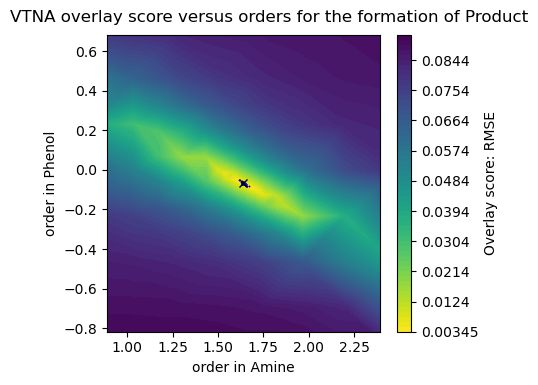

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E1_cropped.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.6399004964788149 -0.06793510388622225 0.0034485059601411386


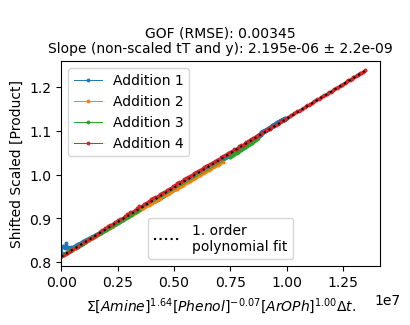

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E1_cropped_fixed_ArOPh_overlay_plot_V1.svg


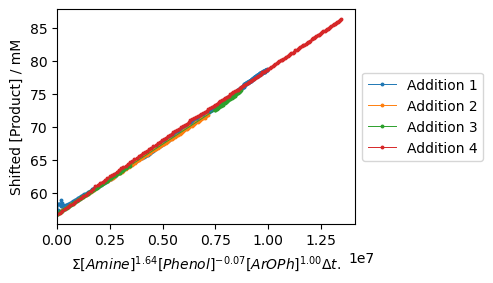

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E1_cropped.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.5', '0.0', '1.0']
Best reaction order(s) from the 2nd order exploration: ['1.5', '0.0', '1.0']
Best reaction order(s) from the 3rd order exploration: ['1.56533', '-0.06533', '0.804']
Best reaction order(s) from the 4th order exploration: ['1.56533', '-0.06533', '0.86498']
Best reaction order(s) from the 5th order exploration: ['1.58241', '-0.08241', '0.81376']
Best reaction order(s) from the 6th order exploration: ['1.58241', '-0.08241', '0.81376']
Best reaction order(s) from the 7th order exploration: ['1.57795', '-0.07795', '0.82714']
Best reaction order(s) from the 8th order exploration: ['1.58211', '-0.07795', '0.83547']
Best reaction order(s) from the 9th order exploration: ['1.58328', '-0.07678', '0.8413']
The calculation is complete. Time elapsed: 416.6 seconds

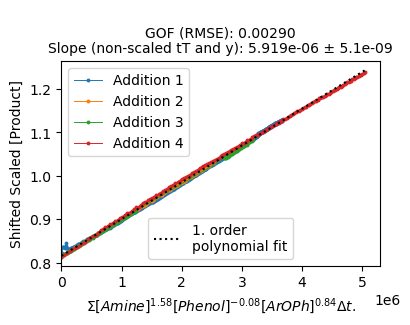

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E1_cropped_fixed_None_overlay_plot_V1.svg


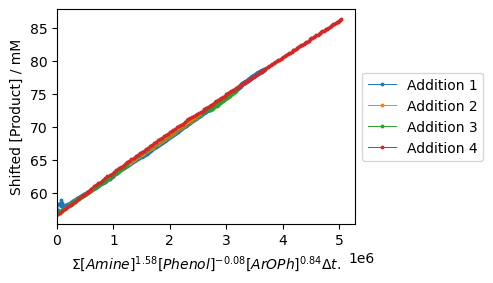

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E1_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


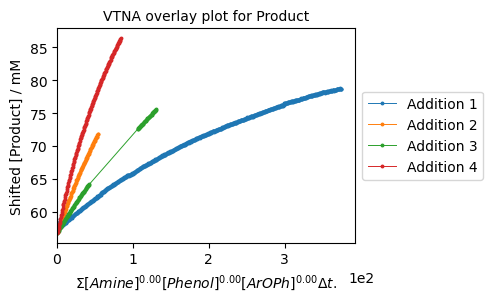

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E1_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\C1_cropped_SAKE_datasets\C1_E1_cropped.xlsx done
Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\C1_cropped_SAKE_datasets\C1_E2_cropped.xlsx
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.5', '0.0']
Best reaction order(s) from the 2nd order exploration: ['1.26667', '0.0']
Best reaction order(s) from the 3rd order exploration: ['1.46267', '-0.06533']
Best reaction order(s) from the 4th order exploration: ['1.40169', '-0.06533']
Best reaction order(s) from the 5th order exploration: ['1.41876', '-0.08241']
Best reaction order(s) from the 6th order exploration: ['1.45063', '-0.09834']
Best reaction order(s) from the 7th order exploration: ['1.44617', '-0.09388']
Best reaction order(s) from the 8th order exploration: ['1.45034', '-0.09805']
Best reaction order(s) from the 9th order

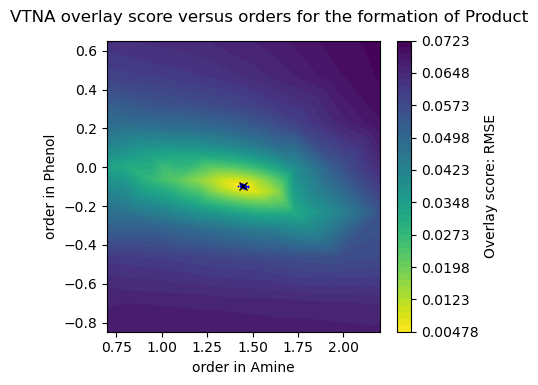

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E2_cropped.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.4491701998174815 -0.09687911833600005 0.0047805947693101555


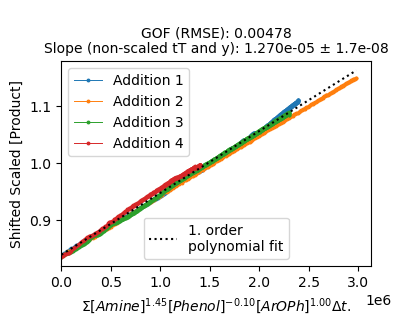

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E2_cropped_fixed_ArOPh_overlay_plot_V1.svg


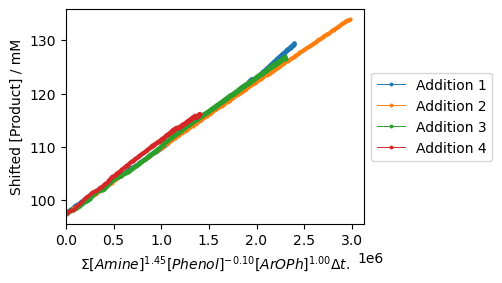

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E2_cropped.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
  Downsampled (unfixed): total rows 2418 → 1500
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.5', '0.0', '1.0']
Best reaction order(s) from the 2nd order exploration: ['1.5', '0.0', '1.23333']
Best reaction order(s) from the 3rd order exploration: ['1.43467', '-0.06533', '1.03733']
Best reaction order(s) from the 4th order exploration: ['1.43467', '-0.12631', '0.91538']
Best reaction order(s) from the 5th order exploration: ['1.41759', '-0.10924', '0.93245']
Best reaction order(s) from the 6th order exploration: ['1.40166', '-0.12517', '0.90058']
Best reaction order(s) from the 7th order exploration: ['1.41504', '-0.12071', '0.92289']
Best reaction order(s) from the 8th order exploration: ['1.41088', '-0.12071', '0.91873']
Best reaction order(s) from the 9th order exploration: ['1.40971', '-0.12188', '0.91523']
T

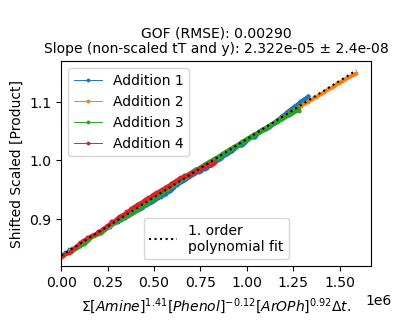

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E2_cropped_fixed_None_overlay_plot_V1.svg


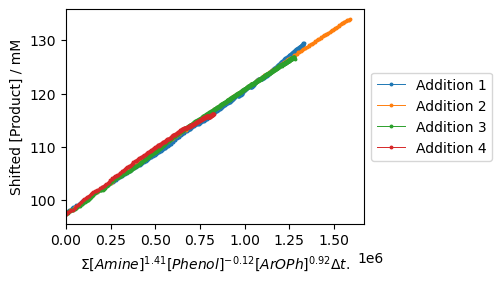

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E2_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


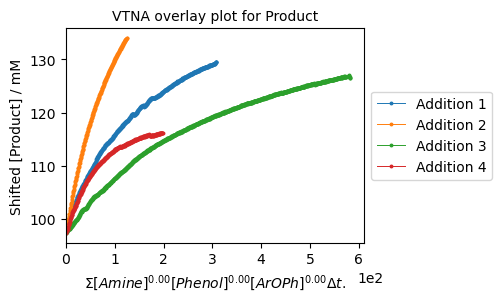

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E2_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\C1_cropped_SAKE_datasets\C1_E2_cropped.xlsx done
Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\C1_cropped_SAKE_datasets\C1_E3_cropped.xlsx
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['2.0', '-0.5']
Best reaction order(s) from the 2nd order exploration: ['1.3', '-0.03333']
Best reaction order(s) from the 3rd order exploration: ['1.36533', '-0.09867']
Best reaction order(s) from the 4th order exploration: ['1.36533', '-0.09867']
Best reaction order(s) from the 5th order exploration: ['1.34826', '-0.08159']
Best reaction order(s) from the 6th order exploration: ['1.34826', '-0.08159']
Best reaction order(s) from the 7th order exploration: ['1.3438', '-0.07713']
Best reaction order(s) from the 8th order exploration: ['1.33963', '-0.07297']
Best reaction order(s) from the 9th orde

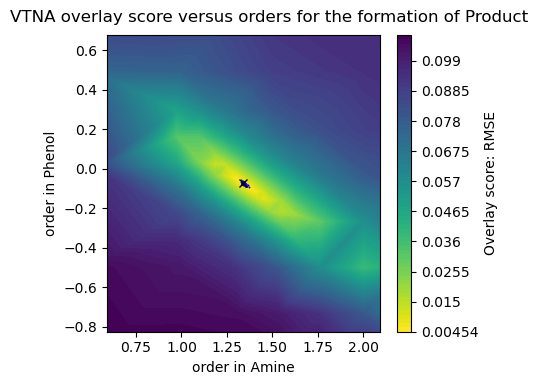

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E3_cropped.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.340799179738074 -0.07413251307140756 0.004541710484198328


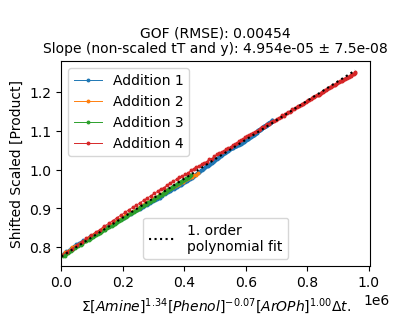

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E3_cropped_fixed_ArOPh_overlay_plot_V1.svg


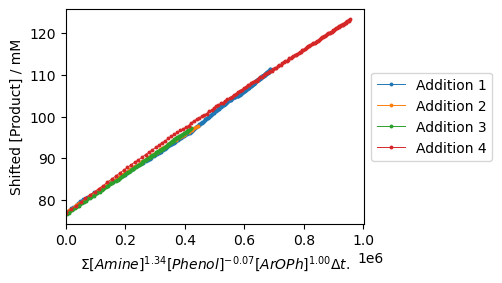

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E3_cropped.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.5', '0.0', '1.5']
Best reaction order(s) from the 2nd order exploration: ['1.26667', '0.0', '1.03333']
Best reaction order(s) from the 3rd order exploration: ['1.332', '-0.06533', '0.968']
Best reaction order(s) from the 4th order exploration: ['1.39298', '-0.06533', '1.08996']
Best reaction order(s) from the 5th order exploration: ['1.3759', '-0.04826', '1.10703']
Best reaction order(s) from the 6th order exploration: ['1.3759', '-0.0642', '1.07516']
Best reaction order(s) from the 7th order exploration: ['1.36252', '-0.05973', '1.06177']
Best reaction order(s) from the 8th order exploration: ['1.36252', '-0.0639', '1.04928']
Best reaction order(s) from the 9th order exploration: ['1.35902', '-0.06506', '1.04345']
The calculation is complete. Time elapsed: 121.7 seco

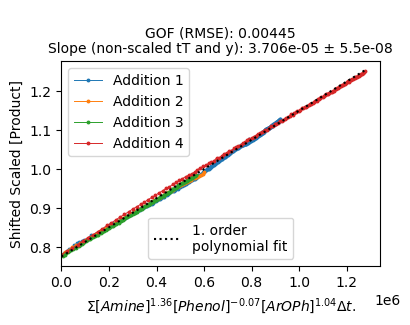

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E3_cropped_fixed_None_overlay_plot_V1.svg


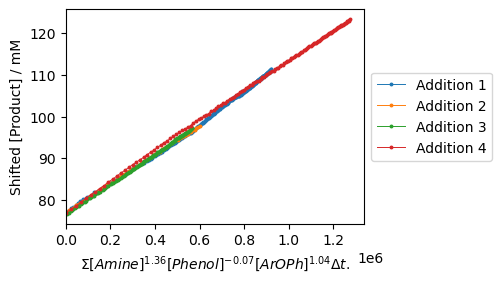

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E3_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


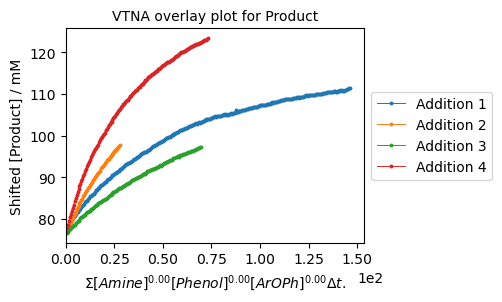

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E3_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\C1_cropped_SAKE_datasets\C1_E3_cropped.xlsx done
Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\C1_cropped_SAKE_datasets\C1_E4a_cropped.xlsx
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.0', '0.0']
Best reaction order(s) from the 2nd order exploration: ['1.23333', '0.0']
Best reaction order(s) from the 3rd order exploration: ['1.168', '-0.06533']
Best reaction order(s) from the 4th order exploration: ['1.22898', '-0.06533']
Best reaction order(s) from the 5th order exploration: ['1.24605', '-0.08241']
Best reaction order(s) from the 6th order exploration: ['1.26199', '-0.08241']
Best reaction order(s) from the 7th order exploration: ['1.25753', '-0.07795']
Best reaction order(s) from the 8th order exploration: ['1.25336', '-0.07795']
Best reaction order(s) from the 9th order 

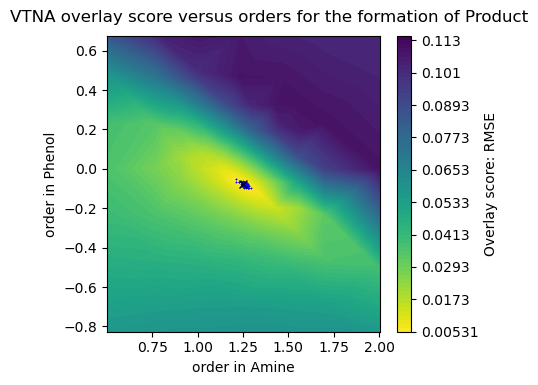

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E4a_cropped.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.2521945945631607 -0.07677910830143213 0.005312267971003603


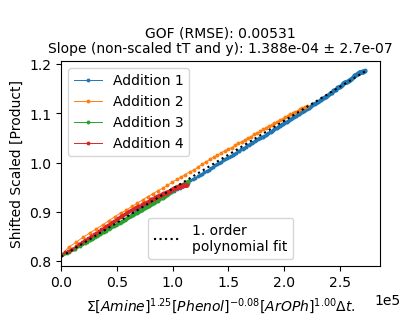

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E4a_cropped_fixed_ArOPh_overlay_plot_V1.svg


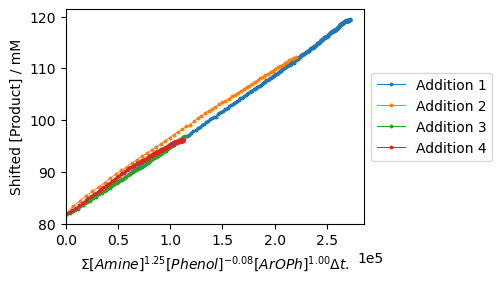

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E4a_cropped.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.0', '0.0', '1.0']
Best reaction order(s) from the 2nd order exploration: ['1.46667', '0.0', '1.23333']
Best reaction order(s) from the 3rd order exploration: ['1.27067', '-0.06533', '1.03733']
Best reaction order(s) from the 4th order exploration: ['1.27067', '-0.06533', '1.03733']
Best reaction order(s) from the 5th order exploration: ['1.28774', '-0.04826', '1.05441']
Best reaction order(s) from the 6th order exploration: ['1.2718', '-0.0642', '1.03847']
Best reaction order(s) from the 7th order exploration: ['1.27627', '-0.05973', '1.04293']
Best reaction order(s) from the 8th order exploration: ['1.28043', '-0.05973', '1.0471']
Best reaction order(s) from the 9th order exploration: ['1.2816', '-0.05857', '1.04826']
The calculation is complete. Time elapsed: 105.0

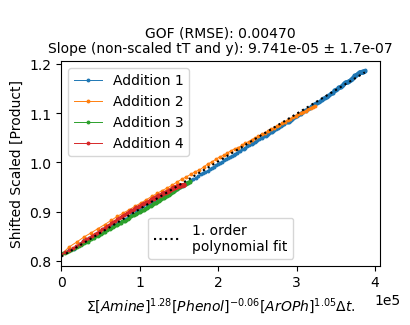

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E4a_cropped_fixed_None_overlay_plot_V1.svg


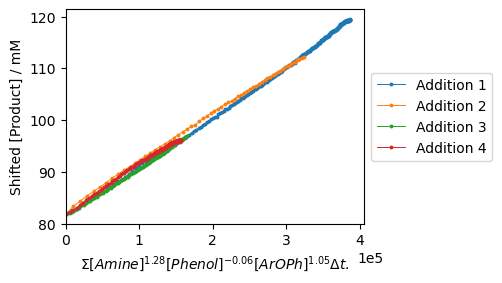

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E4a_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


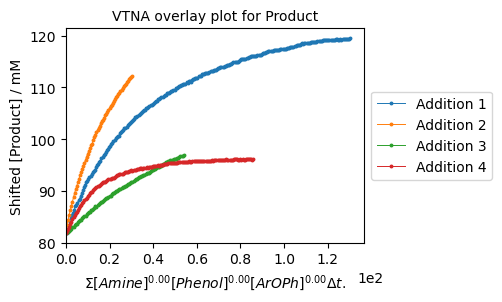

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E4a_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\C1_cropped_SAKE_datasets\C1_E4a_cropped.xlsx done
Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\C1_cropped_SAKE_datasets\C1_E4b_cropped.xlsx
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.0', '0.0']
Best reaction order(s) from the 2nd order exploration: ['1.23333', '0.0']
Best reaction order(s) from the 3rd order exploration: ['1.29867', '-0.06533']
Best reaction order(s) from the 4th order exploration: ['1.23769', '-0.06533']
Best reaction order(s) from the 5th order exploration: ['1.25476', '-0.08241']
Best reaction order(s) from the 6th order exploration: ['1.2707', '-0.08241']
Best reaction order(s) from the 7th order exploration: ['1.25731', '-0.07795']
Best reaction order(s) from the 8th order exploration: ['1.26148', '-0.07795']
Best reaction order(s) from the 9th ord

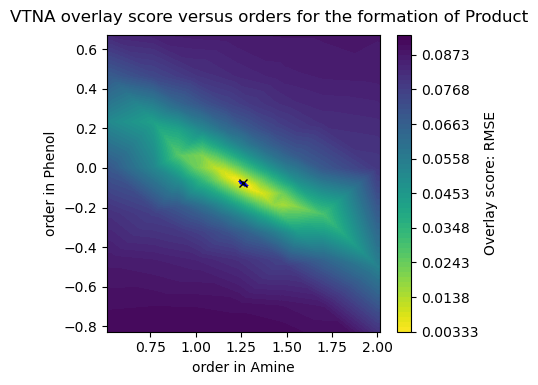

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E4b_cropped.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.2614768349234569 -0.07794516385185188 0.003326685999592752


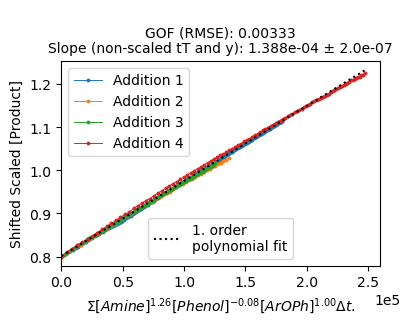

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E4b_cropped_fixed_ArOPh_overlay_plot_V1.svg


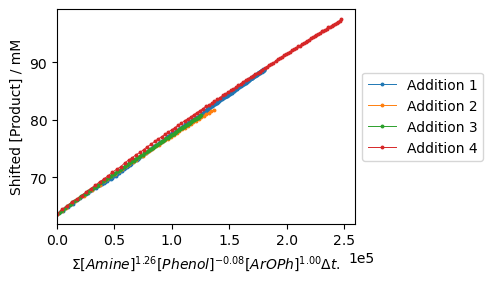

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E4b_cropped.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.0', '0.0', '1.0']
Best reaction order(s) from the 2nd order exploration: ['1.23333', '0.0', '1.23333']
Best reaction order(s) from the 3rd order exploration: ['1.29867', '-0.06533', '1.168']
Best reaction order(s) from the 4th order exploration: ['1.23769', '-0.06533', '0.98507']
Best reaction order(s) from the 5th order exploration: ['1.25476', '-0.08241', '0.96799']
Best reaction order(s) from the 6th order exploration: ['1.25476', '-0.08241', '0.96799']
Best reaction order(s) from the 7th order exploration: ['1.2503', '-0.07795', '0.98138']
Best reaction order(s) from the 8th order exploration: ['1.25447', '-0.07795', '0.98554']
Best reaction order(s) from the 9th order exploration: ['1.2533', '-0.07911', '0.97971']
The calculation is complete. Time elapsed: 103.3

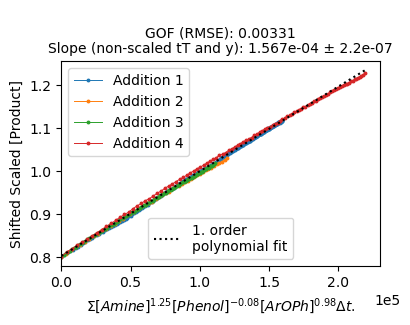

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E4b_cropped_fixed_None_overlay_plot_V1.svg


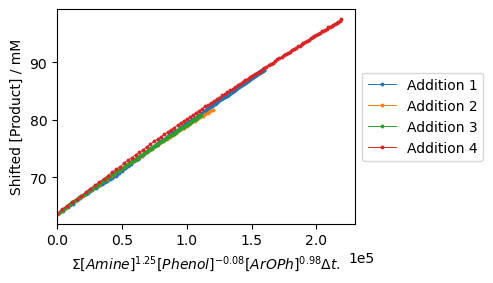

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E4b_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


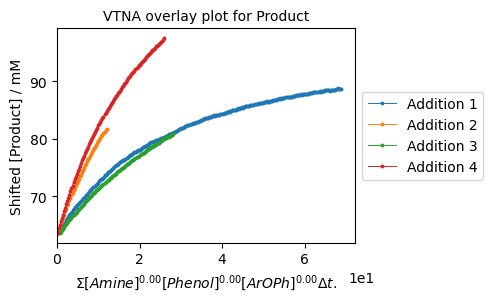

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E4b_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\C1_cropped_SAKE_datasets\C1_E4b_cropped.xlsx done
Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\C1_cropped_SAKE_datasets\C1_E5_cropped.xlsx
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.0', '0.0']
Best reaction order(s) from the 2nd order exploration: ['1.46667', '-0.23333']
Best reaction order(s) from the 3rd order exploration: ['1.14', '-0.03733']
Best reaction order(s) from the 4th order exploration: ['1.26196', '-0.09831']
Best reaction order(s) from the 5th order exploration: ['1.27903', '-0.11538']
Best reaction order(s) from the 6th order exploration: ['1.23122', '-0.08351']
Best reaction order(s) from the 7th order exploration: ['1.23568', '-0.08798']
Best reaction order(s) from the 8th order exploration: ['1.23568', '-0.08798']
Best reaction order(s) from the 9th o

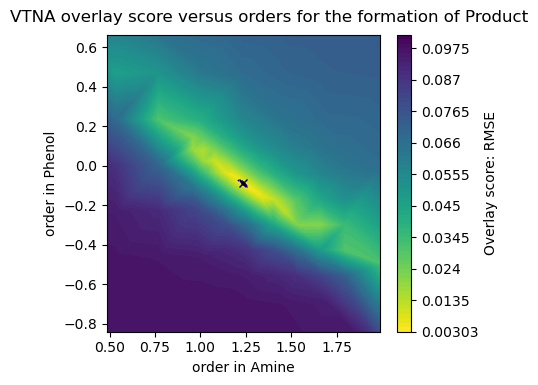

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E5_cropped.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.2368507583652346 -0.08914183984671607 0.003032375058803257


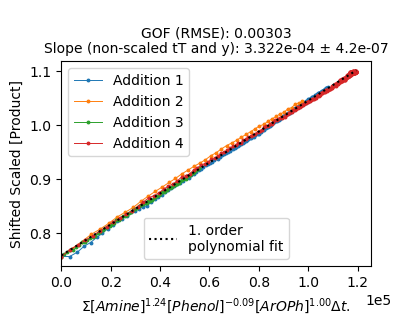

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E5_cropped_fixed_ArOPh_overlay_plot_V1.svg


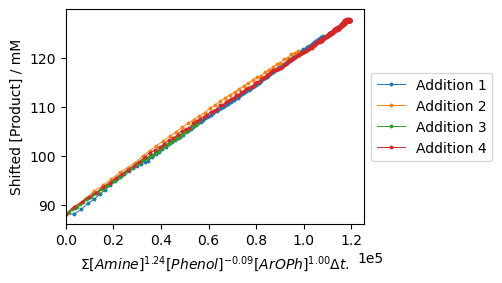

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E5_cropped.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.0', '0.0', '1.0']
Best reaction order(s) from the 2nd order exploration: ['1.46667', '-0.23333', '1.0']
Best reaction order(s) from the 3rd order exploration: ['1.27067', '-0.168', '0.93467']
Best reaction order(s) from the 4th order exploration: ['1.27067', '-0.10702', '0.99564']
Best reaction order(s) from the 5th order exploration: ['1.25359', '-0.08995', '1.01272']
Best reaction order(s) from the 6th order exploration: ['1.25359', '-0.07401', '1.04459']
Best reaction order(s) from the 7th order exploration: ['1.25805', '-0.07847', '1.04013']
Best reaction order(s) from the 8th order exploration: ['1.25389', '-0.07431', '1.04013']
Best reaction order(s) from the 9th order exploration: ['1.25506', '-0.07548', '1.03896']
The calculation is complete. Time elapsed: 113

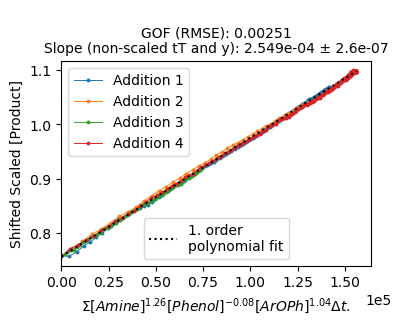

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E5_cropped_fixed_None_overlay_plot_V1.svg


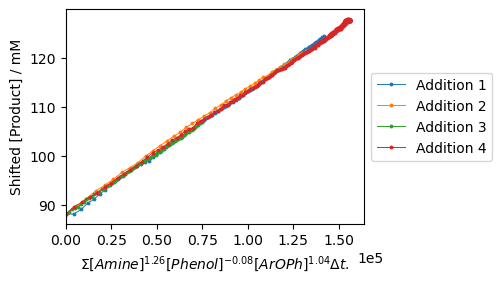

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E5_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


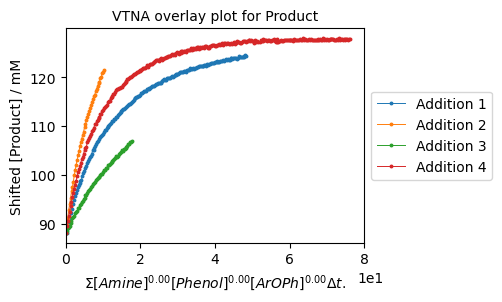

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E5_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\C1_cropped_SAKE_datasets\C1_E5_cropped.xlsx done
Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\C1_cropped_SAKE_datasets\C1_E6_cropped.xlsx
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.0', '0.0']
Best reaction order(s) from the 2nd order exploration: ['1.0', '0.0']
Best reaction order(s) from the 3rd order exploration: ['1.196', '-0.06533']
Best reaction order(s) from the 4th order exploration: ['1.25698', '-0.12631']
Best reaction order(s) from the 5th order exploration: ['1.17161', '-0.07509']
Best reaction order(s) from the 6th order exploration: ['1.20348', '-0.09103']
Best reaction order(s) from the 7th order exploration: ['1.20794', '-0.09549']
Best reaction order(s) from the 8th order exploration: ['1.20378', '-0.09132']
Best reaction order(s) from the 9th order explo

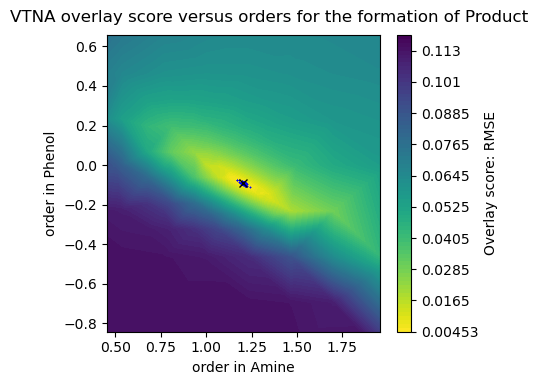

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E6_cropped.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.204943459441778 -0.09248882240474077 0.004533884507865962


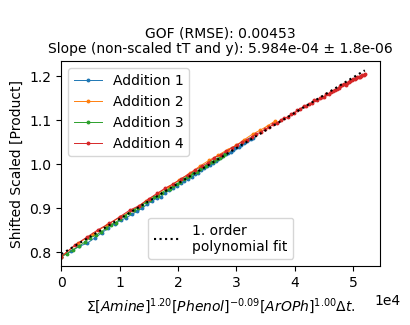

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E6_cropped_fixed_ArOPh_overlay_plot_V1.svg


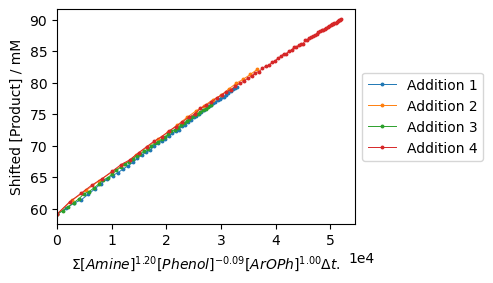

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E6_cropped.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.0', '0.0', '1.0']
Best reaction order(s) from the 2nd order exploration: ['1.23333', '0.0', '1.23333']
Best reaction order(s) from the 3rd order exploration: ['1.29867', '-0.06533', '1.168']
Best reaction order(s) from the 4th order exploration: ['1.23769', '-0.06533', '1.10702']
Best reaction order(s) from the 5th order exploration: ['1.25476', '-0.08241', '1.08995']
Best reaction order(s) from the 6th order exploration: ['1.25476', '-0.08241', '1.08995']
Best reaction order(s) from the 7th order exploration: ['1.2503', '-0.07795', '1.08549']
Best reaction order(s) from the 8th order exploration: ['1.25447', '-0.07795', '1.09382']
Best reaction order(s) from the 9th order exploration: ['1.2533', '-0.07678', '1.09498']
The calculation is complete. Time elapsed: 20.2 s

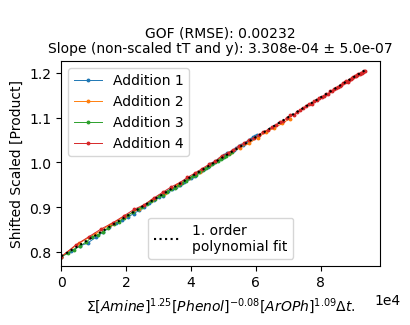

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E6_cropped_fixed_None_overlay_plot_V1.svg


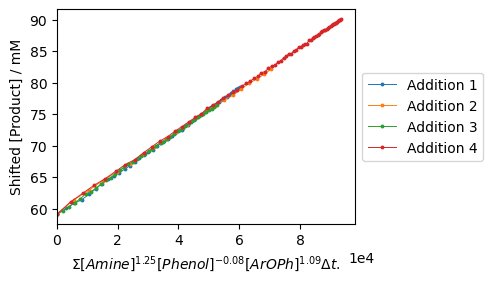

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E6_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


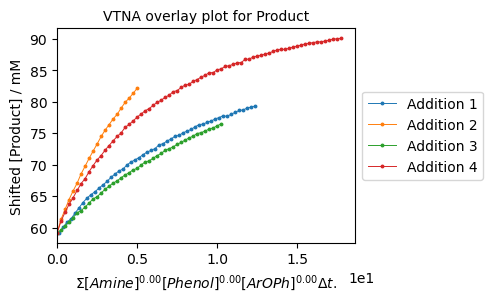

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E6_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\C1_cropped_SAKE_datasets\C1_E6_cropped.xlsx done
Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\C1_cropped_SAKE_datasets\C1_E7_cropped.xlsx
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.0', '0.0']
Best reaction order(s) from the 2nd order exploration: ['1.0', '0.0']
Best reaction order(s) from the 3rd order exploration: ['1.06533', '0.06533']
Best reaction order(s) from the 4th order exploration: ['1.00436', '0.06533']
Best reaction order(s) from the 5th order exploration: ['1.02143', '0.04826']
Best reaction order(s) from the 6th order exploration: ['1.02143', '0.04826']
Best reaction order(s) from the 7th order exploration: ['1.02589', '0.05272']
Best reaction order(s) from the 8th order exploration: ['1.03006', '0.04856']
Best reaction order(s) from the 9th order explorati

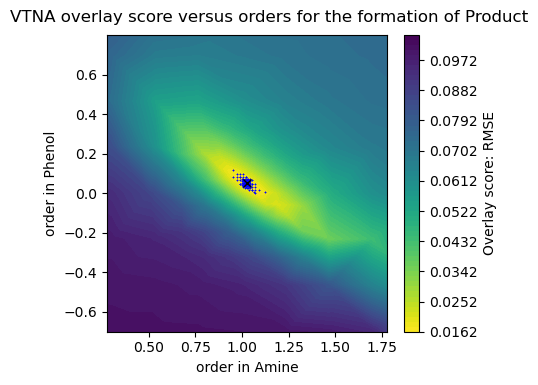

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E7_cropped.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.026557598049975 0.049723074256592545 0.016163733601570782


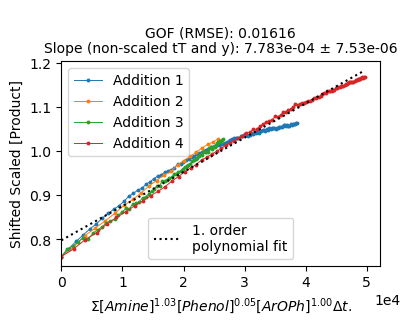

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E7_cropped_fixed_ArOPh_overlay_plot_V1.svg


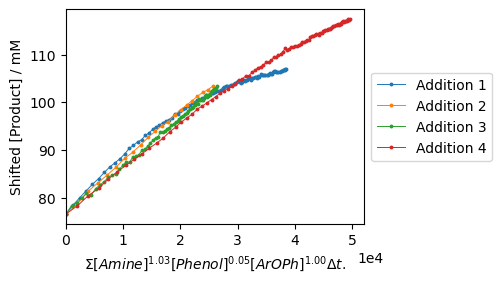

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E7_cropped.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.0', '0.0', '1.0']
Best reaction order(s) from the 2nd order exploration: ['1.23333', '0.0', '1.23333']
Best reaction order(s) from the 3rd order exploration: ['1.168', '0.06533', '1.168']
Best reaction order(s) from the 4th order exploration: ['1.168', '0.12631', '1.28996']
Best reaction order(s) from the 5th order exploration: ['1.18507', '0.10924', '1.30703']
Best reaction order(s) from the 6th order exploration: ['1.18507', '0.12517', '1.3389']
Best reaction order(s) from the 7th order exploration: ['1.18061', '0.12071', '1.32551']
Best reaction order(s) from the 8th order exploration: ['1.17645', '0.12071', '1.31719']
Best reaction order(s) from the 9th order exploration: ['1.17528', '0.11954', '1.31369']
The calculation is complete. Time elapsed: 28.1 seconds
Bes

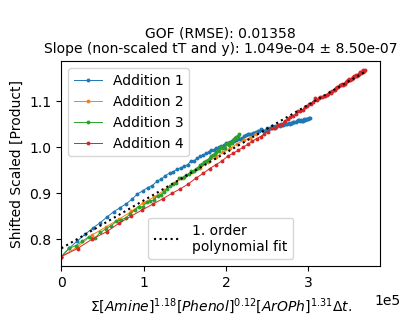

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E7_cropped_fixed_None_overlay_plot_V1.svg


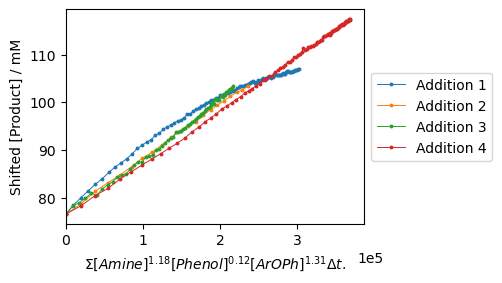

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E7_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


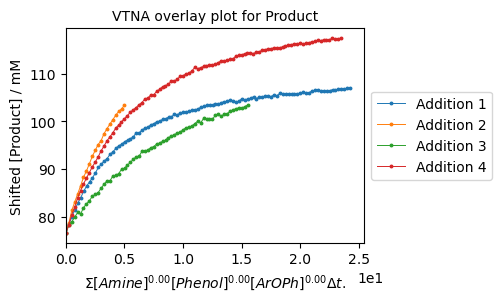

Saved SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_E7_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\C1_cropped_SAKE_datasets\C1_E7_cropped.xlsx done
Data saved to SAKE dataset analysis\Automatic VTNA\C1_Automatic_VTNA_Results\C1_Automatic_VTNA_Resultssummary_results_V1.csv


(['C:\\Users\\test_gv\\OneDrive - Imperial College London\\PhD\\SAKE publication with SI material\\Cleaned Python Scripts for Github\\SAKE dataset analysis\\Automatic VTNA\\C1_cropped_SAKE_datasets\\C1_E1_cropped.xlsx',
  'C:\\Users\\test_gv\\OneDrive - Imperial College London\\PhD\\SAKE publication with SI material\\Cleaned Python Scripts for Github\\SAKE dataset analysis\\Automatic VTNA\\C1_cropped_SAKE_datasets\\C1_E2_cropped.xlsx',
  'C:\\Users\\test_gv\\OneDrive - Imperial College London\\PhD\\SAKE publication with SI material\\Cleaned Python Scripts for Github\\SAKE dataset analysis\\Automatic VTNA\\C1_cropped_SAKE_datasets\\C1_E3_cropped.xlsx',
  'C:\\Users\\test_gv\\OneDrive - Imperial College London\\PhD\\SAKE publication with SI material\\Cleaned Python Scripts for Github\\SAKE dataset analysis\\Automatic VTNA\\C1_cropped_SAKE_datasets\\C1_E4a_cropped.xlsx',
  'C:\\Users\\test_gv\\OneDrive - Imperial College London\\PhD\\SAKE publication with SI material\\Cleaned Python Scrip

In [10]:
Automatic_VTNA_bulk_analysis(Experiment_paths_cropped_C1,'Experiments_cropped_C1_Automatic_VTNA_Results.csv',folder_name='C1_Automatic_VTNA_Results',filename_addition='_V1',title_present=False,cwd=base_path)

### Campaign 2: Hammett Study for 1b-g and 2a

In [11]:
Experiment_names_C2=[i for i in Experiment_names if i[1]=='2']
Experiment_paths_C2=[path_datasets+i+'.xlsx' for i in Experiment_names_C2]

In [12]:
crop_largest_difference(Experiment_paths_C2, column="Product", percent_threshold=35.0,folder_name='C2_cropped_SAKE_datasets',cwd=base_path)


Processing: SAKE datasets\C2_E1.xlsx
  Cropping 'Addition 4' (diff=59.77) → limit=34.23
  Saved modified workbook → SAKE dataset analysis\Automatic VTNA\C2_cropped_SAKE_datasets\C2_E1_cropped.xlsx

Processing: SAKE datasets\C2_E2.xlsx
  Cropping 'Addition 4' (diff=69.18) → limit=27.37
  Saved modified workbook → SAKE dataset analysis\Automatic VTNA\C2_cropped_SAKE_datasets\C2_E2_cropped.xlsx

Processing: SAKE datasets\C2_E3.xlsx
  Cropping 'Addition 4' (diff=53.51) → limit=36.63
  Saved modified workbook → SAKE dataset analysis\Automatic VTNA\C2_cropped_SAKE_datasets\C2_E3_cropped.xlsx

Processing: SAKE datasets\C2_E4.xlsx
  Cropping 'Addition 4' (diff=52.80) → limit=34.63
  Saved modified workbook → SAKE dataset analysis\Automatic VTNA\C2_cropped_SAKE_datasets\C2_E4_cropped.xlsx

Processing: SAKE datasets\C2_E5.xlsx
  No cropping needed.
  Saved workbook → SAKE dataset analysis\Automatic VTNA\C2_cropped_SAKE_datasets\C2_E5_cropped.xlsx

Processing: SAKE datasets\C2_E6.xlsx
  Cropping

In [13]:
path_cropped_datasets=os.getcwd()+'\\C2_cropped_SAKE_datasets'
Experiment_paths_cropped_C2=[path_cropped_datasets + "\\" + i + ("_cropped_v2.xlsx" if "E2" in i else "_cropped.xlsx")  for i in Experiment_names_C2]

Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\C2_cropped_SAKE_datasets\C2_E1_cropped.xlsx
  Downsampled (fixed (ArOPh)): total rows 3946 → 3000
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.0', '0.0']
Best reaction order(s) from the 2nd order exploration: ['1.0', '0.0']
Best reaction order(s) from the 3rd order exploration: ['1.06533', '-0.06533']
Best reaction order(s) from the 4th order exploration: ['1.06533', '-0.06533']
Best reaction order(s) from the 5th order exploration: ['1.01411', '-0.04826']
Best reaction order(s) from the 6th order exploration: ['1.03005', '-0.04826']
Best reaction order(s) from the 7th order exploration: ['1.03451', '-0.05272']
Best reaction order(s) from the 8th order exploration: ['1.047', '-0.05689']
Best reaction order(s) from the 9th order exploration: ['1.0435', '-0.05572']
The calculation is complete. Time elapsed: 142.7 seconds


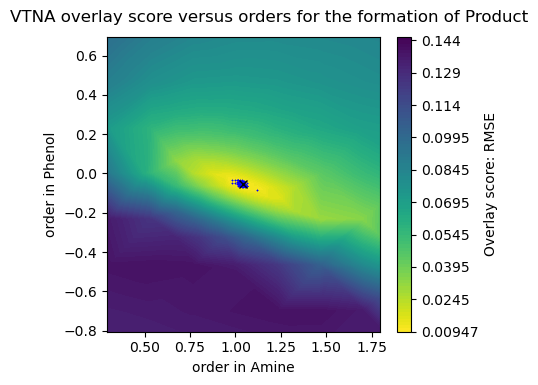

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E1_cropped.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.0435047588598518 -0.055719931373037074 0.009465871851295332


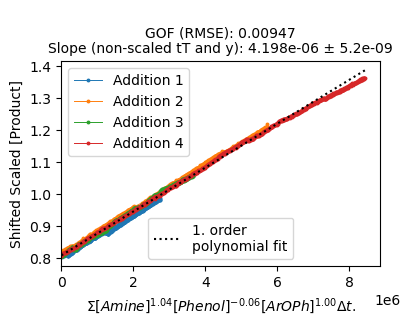

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E1_cropped_fixed_ArOPh_overlay_plot_V1.svg


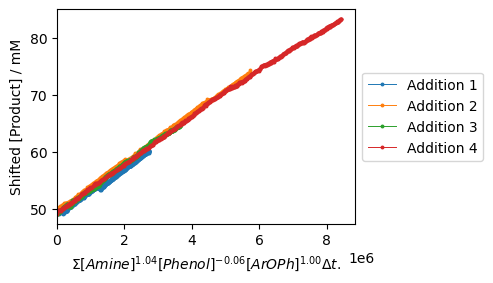

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E1_cropped.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
  Downsampled (unfixed): total rows 3946 → 1500
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.0', '0.0', '1.5']
Best reaction order(s) from the 2nd order exploration: ['1.23333', '0.0', '1.96667']
Best reaction order(s) from the 3rd order exploration: ['1.168', '0.06533', '2.16267']
Best reaction order(s) from the 4th order exploration: ['1.22898', '0.00436', '1.97973']
Best reaction order(s) from the 5th order exploration: ['1.17776', '0.02143', '1.89436']
Best reaction order(s) from the 6th order exploration: ['1.19369', '0.00549', '1.84656']
Best reaction order(s) from the 7th order exploration: ['1.17138', '0.00996', '1.82425']
Best reaction order(s) from the 8th order exploration: ['1.16722', '0.00996', '1.81175']
Best reaction order(s) from the 9th order exploration: ['1.16605', '0.00879', '1.80592']
The ca

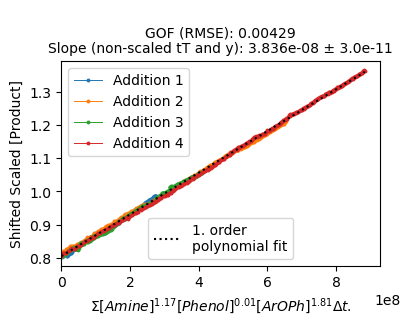

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E1_cropped_fixed_None_overlay_plot_V1.svg


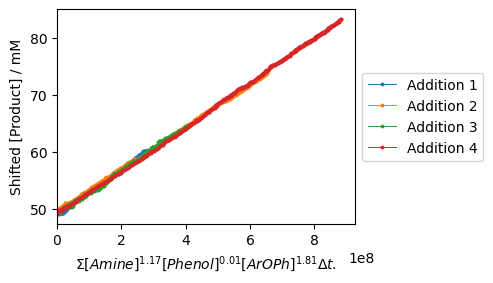

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E1_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


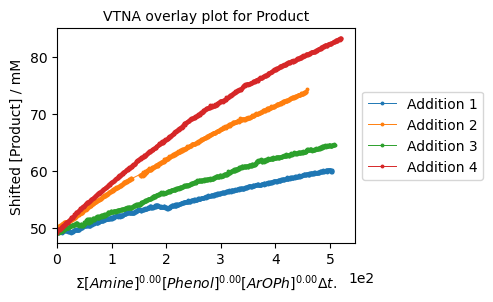

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E1_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\C2_cropped_SAKE_datasets\C2_E1_cropped.xlsx done
Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\C2_cropped_SAKE_datasets\C2_E2_cropped_v2.xlsx
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.0', '0.0']
Best reaction order(s) from the 2nd order exploration: ['1.46667', '-0.23333']
Best reaction order(s) from the 3rd order exploration: ['1.40133', '-0.168']
Best reaction order(s) from the 4th order exploration: ['1.34036', '-0.10702']
Best reaction order(s) from the 5th order exploration: ['1.35743', '-0.1241']
Best reaction order(s) from the 6th order exploration: ['1.37336', '-0.14003']
Best reaction order(s) from the 7th order exploration: ['1.3689', '-0.13557']
Best reaction order(s) from the 8th order exploration: ['1.36474', '-0.13557']
Best reaction order(s) from the 9th o

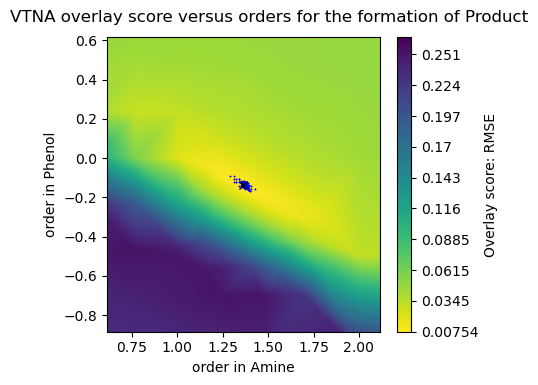

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E2_cropped_v2.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.363572372340938 -0.13440352311624693 0.007544831824033595


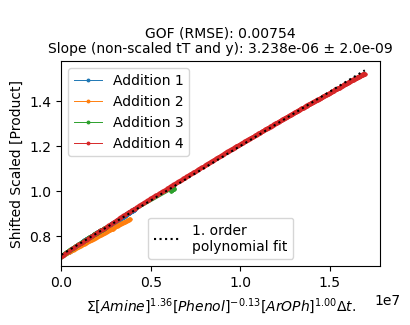

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E2_cropped_v2_fixed_ArOPh_overlay_plot_V1.svg


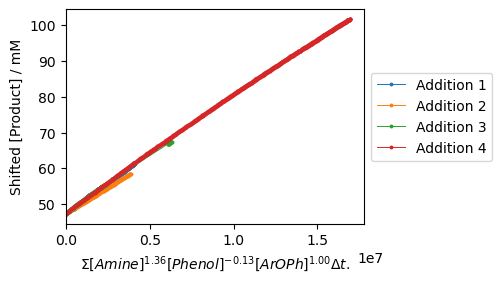

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E2_cropped_v2.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
  Downsampled (unfixed): total rows 2257 → 1500
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.0', '0.0', '1.0']
Best reaction order(s) from the 2nd order exploration: ['1.23333', '0.0', '1.23333']
Best reaction order(s) from the 3rd order exploration: ['1.29867', '-0.06533', '1.168']
Best reaction order(s) from the 4th order exploration: ['1.35964', '-0.12631', '1.04604']
Best reaction order(s) from the 5th order exploration: ['1.34257', '-0.10924', '1.09727']
Best reaction order(s) from the 6th order exploration: ['1.39038', '-0.12517', '1.14507']
Best reaction order(s) from the 7th order exploration: ['1.37699', '-0.12071', '1.13169']
Best reaction order(s) from the 8th order exploration: ['1.38116', '-0.12488', '1.12336']
Best reaction order(s) from the 9th order exploration: ['1.37999', '-0.12371', '1.1268

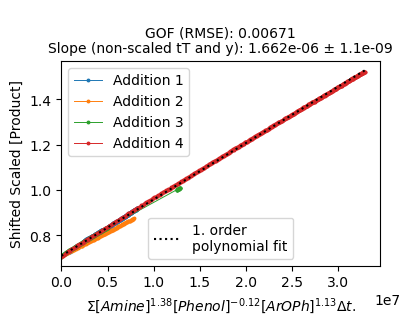

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E2_cropped_v2_fixed_None_overlay_plot_V1.svg


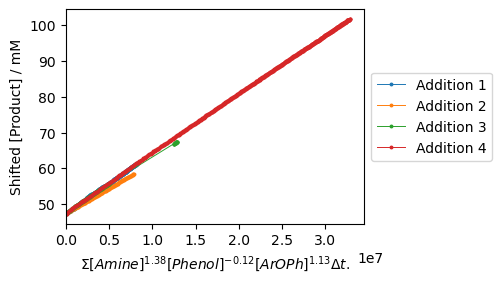

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E2_cropped_v2.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


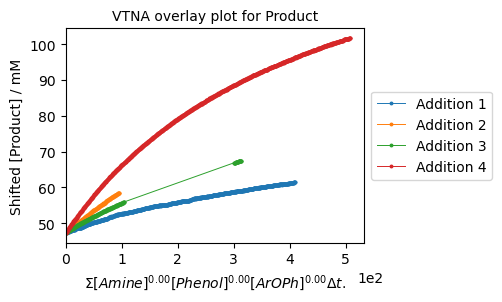

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E2_cropped_v2.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\C2_cropped_SAKE_datasets\C2_E2_cropped_v2.xlsx done
Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\C2_cropped_SAKE_datasets\C2_E3_cropped.xlsx
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.0', '0.0']
Best reaction order(s) from the 2nd order exploration: ['1.0', '0.0']
Best reaction order(s) from the 3rd order exploration: ['1.32667', '-0.196']
Best reaction order(s) from the 4th order exploration: ['1.20471', '-0.13502']
Best reaction order(s) from the 5th order exploration: ['1.29008', '-0.18624']
Best reaction order(s) from the 6th order exploration: ['1.24227', '-0.15437']
Best reaction order(s) from the 7th order exploration: ['1.24674', '-0.15883']
Best reaction order(s) from the 8th order exploration: ['1.24257', '-0.15467']
Best reaction order(s) from the 9th order

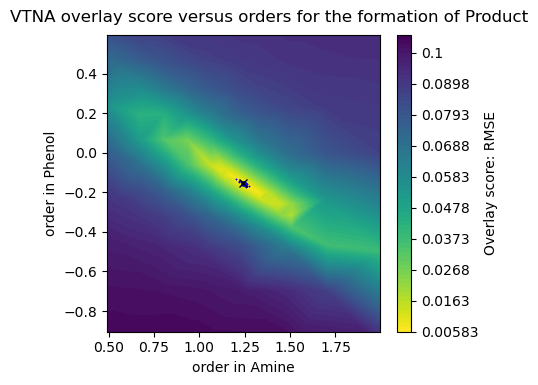

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E3_cropped.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.2425708853728397 -0.15466996685432105 0.005834312813930664


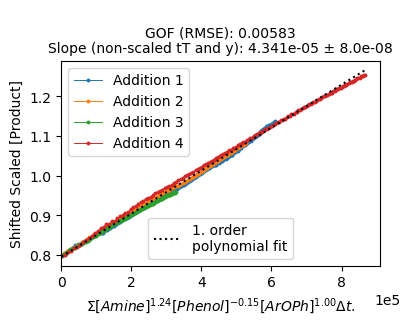

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E3_cropped_fixed_ArOPh_overlay_plot_V1.svg


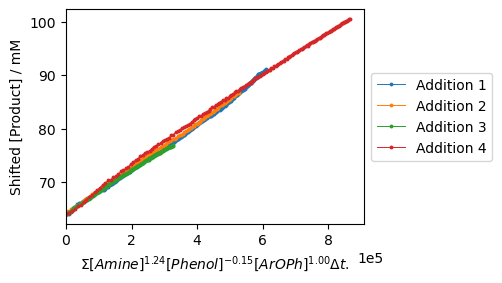

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E3_cropped.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.0', '0.0', '1.0']
Best reaction order(s) from the 2nd order exploration: ['1.23333', '-0.23333', '0.76667']
Best reaction order(s) from the 3rd order exploration: ['1.29867', '-0.168', '1.09333']
Best reaction order(s) from the 4th order exploration: ['1.23769', '-0.168', '0.97138']
Best reaction order(s) from the 5th order exploration: ['1.25476', '-0.15093', '1.05675']
Best reaction order(s) from the 6th order exploration: ['1.25476', '-0.15093', '1.04081']
Best reaction order(s) from the 7th order exploration: ['1.25922', '-0.14646', '1.06312']
Best reaction order(s) from the 8th order exploration: ['1.25922', '-0.14646', '1.06312']
Best reaction order(s) from the 9th order exploration: ['1.25806', '-0.14763', '1.05729']
The calculation is complete. Time elapsed: 1

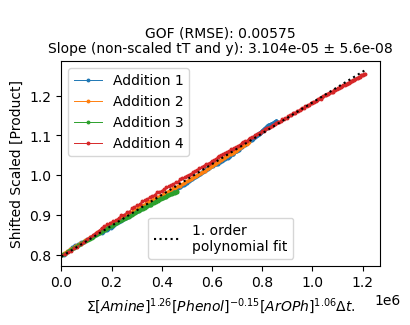

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E3_cropped_fixed_None_overlay_plot_V1.svg


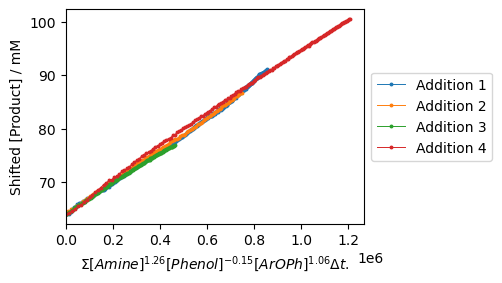

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E3_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


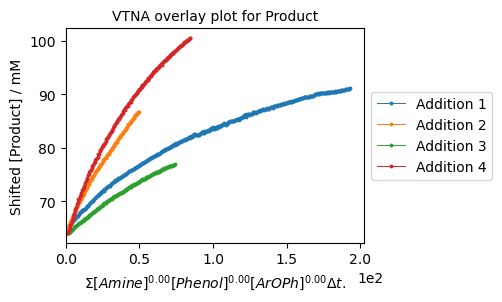

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E3_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\C2_cropped_SAKE_datasets\C2_E3_cropped.xlsx done
Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\C2_cropped_SAKE_datasets\C2_E4_cropped.xlsx
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.0', '0.0']
Best reaction order(s) from the 2nd order exploration: ['1.23333', '0.0']
Best reaction order(s) from the 3rd order exploration: ['1.29867', '-0.06533']
Best reaction order(s) from the 4th order exploration: ['1.29867', '-0.06533']
Best reaction order(s) from the 5th order exploration: ['1.34989', '-0.08241']
Best reaction order(s) from the 6th order exploration: ['1.31802', '-0.06647']
Best reaction order(s) from the 7th order exploration: ['1.32248', '-0.07093']
Best reaction order(s) from the 8th order exploration: ['1.32664', '-0.07093']
Best reaction order(s) from the 9th order

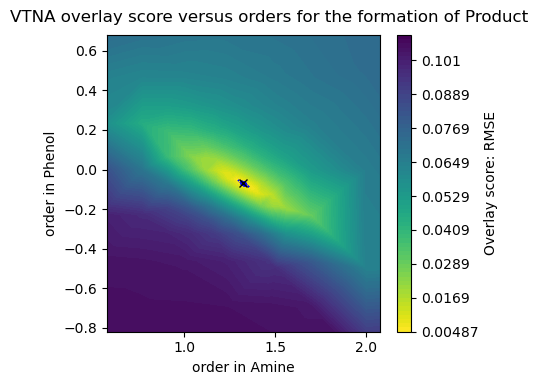

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E4_cropped.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.3254773239656295 -0.06976747689402472 0.004872971404282437


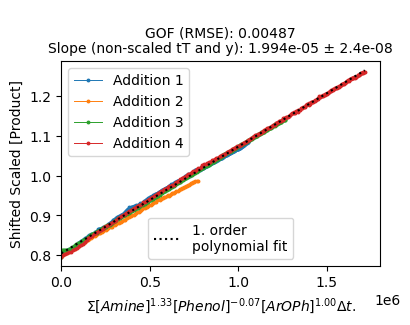

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E4_cropped_fixed_ArOPh_overlay_plot_V1.svg


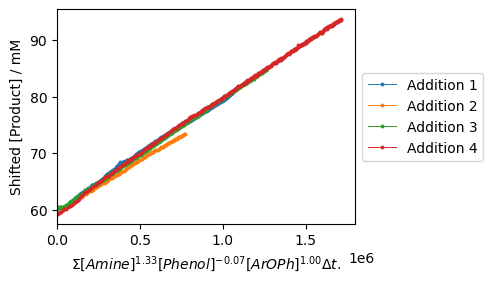

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E4_cropped.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.0', '0.0', '0.5']
Best reaction order(s) from the 2nd order exploration: ['1.23333', '0.0', '0.96667']
Best reaction order(s) from the 3rd order exploration: ['1.29867', '-0.06533', '0.90133']
Best reaction order(s) from the 4th order exploration: ['1.29867', '-0.06533', '0.96231']
Best reaction order(s) from the 5th order exploration: ['1.31574', '-0.08241', '0.94524']
Best reaction order(s) from the 6th order exploration: ['1.28387', '-0.06647', '0.9293']
Best reaction order(s) from the 7th order exploration: ['1.28833', '-0.07093', '0.92484']
Best reaction order(s) from the 8th order exploration: ['1.27584', '-0.06677', '0.91651']
Best reaction order(s) from the 9th order exploration: ['1.27934', '-0.06794', '0.91768']
The calculation is complete. Time elapsed: 341

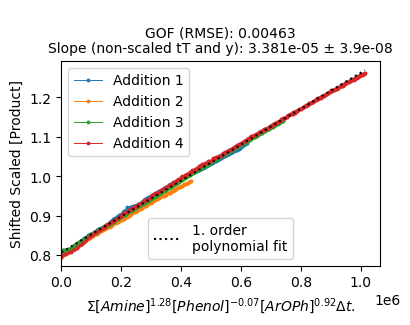

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E4_cropped_fixed_None_overlay_plot_V1.svg


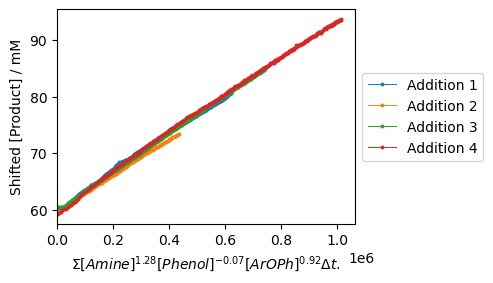

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E4_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


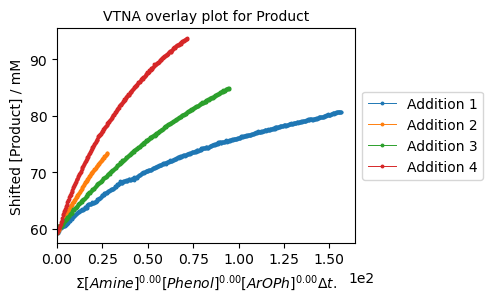

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E4_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\C2_cropped_SAKE_datasets\C2_E4_cropped.xlsx done
Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\C2_cropped_SAKE_datasets\C2_E5_cropped.xlsx
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.0', '0.0']
Best reaction order(s) from the 2nd order exploration: ['1.46667', '-0.23333']
Best reaction order(s) from the 3rd order exploration: ['1.40133', '-0.168']
Best reaction order(s) from the 4th order exploration: ['1.34036', '-0.10702']
Best reaction order(s) from the 5th order exploration: ['1.28913', '-0.08995']
Best reaction order(s) from the 6th order exploration: ['1.33694', '-0.12182']
Best reaction order(s) from the 7th order exploration: ['1.31463', '-0.10843']
Best reaction order(s) from the 8th order exploration: ['1.3188', '-0.1126']
Best reaction order(s) from the 9th orde

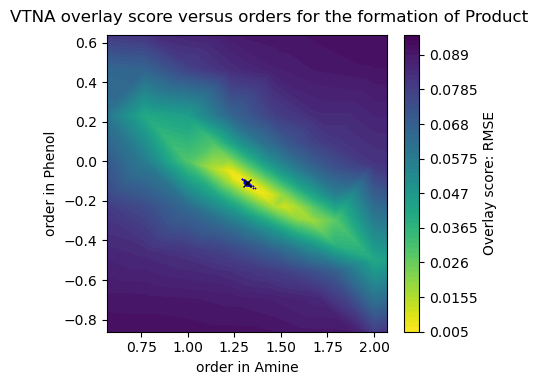

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E5_cropped.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.3176294922619256 -0.11143208307674078 0.005004592360254517


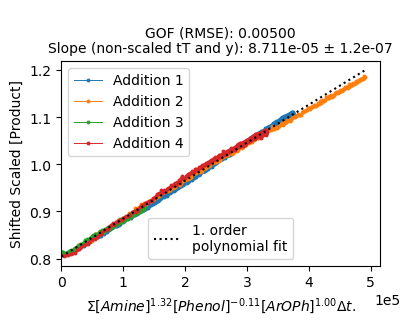

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E5_cropped_fixed_ArOPh_overlay_plot_V1.svg


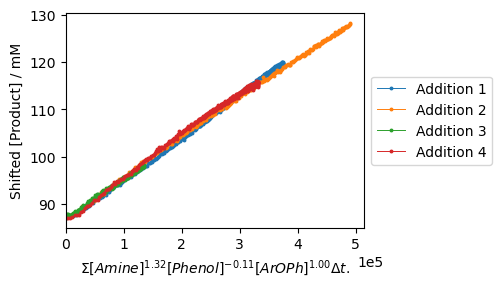

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E5_cropped.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
  Downsampled (unfixed): total rows 1534 → 1500
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.0', '0.0', '1.0']
Best reaction order(s) from the 2nd order exploration: ['1.46667', '-0.23333', '1.0']
Best reaction order(s) from the 3rd order exploration: ['1.27067', '-0.03733', '1.06533']
Best reaction order(s) from the 4th order exploration: ['1.33164', '-0.15929', '0.94338']
Best reaction order(s) from the 5th order exploration: ['1.28042', '-0.10807', '0.96045']
Best reaction order(s) from the 6th order exploration: ['1.29636', '-0.124', '0.96045']
Best reaction order(s) from the 7th order exploration: ['1.2919', '-0.11954', '0.96491']
Best reaction order(s) from the 8th order exploration: ['1.30023', '-0.11954', '0.96908']
Best reaction order(s) from the 9th order exploration: ['1.29673', '-0.12071', '0.96558']

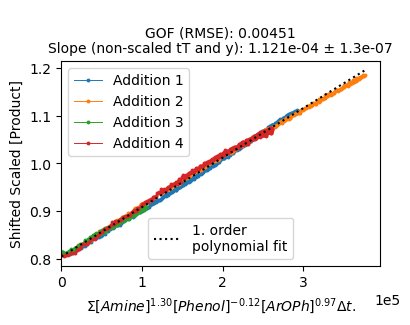

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E5_cropped_fixed_None_overlay_plot_V1.svg


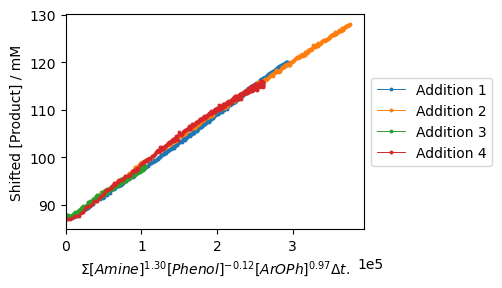

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E5_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


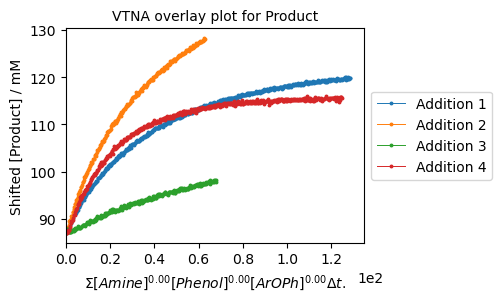

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E5_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\C2_cropped_SAKE_datasets\C2_E5_cropped.xlsx done
Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\C2_cropped_SAKE_datasets\C2_E6_cropped.xlsx
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.5', '0.0']
Best reaction order(s) from the 2nd order exploration: ['1.26667', '0.0']
Best reaction order(s) from the 3rd order exploration: ['1.46267', '-0.06533']
Best reaction order(s) from the 4th order exploration: ['1.46267', '-0.06533']
Best reaction order(s) from the 5th order exploration: ['1.44559', '-0.04826']
Best reaction order(s) from the 6th order exploration: ['1.46153', '-0.0642']
Best reaction order(s) from the 7th order exploration: ['1.45707', '-0.05973']
Best reaction order(s) from the 8th order exploration: ['1.4529', '-0.05973']
Best reaction order(s) from the 9th order e

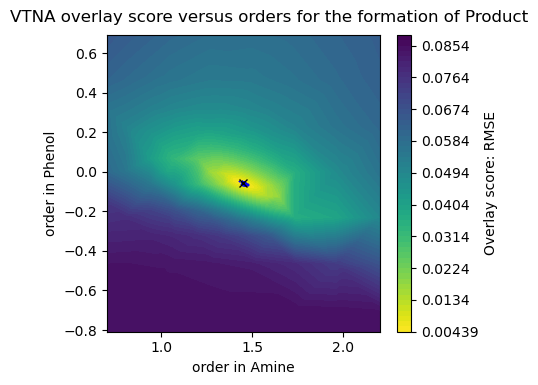

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E6_cropped.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.4517359278964939 -0.058567078671802504 0.00439424336599071


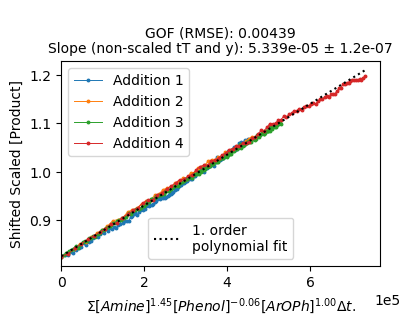

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E6_cropped_fixed_ArOPh_overlay_plot_V1.svg


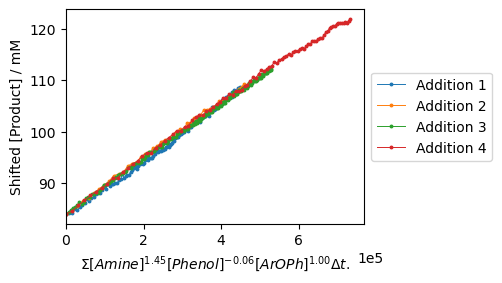

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E6_cropped.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.5', '0.0', '1.0']
Best reaction order(s) from the 2nd order exploration: ['1.5', '0.0', '1.23333']
Best reaction order(s) from the 3rd order exploration: ['1.56533', '-0.06533', '1.168']
Best reaction order(s) from the 4th order exploration: ['1.44338', '-0.06533', '0.98507']
Best reaction order(s) from the 5th order exploration: ['1.46045', '-0.04826', '1.03629']
Best reaction order(s) from the 6th order exploration: ['1.49232', '-0.04826', '1.08409']
Best reaction order(s) from the 7th order exploration: ['1.48786', '-0.05272', '1.07963']
Best reaction order(s) from the 8th order exploration: ['1.49203', '-0.04856', '1.09213']
Best reaction order(s) from the 9th order exploration: ['1.49552', '-0.04972', '1.09796']
The calculation is complete. Time elapsed: 68.7 sec

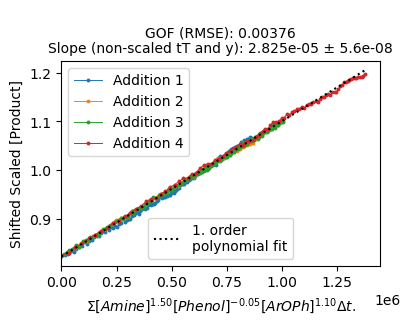

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E6_cropped_fixed_None_overlay_plot_V1.svg


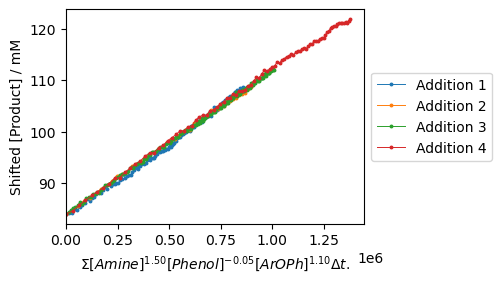

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E6_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


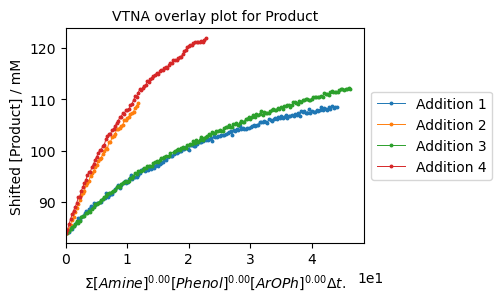

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E6_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\C2_cropped_SAKE_datasets\C2_E6_cropped.xlsx done
Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\C2_cropped_SAKE_datasets\C2_E7a_cropped.xlsx
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.5', '0.0']
Best reaction order(s) from the 2nd order exploration: ['1.96667', '-0.23333']
Best reaction order(s) from the 3rd order exploration: ['1.90133', '-0.168']
Best reaction order(s) from the 4th order exploration: ['1.77938', '-0.10702']
Best reaction order(s) from the 5th order exploration: ['1.79645', '-0.1241']
Best reaction order(s) from the 6th order exploration: ['1.78052', '-0.10816']
Best reaction order(s) from the 7th order exploration: ['1.78498', '-0.11262']
Best reaction order(s) from the 8th order exploration: ['1.78914', '-0.11262']
Best reaction order(s) from the 9th or

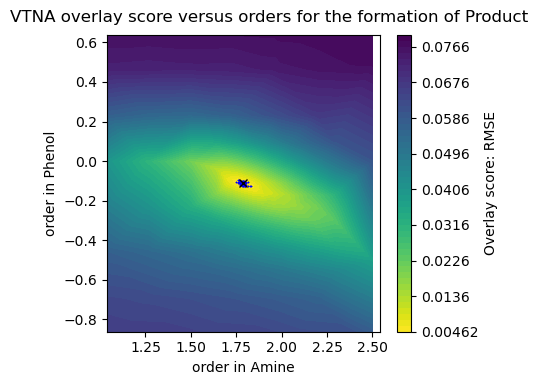

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E7a_cropped.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.789142460997531 -0.11262242133333336 0.004621479979785034


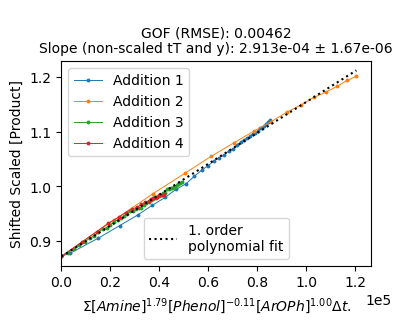

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E7a_cropped_fixed_ArOPh_overlay_plot_V1.svg


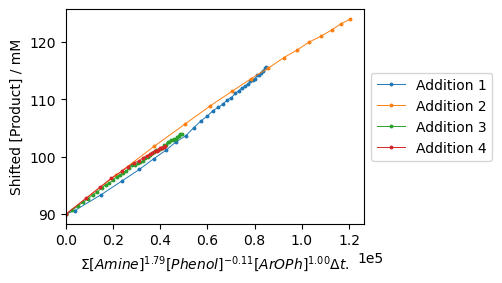

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E7a_cropped.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['2.0', '0.0', '1.5']
Best reaction order(s) from the 2nd order exploration: ['1.76667', '0.0', '1.26667']
Best reaction order(s) from the 3rd order exploration: ['1.832', '-0.06533', '1.07067']
Best reaction order(s) from the 4th order exploration: ['1.832', '-0.12631', '1.00969']
Best reaction order(s) from the 5th order exploration: ['1.78078', '-0.10924', '0.99262']
Best reaction order(s) from the 6th order exploration: ['1.79671', '-0.10924', '1.00855']
Best reaction order(s) from the 7th order exploration: ['1.79225', '-0.1137', '1.00409']
Best reaction order(s) from the 8th order exploration: ['1.79225', '-0.10953', '1.00825']
Best reaction order(s) from the 9th order exploration: ['1.79342', '-0.10837', '1.01175']
The calculation is complete. Time elapsed: 11.8 s

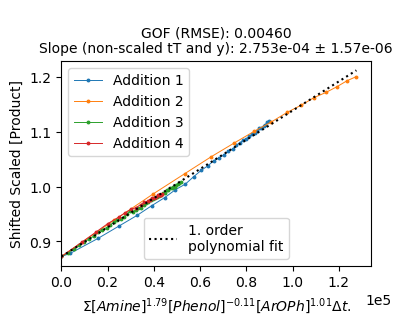

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E7a_cropped_fixed_None_overlay_plot_V1.svg


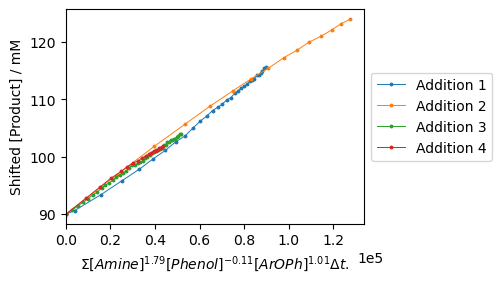

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E7a_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


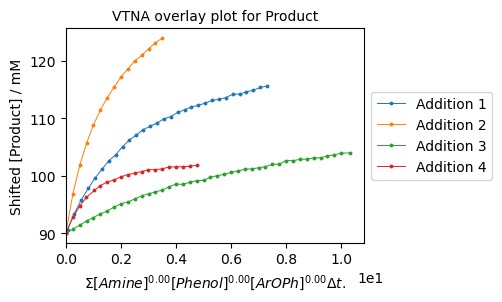

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E7a_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\C2_cropped_SAKE_datasets\C2_E7a_cropped.xlsx done
Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\C2_cropped_SAKE_datasets\C2_E7b_cropped.xlsx
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.5', '0.0']
Best reaction order(s) from the 2nd order exploration: ['1.96667', '-0.23333']
Best reaction order(s) from the 3rd order exploration: ['1.90133', '-0.168']
Best reaction order(s) from the 4th order exploration: ['1.77938', '-0.10702']
Best reaction order(s) from the 5th order exploration: ['1.72816', '-0.08995']
Best reaction order(s) from the 6th order exploration: ['1.77596', '-0.10588']
Best reaction order(s) from the 7th order exploration: ['1.76258', '-0.10142']
Best reaction order(s) from the 8th order exploration: ['1.77507', '-0.10559']
Best reaction order(s) from the 9th

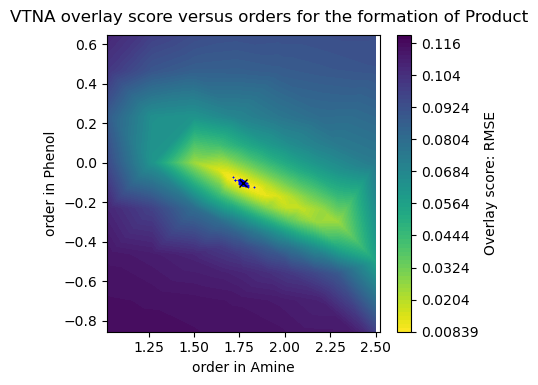

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E7b_cropped.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.7715724661191115 -0.10442045166933336 0.008389155095999573


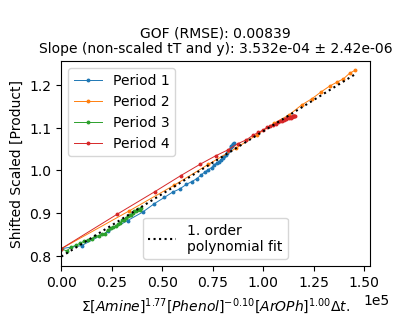

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E7b_cropped_fixed_ArOPh_overlay_plot_V1.svg


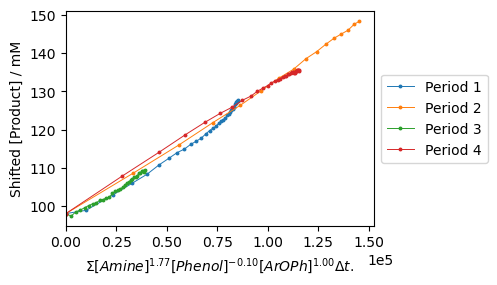

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E7b_cropped.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.5', '0.0', '1.0']
Best reaction order(s) from the 2nd order exploration: ['1.96667', '0.0', '1.23333']
Best reaction order(s) from the 3rd order exploration: ['1.77067', '-0.06533', '1.03733']
Best reaction order(s) from the 4th order exploration: ['1.83164', '-0.06533', '1.09831']
Best reaction order(s) from the 5th order exploration: ['1.78042', '-0.08241', '1.04709']
Best reaction order(s) from the 6th order exploration: ['1.79636', '-0.09834', '1.03115']
Best reaction order(s) from the 7th order exploration: ['1.80974', '-0.09388', '1.04454']
Best reaction order(s) from the 8th order exploration: ['1.80142', '-0.08972', '1.04454']
Best reaction order(s) from the 9th order exploration: ['1.80491', '-0.09088', '1.04571']
The calculation is complete. Time elapsed: 1

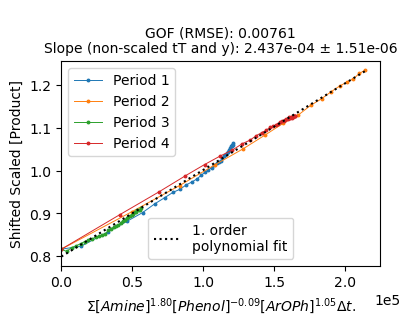

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E7b_cropped_fixed_None_overlay_plot_V1.svg


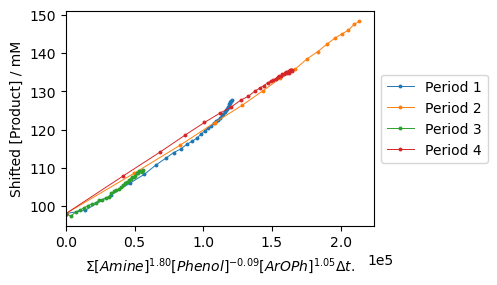

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E7b_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


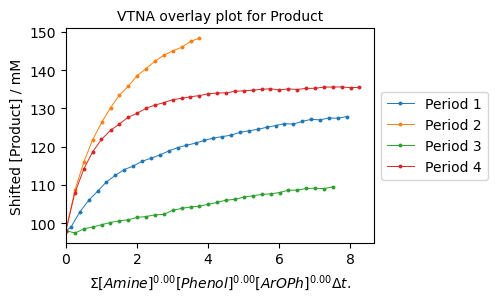

Saved SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_E7b_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\C2_cropped_SAKE_datasets\C2_E7b_cropped.xlsx done
Data saved to SAKE dataset analysis\Automatic VTNA\C2_Automatic_VTNA_Results\C2_Automatic_VTNA_Resultssummary_results_V1.csv


(['C:\\Users\\test_gv\\OneDrive - Imperial College London\\PhD\\SAKE publication with SI material\\Cleaned Python Scripts for Github\\SAKE dataset analysis\\Automatic VTNA\\C2_cropped_SAKE_datasets\\C2_E1_cropped.xlsx',
  'C:\\Users\\test_gv\\OneDrive - Imperial College London\\PhD\\SAKE publication with SI material\\Cleaned Python Scripts for Github\\SAKE dataset analysis\\Automatic VTNA\\C2_cropped_SAKE_datasets\\C2_E2_cropped_v2.xlsx',
  'C:\\Users\\test_gv\\OneDrive - Imperial College London\\PhD\\SAKE publication with SI material\\Cleaned Python Scripts for Github\\SAKE dataset analysis\\Automatic VTNA\\C2_cropped_SAKE_datasets\\C2_E3_cropped.xlsx',
  'C:\\Users\\test_gv\\OneDrive - Imperial College London\\PhD\\SAKE publication with SI material\\Cleaned Python Scripts for Github\\SAKE dataset analysis\\Automatic VTNA\\C2_cropped_SAKE_datasets\\C2_E4_cropped.xlsx',
  'C:\\Users\\test_gv\\OneDrive - Imperial College London\\PhD\\SAKE publication with SI material\\Cleaned Python Scr

In [14]:
Automatic_VTNA_bulk_analysis(Experiment_paths_cropped_C2,'Experiments_cropped_C2_Automatic_VTNA_Results.csv',folder_name='C2_Automatic_VTNA_Results',filename_addition='_V1',title_present=False,cwd=base_path)

### Campaign 3: Bronsted study for 1a with Various Cyclic Secondary Amines 2a-f

In [15]:
Experiment_names_C3=[i for i in Experiment_names if i[1]=='3']
Experiment_paths_C3=[path_datasets+i+'.xlsx' for i in Experiment_names_C3]

In [16]:
crop_largest_difference(Experiment_paths_C3, column="Product", percent_threshold=35.0,folder_name='C3_cropped_SAKE_datasets',cwd=base_path)


Processing: SAKE datasets\C3_E1.xlsx
  No cropping needed.
  Saved workbook → SAKE dataset analysis\Automatic VTNA\C3_cropped_SAKE_datasets\C3_E1_cropped.xlsx

Processing: SAKE datasets\C3_E2.xlsx
  Cropping 'Addition 4' (diff=36.99) → limit=36.10
  Saved modified workbook → SAKE dataset analysis\Automatic VTNA\C3_cropped_SAKE_datasets\C3_E2_cropped.xlsx

Processing: SAKE datasets\C3_E3.xlsx
  Cropping 'Addition 6' (diff=34.04) → limit=22.31
  Saved modified workbook → SAKE dataset analysis\Automatic VTNA\C3_cropped_SAKE_datasets\C3_E3_cropped.xlsx

Processing: SAKE datasets\C3_E4.xlsx
  Cropping 'Addition 4' (diff=57.20) → limit=38.15
  Saved modified workbook → SAKE dataset analysis\Automatic VTNA\C3_cropped_SAKE_datasets\C3_E4_cropped.xlsx

Processing: SAKE datasets\C3_E5.xlsx
  Cropping 'Addition 4' (diff=42.98) → limit=40.10
  Saved modified workbook → SAKE dataset analysis\Automatic VTNA\C3_cropped_SAKE_datasets\C3_E5_cropped.xlsx


In [17]:
path_cropped_datasets=os.getcwd()+'\\C3_cropped_SAKE_datasets'
Experiment_paths_cropped_C3=[path_cropped_datasets+'\\'+i+'_cropped.xlsx' for i in Experiment_names_C3]

Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\C3_cropped_SAKE_datasets\C3_E1_cropped.xlsx
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.0', '0.0']
Best reaction order(s) from the 2nd order exploration: ['1.23333', '0.0']
Best reaction order(s) from the 3rd order exploration: ['1.29867', '-0.06533']
Best reaction order(s) from the 4th order exploration: ['1.42062', '-0.12631']
Best reaction order(s) from the 5th order exploration: ['1.40355', '-0.10924']
Best reaction order(s) from the 6th order exploration: ['1.37168', '-0.0933']
Best reaction order(s) from the 7th order exploration: ['1.37614', '-0.09776']
Best reaction order(s) from the 8th order exploration: ['1.37197', '-0.09776']
Best reaction order(s) from the 9th order exploration: ['1.37314', '-0.0966']
The calculation is complete. Time elapsed: 1.3 seconds


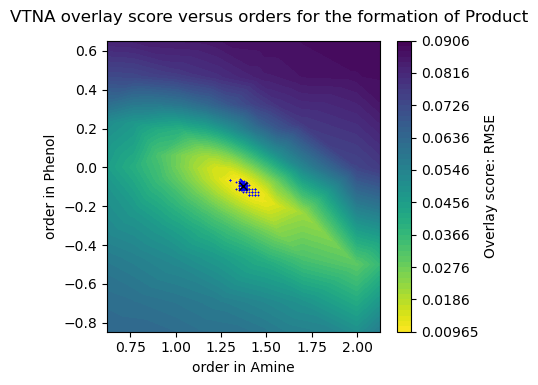

Saved SAKE dataset analysis\Automatic VTNA\C3_Automatic_VTNA_Results\C3_E1_cropped.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.3731409112936297 -0.09659769911624695 0.009647537154493145


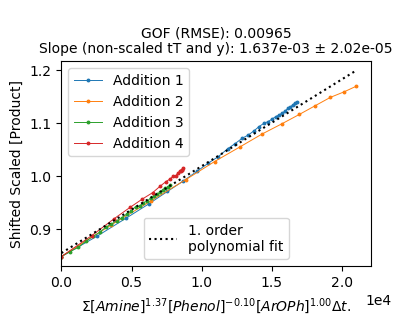

Saved SAKE dataset analysis\Automatic VTNA\C3_Automatic_VTNA_Results\C3_E1_cropped_fixed_ArOPh_overlay_plot_V1.svg


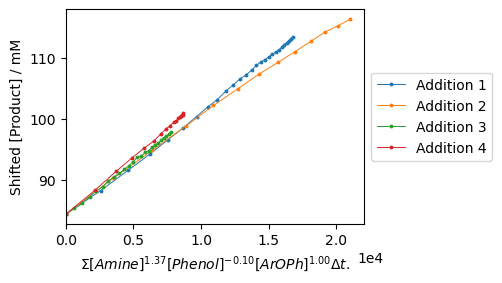

Saved SAKE dataset analysis\Automatic VTNA\C3_Automatic_VTNA_Results\C3_E1_cropped.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.0', '0.0', '1.0']
Best reaction order(s) from the 2nd order exploration: ['1.23333', '-0.23333', '0.76667']
Best reaction order(s) from the 3rd order exploration: ['1.29867', '-0.168', '0.832']
Best reaction order(s) from the 4th order exploration: ['1.29867', '-0.168', '0.832']
Best reaction order(s) from the 5th order exploration: ['1.31574', '-0.15093', '0.84907']
Best reaction order(s) from the 6th order exploration: ['1.28387', '-0.16686', '0.8172']
Best reaction order(s) from the 7th order exploration: ['1.29726', '-0.1624', '0.83059']
Best reaction order(s) from the 8th order exploration: ['1.29309', '-0.1624', '0.82642']
Best reaction order(s) from the 9th order exploration: ['1.29192', '-0.16123', '0.82759']
The calculation is complete. Time elapsed: 9.1 seco

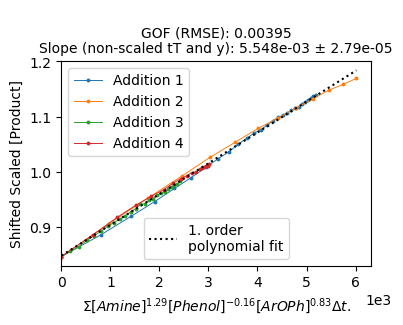

Saved SAKE dataset analysis\Automatic VTNA\C3_Automatic_VTNA_Results\C3_E1_cropped_fixed_None_overlay_plot_V1.svg


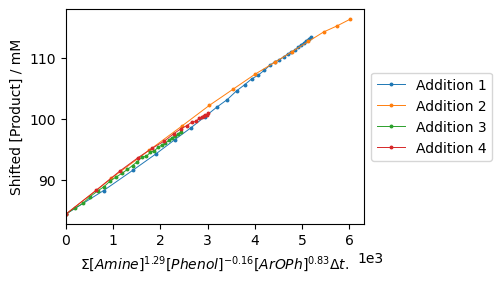

Saved SAKE dataset analysis\Automatic VTNA\C3_Automatic_VTNA_Results\C3_E1_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


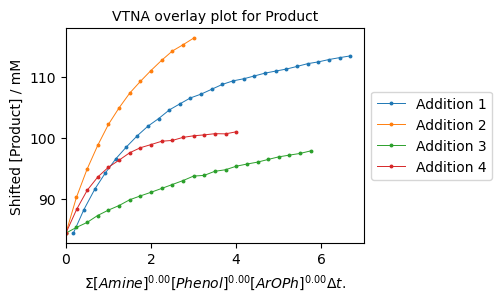

Saved SAKE dataset analysis\Automatic VTNA\C3_Automatic_VTNA_Results\C3_E1_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\C3_cropped_SAKE_datasets\C3_E1_cropped.xlsx done
Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\C3_cropped_SAKE_datasets\C3_E2_cropped.xlsx
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.0', '0.0']
Best reaction order(s) from the 2nd order exploration: ['1.23333', '0.0']
Best reaction order(s) from the 3rd order exploration: ['1.29867', '-0.06533']
Best reaction order(s) from the 4th order exploration: ['1.23769', '-0.06533']
Best reaction order(s) from the 5th order exploration: ['1.25476', '-0.08241']
Best reaction order(s) from the 6th order exploration: ['1.25476', '-0.08241']
Best reaction order(s) from the 7th order exploration: ['1.2503', '-0.07795']
Best reaction order(s) from the 8th order exploration: ['1.24197', '-0.07378']
Best reaction order(s) from the 9th order 

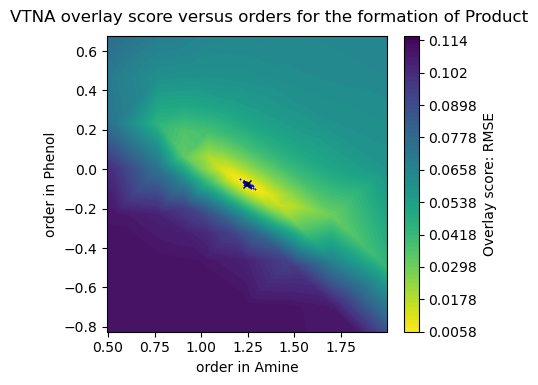

Saved SAKE dataset analysis\Automatic VTNA\C3_Automatic_VTNA_Results\C3_E2_cropped.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.2454699178413826 -0.07494673529362965 0.005802282844763347


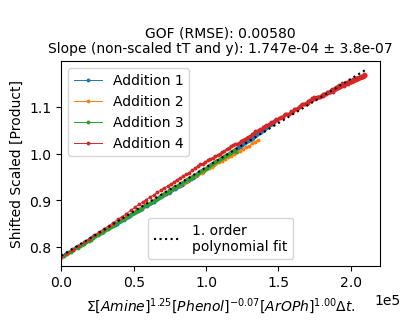

Saved SAKE dataset analysis\Automatic VTNA\C3_Automatic_VTNA_Results\C3_E2_cropped_fixed_ArOPh_overlay_plot_V1.svg


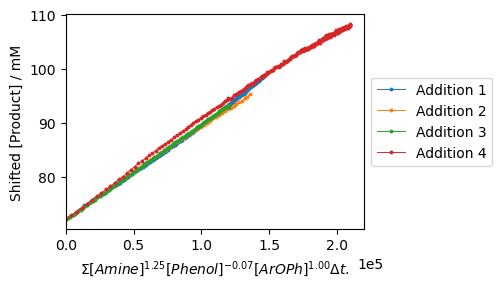

Saved SAKE dataset analysis\Automatic VTNA\C3_Automatic_VTNA_Results\C3_E2_cropped.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.5', '0.0', '1.5']
Best reaction order(s) from the 2nd order exploration: ['1.26667', '0.0', '1.03333']
Best reaction order(s) from the 3rd order exploration: ['1.332', '-0.06533', '1.09867']
Best reaction order(s) from the 4th order exploration: ['1.27102', '-0.06533', '1.03769']
Best reaction order(s) from the 5th order exploration: ['1.25395', '-0.04826', '1.05476']
Best reaction order(s) from the 6th order exploration: ['1.28582', '-0.0642', '1.0707']
Best reaction order(s) from the 7th order exploration: ['1.28136', '-0.06866', '1.05731']
Best reaction order(s) from the 8th order exploration: ['1.28136', '-0.06866', '1.05315']
Best reaction order(s) from the 9th order exploration: ['1.28252', '-0.06749', '1.05665']
The calculation is complete. Time elapsed: 94.7 s

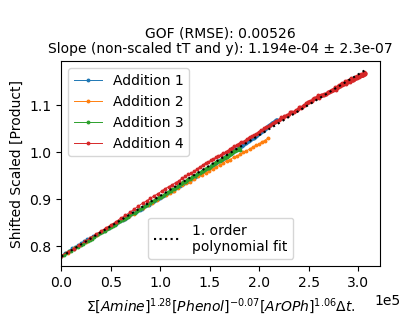

Saved SAKE dataset analysis\Automatic VTNA\C3_Automatic_VTNA_Results\C3_E2_cropped_fixed_None_overlay_plot_V1.svg


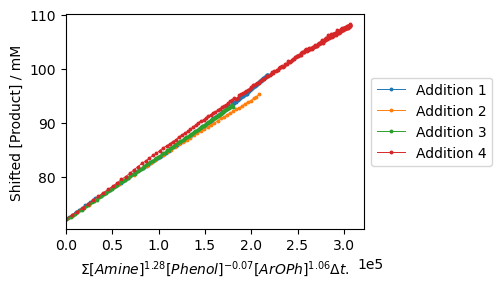

Saved SAKE dataset analysis\Automatic VTNA\C3_Automatic_VTNA_Results\C3_E2_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


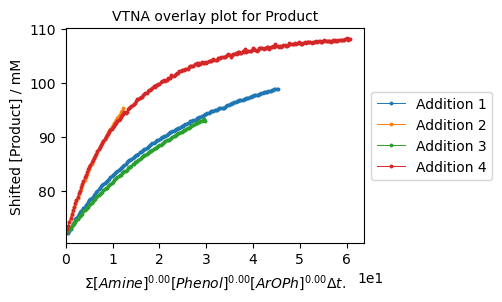

Saved SAKE dataset analysis\Automatic VTNA\C3_Automatic_VTNA_Results\C3_E2_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\C3_cropped_SAKE_datasets\C3_E2_cropped.xlsx done
Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\C3_cropped_SAKE_datasets\C3_E3_cropped.xlsx
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.0', '0.0']
Best reaction order(s) from the 2nd order exploration: ['1.46667', '-0.23333']
Best reaction order(s) from the 3rd order exploration: ['1.40133', '-0.168']
Best reaction order(s) from the 4th order exploration: ['1.34036', '-0.168']
Best reaction order(s) from the 5th order exploration: ['1.39158', '-0.18507']
Best reaction order(s) from the 6th order exploration: ['1.37564', '-0.16914']
Best reaction order(s) from the 7th order exploration: ['1.3801', '-0.1736']
Best reaction order(s) from the 8th order exploration: ['1.38843', '-0.17776']
Best reaction order(s) from the 9th order 

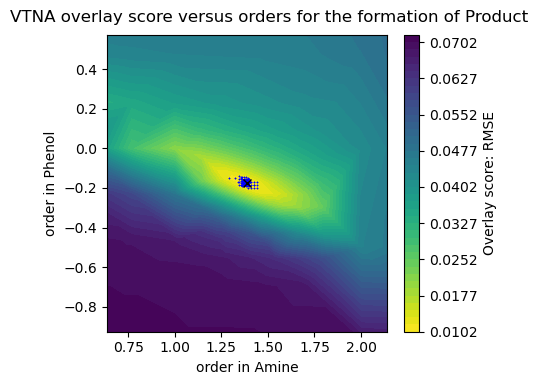

Saved SAKE dataset analysis\Automatic VTNA\C3_Automatic_VTNA_Results\C3_E3_cropped.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.3872662228890862 -0.17659862766933335 0.01017558165297023


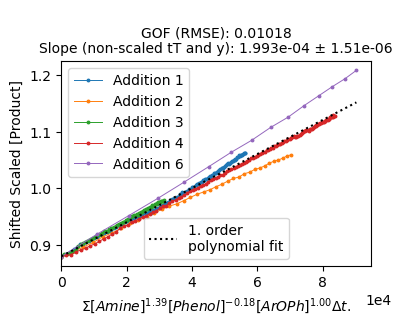

Saved SAKE dataset analysis\Automatic VTNA\C3_Automatic_VTNA_Results\C3_E3_cropped_fixed_ArOPh_overlay_plot_V1.svg


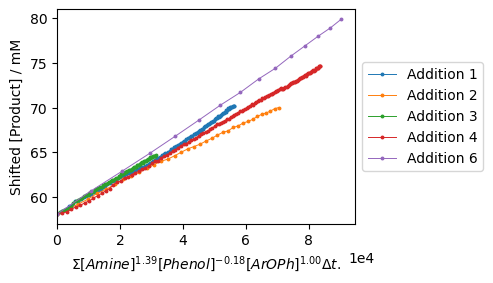

Saved SAKE dataset analysis\Automatic VTNA\C3_Automatic_VTNA_Results\C3_E3_cropped.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.0', '0.0', '1.0']
Best reaction order(s) from the 2nd order exploration: ['1.46667', '-0.23333', '1.0']
Best reaction order(s) from the 3rd order exploration: ['1.40133', '-0.168', '1.06533']
Best reaction order(s) from the 4th order exploration: ['1.34036', '-0.10702', '1.24827']
Best reaction order(s) from the 5th order exploration: ['1.35743', '-0.1241', '1.19705']
Best reaction order(s) from the 6th order exploration: ['1.34149', '-0.1241', '1.18111']
Best reaction order(s) from the 7th order exploration: ['1.35488', '-0.12856', '1.17665']
Best reaction order(s) from the 8th order exploration: ['1.35072', '-0.12856', '1.17248']
Best reaction order(s) from the 9th order exploration: ['1.35188', '-0.12739', '1.17598']
The calculation is complete. Time elapsed: 52.0 

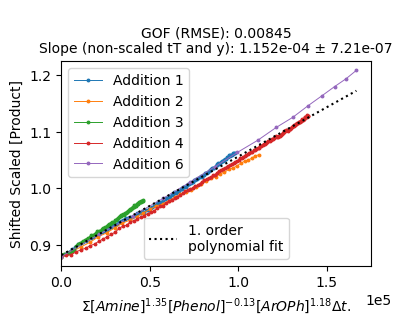

Saved SAKE dataset analysis\Automatic VTNA\C3_Automatic_VTNA_Results\C3_E3_cropped_fixed_None_overlay_plot_V1.svg


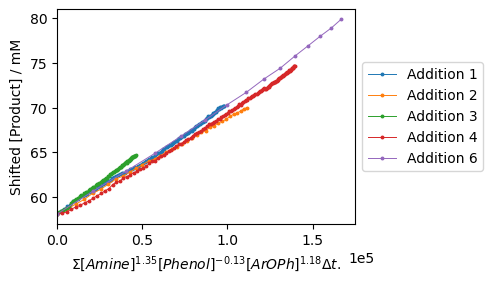

Saved SAKE dataset analysis\Automatic VTNA\C3_Automatic_VTNA_Results\C3_E3_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


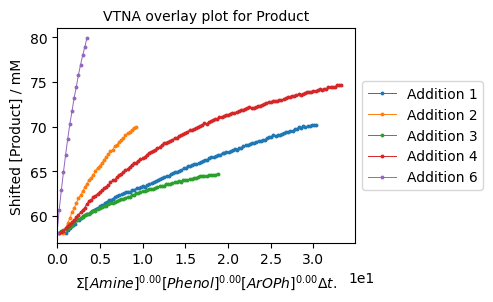

Saved SAKE dataset analysis\Automatic VTNA\C3_Automatic_VTNA_Results\C3_E3_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\C3_cropped_SAKE_datasets\C3_E3_cropped.xlsx done
Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\C3_cropped_SAKE_datasets\C3_E4_cropped.xlsx
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.0', '0.0']
Best reaction order(s) from the 2nd order exploration: ['1.23333', '0.0']
Best reaction order(s) from the 3rd order exploration: ['1.168', '-0.06533']
Best reaction order(s) from the 4th order exploration: ['1.22898', '-0.06533']
Best reaction order(s) from the 5th order exploration: ['1.31435', '-0.11655']
Best reaction order(s) from the 6th order exploration: ['1.28248', '-0.10062']
Best reaction order(s) from the 7th order exploration: ['1.28694', '-0.10508']
Best reaction order(s) from the 8th order exploration: ['1.28277', '-0.10092']
Best reaction order(s) from the 9th order e

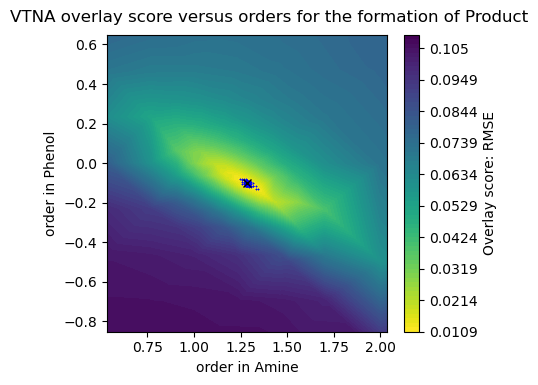

Saved SAKE dataset analysis\Automatic VTNA\C3_Automatic_VTNA_Results\C3_E4_cropped.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.283939133515852 -0.1020826594417778 0.010908849622381105


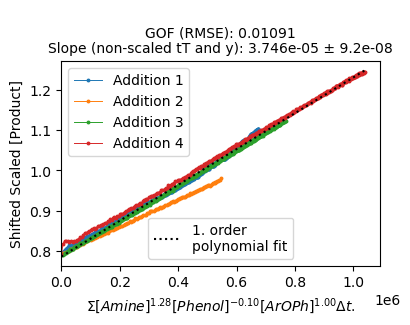

Saved SAKE dataset analysis\Automatic VTNA\C3_Automatic_VTNA_Results\C3_E4_cropped_fixed_ArOPh_overlay_plot_V1.svg


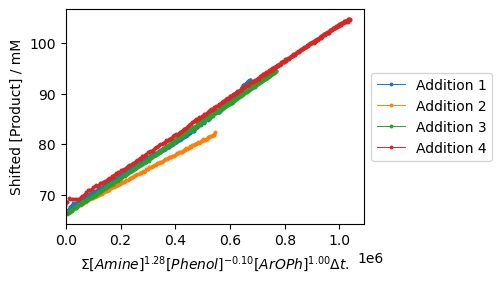

Saved SAKE dataset analysis\Automatic VTNA\C3_Automatic_VTNA_Results\C3_E4_cropped.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
  Downsampled (unfixed): total rows 1758 → 1500
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['0.5', '0.0', '0.0']
Best reaction order(s) from the 2nd order exploration: ['0.96667', '0.0', '0.7']
Best reaction order(s) from the 3rd order exploration: ['1.032', '-0.06533', '0.63467']
Best reaction order(s) from the 4th order exploration: ['1.15396', '-0.12631', '0.69564']
Best reaction order(s) from the 5th order exploration: ['1.13688', '-0.10924', '0.71272']
Best reaction order(s) from the 6th order exploration: ['1.10501', '-0.10924', '0.66491']
Best reaction order(s) from the 7th order exploration: ['1.10055', '-0.1137', '0.6426']
Best reaction order(s) from the 8th order exploration: ['1.10888', '-0.1137', '0.6551']
Best reaction order(s) from the 9th order exploration: ['1.10538', '-0.11253', '0.65393']
The cal

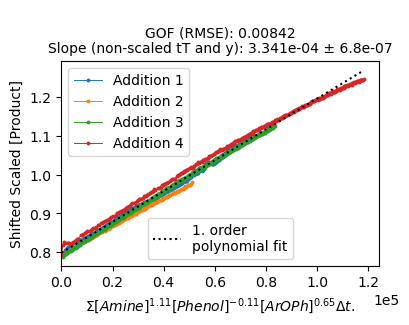

Saved SAKE dataset analysis\Automatic VTNA\C3_Automatic_VTNA_Results\C3_E4_cropped_fixed_None_overlay_plot_V1.svg


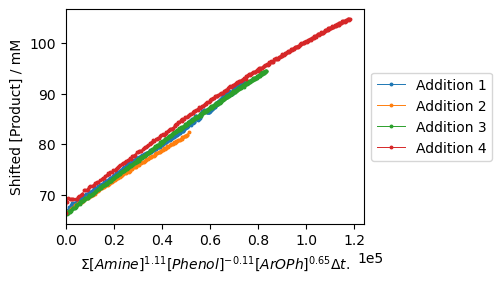

Saved SAKE dataset analysis\Automatic VTNA\C3_Automatic_VTNA_Results\C3_E4_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


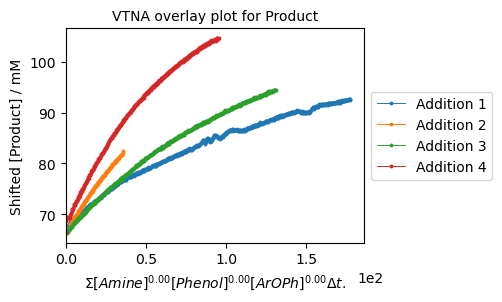

Saved SAKE dataset analysis\Automatic VTNA\C3_Automatic_VTNA_Results\C3_E4_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\C3_cropped_SAKE_datasets\C3_E4_cropped.xlsx done
Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\C3_cropped_SAKE_datasets\C3_E5_cropped.xlsx
  Downsampled (fixed (ArOPh)): total rows 4322 → 3000
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.5', '0.0']
Best reaction order(s) from the 2nd order exploration: ['1.26667', '0.0']
Best reaction order(s) from the 3rd order exploration: ['1.332', '-0.06533']
Best reaction order(s) from the 4th order exploration: ['1.39298', '-0.06533']
Best reaction order(s) from the 5th order exploration: ['1.3759', '-0.08241']
Best reaction order(s) from the 6th order exploration: ['1.39184', '-0.08241']
Best reaction order(s) from the 7th order exploration: ['1.38738', '-0.07795']
Best reaction order(s) from the 8th order exploration: ['1.38321', '-

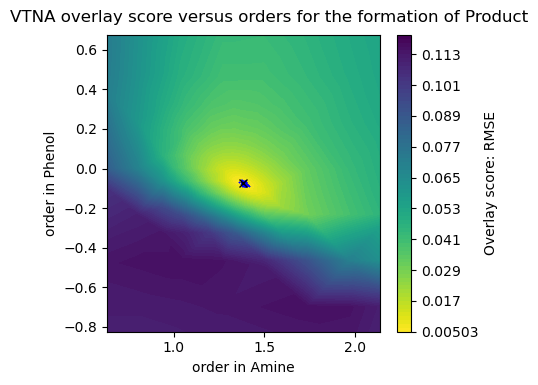

Saved SAKE dataset analysis\Automatic VTNA\C3_Automatic_VTNA_Results\C3_E5_cropped.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.3843791501084446 -0.07494673529362965 0.005029702114377079


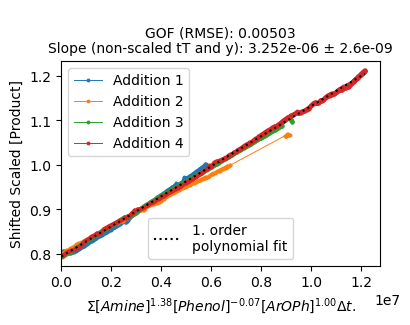

Saved SAKE dataset analysis\Automatic VTNA\C3_Automatic_VTNA_Results\C3_E5_cropped_fixed_ArOPh_overlay_plot_V1.svg


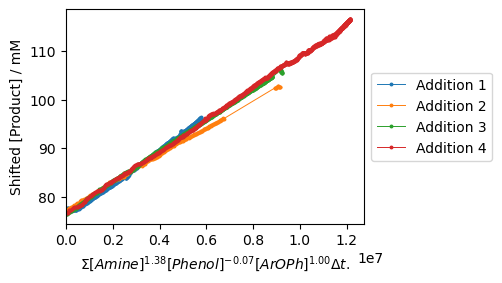

Saved SAKE dataset analysis\Automatic VTNA\C3_Automatic_VTNA_Results\C3_E5_cropped.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
  Downsampled (unfixed): total rows 4322 → 1500
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.5', '0.0', '1.0']
Best reaction order(s) from the 2nd order exploration: ['1.26667', '0.0', '1.0']
Best reaction order(s) from the 3rd order exploration: ['1.332', '-0.06533', '0.93467']
Best reaction order(s) from the 4th order exploration: ['1.332', '-0.06533', '0.93467']
Best reaction order(s) from the 5th order exploration: ['1.34907', '-0.08241', '0.95174']
Best reaction order(s) from the 6th order exploration: ['1.33314', '-0.08241', '0.9358']
Best reaction order(s) from the 7th order exploration: ['1.32868', '-0.07795', '0.93134']
Best reaction order(s) from the 8th order exploration: ['1.33284', '-0.07795', '0.93551']
Best reaction order(s) from the 9th order exploration: ['1.33167', '-0.07678', '0.93667']
The ca

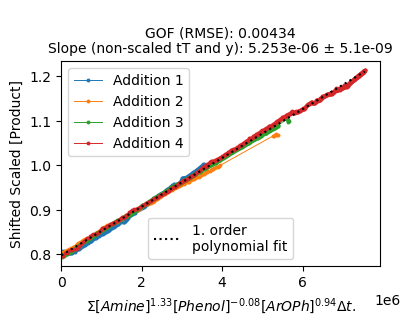

Saved SAKE dataset analysis\Automatic VTNA\C3_Automatic_VTNA_Results\C3_E5_cropped_fixed_None_overlay_plot_V1.svg


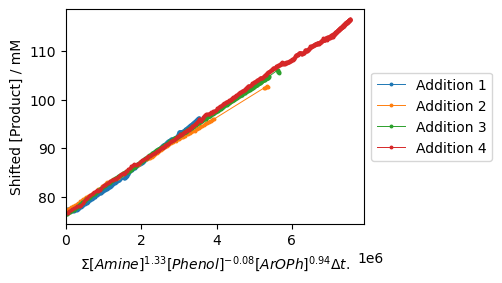

Saved SAKE dataset analysis\Automatic VTNA\C3_Automatic_VTNA_Results\C3_E5_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


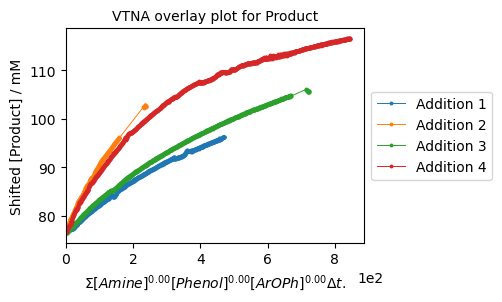

Saved SAKE dataset analysis\Automatic VTNA\C3_Automatic_VTNA_Results\C3_E5_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\C3_cropped_SAKE_datasets\C3_E5_cropped.xlsx done
Data saved to SAKE dataset analysis\Automatic VTNA\C3_Automatic_VTNA_Results\C3_Automatic_VTNA_Resultssummary_results_V1.csv


In [18]:
calc_C3=Automatic_VTNA_bulk_analysis(Experiment_paths_cropped_C3,'Experiments_cropped_C3_Automatic_VTNA_Results.csv',folder_name='C3_Automatic_VTNA_Results',filename_addition='_V1',title_present=False,cwd=base_path)

### Campaign 4: Solvents Effect Study

In [19]:
Experiment_names_C4=[i for i in Experiment_names if i[1]=='4']
Experiment_paths_C4=[path_datasets+i+'.xlsx' for i in Experiment_names_C4]

In [20]:
crop_largest_difference(Experiment_paths_C4, column="Product", percent_threshold=35.0,folder_name='C4_cropped_SAKE_datasets',cwd=base_path)


Processing: SAKE datasets\C4_E10.xlsx
  No cropping needed.
  Saved workbook → SAKE dataset analysis\Automatic VTNA\C4_cropped_SAKE_datasets\C4_E10_cropped.xlsx

Processing: SAKE datasets\C4_E11.xlsx
  Cropping 'Addition 3' (diff=41.01) → limit=33.29
  Saved modified workbook → SAKE dataset analysis\Automatic VTNA\C4_cropped_SAKE_datasets\C4_E11_cropped.xlsx

Processing: SAKE datasets\C4_E1a.xlsx
  Cropping 'Addition 3' (diff=62.16) → limit=35.74
  Saved modified workbook → SAKE dataset analysis\Automatic VTNA\C4_cropped_SAKE_datasets\C4_E1a_cropped.xlsx

Processing: SAKE datasets\C4_E1b.xlsx
  Cropping 'Addition 3' (diff=21.68) → limit=17.98
  Saved modified workbook → SAKE dataset analysis\Automatic VTNA\C4_cropped_SAKE_datasets\C4_E1b_cropped.xlsx

Processing: SAKE datasets\C4_E2.xlsx
  No cropping needed.
  Saved workbook → SAKE dataset analysis\Automatic VTNA\C4_cropped_SAKE_datasets\C4_E2_cropped.xlsx

Processing: SAKE datasets\C4_E3.xlsx
  Cropping 'Addition 4' (diff=57.25) → l

In [21]:
path_cropped_datasets=os.getcwd()+'\\C4_cropped_SAKE_datasets'
Experiment_paths_cropped_C4=[path_cropped_datasets + "\\" + i + ("_cropped_v2.xlsx" if "E6" in i else "_cropped.xlsx")  for i in Experiment_names_C4]

Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\C4_cropped_SAKE_datasets\C4_E10_cropped.xlsx
  Downsampled (fixed (ArOPh)): total rows 3601 → 3000
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.5', '0.0']
Best reaction order(s) from the 2nd order exploration: ['1.5', '0.0']
Best reaction order(s) from the 3rd order exploration: ['1.43467', '-0.06533']
Best reaction order(s) from the 4th order exploration: ['1.55662', '-0.12631']
Best reaction order(s) from the 5th order exploration: ['1.53955', '-0.10924']
Best reaction order(s) from the 6th order exploration: ['1.53955', '-0.10924']
Best reaction order(s) from the 7th order exploration: ['1.54401', '-0.1137']
Best reaction order(s) from the 8th order exploration: ['1.54817', '-0.1137']
Best reaction order(s) from the 9th order exploration: ['1.54934', '-0.11487']
The calculation is complete. Time elapsed: 145.8 seconds


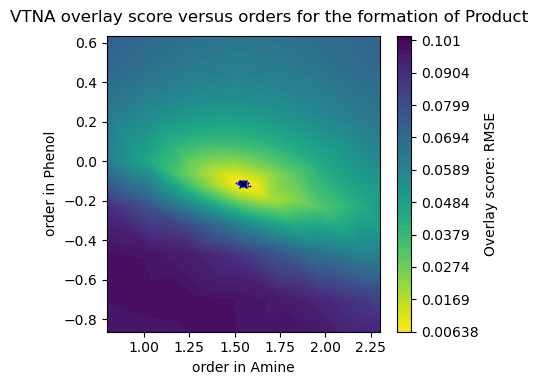

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E10_cropped.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.5481748758123457 -0.11369928059259264 0.006384848197916458


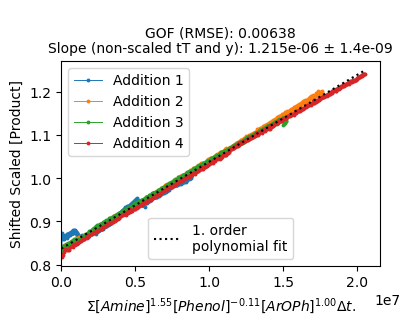

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E10_cropped_fixed_ArOPh_overlay_plot_V1.svg


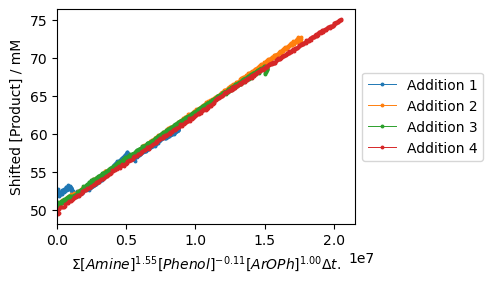

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E10_cropped.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
  Downsampled (unfixed): total rows 3601 → 1500
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.5', '0.0', '1.5']
Best reaction order(s) from the 2nd order exploration: ['1.73333', '0.0', '1.73333']
Best reaction order(s) from the 3rd order exploration: ['1.668', '-0.06533', '1.40667']
Best reaction order(s) from the 4th order exploration: ['1.60702', '-0.06533', '1.28471']
Best reaction order(s) from the 5th order exploration: ['1.6241', '-0.08241', '1.26764']
Best reaction order(s) from the 6th order exploration: ['1.60816', '-0.08241', '1.23577']
Best reaction order(s) from the 7th order exploration: ['1.6037', '-0.08687', '1.21346']
Best reaction order(s) from the 8th order exploration: ['1.6037', '-0.09103', '1.20096']
Best reaction order(s) from the 9th order exploration: ['1.60253', '-0.0922', '1.19513']
Th

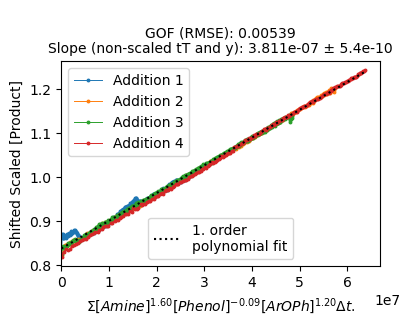

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E10_cropped_fixed_None_overlay_plot_V1.svg


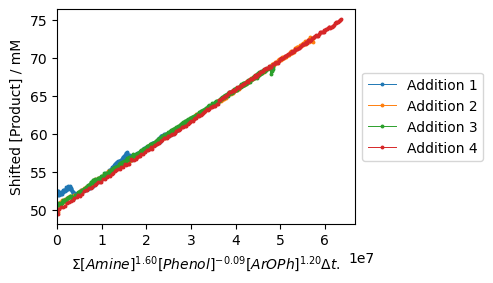

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E10_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


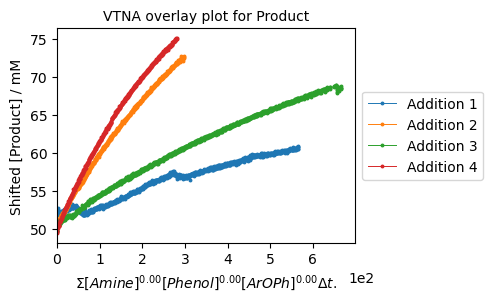

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E10_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\C4_cropped_SAKE_datasets\C4_E10_cropped.xlsx done
Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\C4_cropped_SAKE_datasets\C4_E11_cropped.xlsx
  Downsampled (fixed (ArOPh)): total rows 3592 → 3000
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.0', '0.0']
Best reaction order(s) from the 2nd order exploration: ['0.76667', '0.46667']
Best reaction order(s) from the 3rd order exploration: ['0.96267', '0.14']
Best reaction order(s) from the 4th order exploration: ['1.1456', '-0.04293']
Best reaction order(s) from the 5th order exploration: ['1.19682', '-0.09415']
Best reaction order(s) from the 6th order exploration: ['1.16495', '-0.04635']
Best reaction order(s) from the 7th order exploration: ['1.16941', '-0.05081']
Best reaction order(s) from the 8th order exploration: ['1.17774

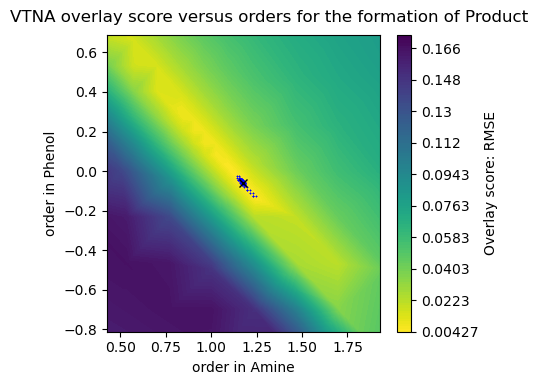

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E11_cropped.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.1765751414076049 -0.06213743292365452 0.004267111931081425


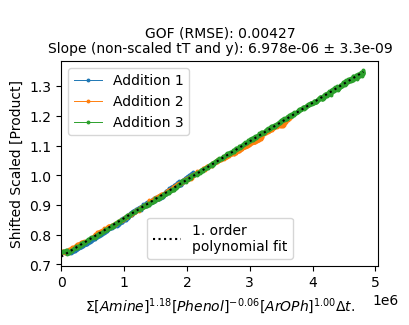

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E11_cropped_fixed_ArOPh_overlay_plot_V1.svg


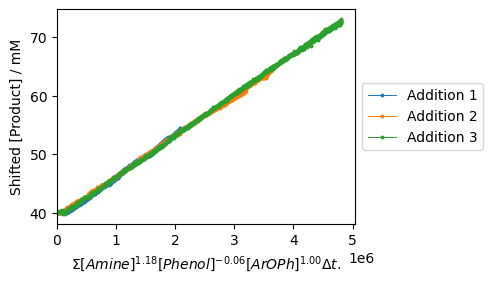

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E11_cropped.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
  Downsampled (unfixed): total rows 3592 → 1500
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.0', '0.0', '1.0']
Best reaction order(s) from the 2nd order exploration: ['1.0', '0.0', '0.76667']
Best reaction order(s) from the 3rd order exploration: ['1.06533', '0.06533', '0.96267']
Best reaction order(s) from the 4th order exploration: ['1.18729', '-0.05662', '1.02364']
Best reaction order(s) from the 5th order exploration: ['1.13607', '-0.03955', '0.97242']
Best reaction order(s) from the 6th order exploration: ['1.152', '-0.03955', '0.98836']
Best reaction order(s) from the 7th order exploration: ['1.15647', '-0.05293', '0.9839']
Best reaction order(s) from the 8th order exploration: ['1.15647', '-0.05293', '0.97973']
Best reaction order(s) from the 9th order exploration: ['1.15763', '-0.05177', '0.98323']
The 

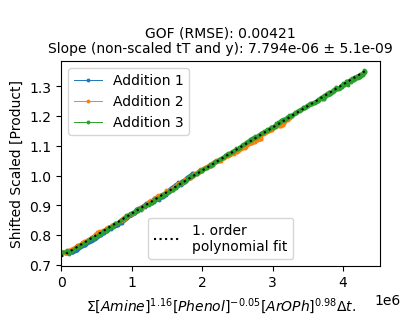

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E11_cropped_fixed_None_overlay_plot_V1.svg


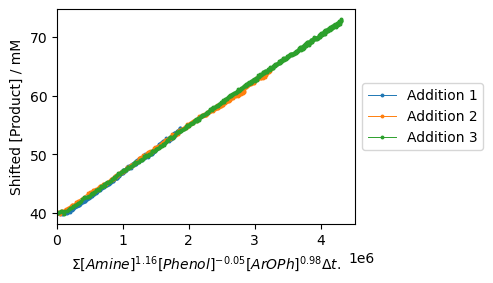

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E11_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


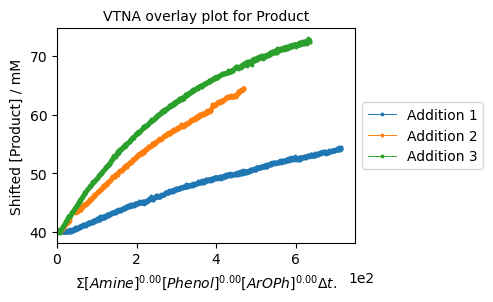

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E11_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\C4_cropped_SAKE_datasets\C4_E11_cropped.xlsx done
Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\C4_cropped_SAKE_datasets\C4_E1a_cropped.xlsx
  Downsampled (fixed (ArOPh)): total rows 3833 → 3000
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['2.0', '-0.5']
Best reaction order(s) from the 2nd order exploration: ['1.76667', '-0.26667']
Best reaction order(s) from the 3rd order exploration: ['1.44', '-0.07067']
Best reaction order(s) from the 4th order exploration: ['1.50098', '-0.13164']
Best reaction order(s) from the 5th order exploration: ['1.4839', '-0.11457']
Best reaction order(s) from the 6th order exploration: ['1.53171', '-0.14644']
Best reaction order(s) from the 7th order exploration: ['1.5094', '-0.13306']
Best reaction order(s) from the 8th order exploration: ['1.513

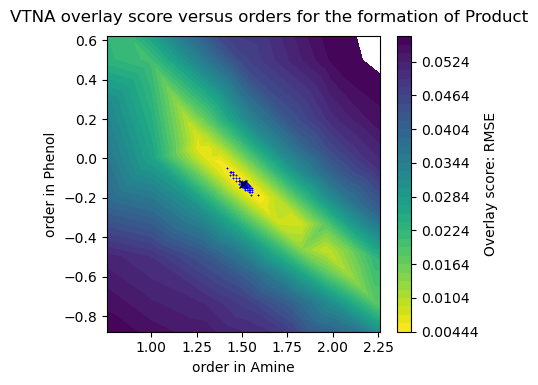

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E1a_cropped.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.5077350478380245 -0.12955771008948141 0.004441735794338893


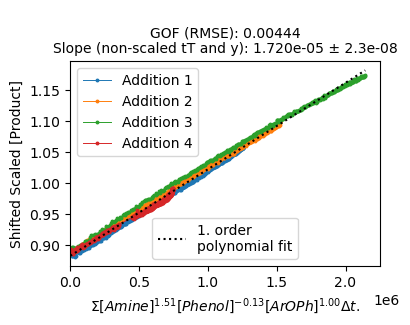

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E1a_cropped_fixed_ArOPh_overlay_plot_V1.svg


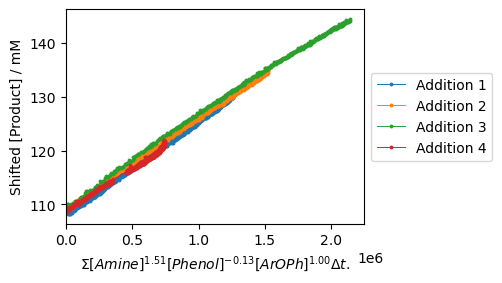

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E1a_cropped.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
  Downsampled (unfixed): total rows 3833 → 1500
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['2.0', '-0.5', '1.0']
Best reaction order(s) from the 2nd order exploration: ['1.76667', '-0.26667', '1.0']
Best reaction order(s) from the 3rd order exploration: ['1.70133', '-0.20133', '1.06533']
Best reaction order(s) from the 4th order exploration: ['1.5184', '-0.07938', '1.06533']
Best reaction order(s) from the 5th order exploration: ['1.53547', '-0.09645', '1.04826']
Best reaction order(s) from the 6th order exploration: ['1.48767', '-0.08052', '1.03232']
Best reaction order(s) from the 7th order exploration: ['1.50998', '-0.0939', '1.03679']
Best reaction order(s) from the 8th order exploration: ['1.50998', '-0.0939', '1.03679']
Best reaction order(s) from the 9th order exploration: ['1.50648', '-0.0904', '1.03795'

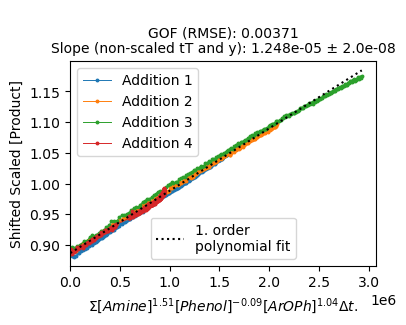

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E1a_cropped_fixed_None_overlay_plot_V1.svg


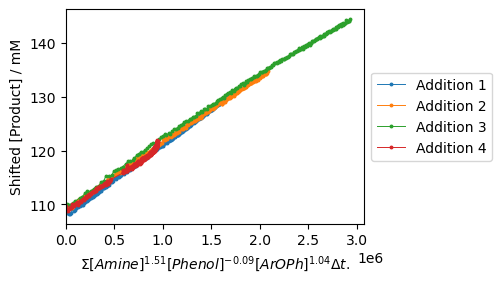

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E1a_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


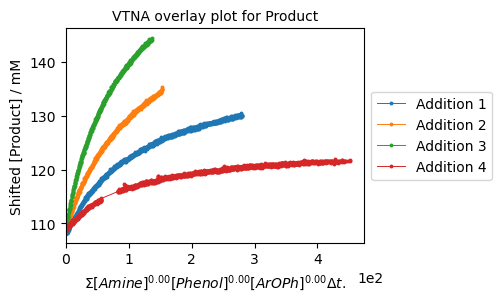

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E1a_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\C4_cropped_SAKE_datasets\C4_E1a_cropped.xlsx done
Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\C4_cropped_SAKE_datasets\C4_E1b_cropped.xlsx
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.5', '0.0']
Best reaction order(s) from the 2nd order exploration: ['1.73333', '0.0']
Best reaction order(s) from the 3rd order exploration: ['1.668', '-0.06533']
Best reaction order(s) from the 4th order exploration: ['1.668', '-0.06533']
Best reaction order(s) from the 5th order exploration: ['1.68507', '-0.08241']
Best reaction order(s) from the 6th order exploration: ['1.66914', '-0.06647']
Best reaction order(s) from the 7th order exploration: ['1.6736', '-0.07093']
Best reaction order(s) from the 8th order exploration: ['1.6736', '-0.07093']
Best reaction order(s) from the 9th order ex

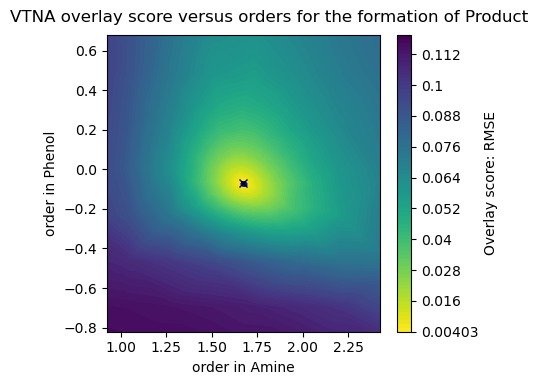

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E1b_cropped.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.6736001991111114 -0.07093353244444447 0.004027369293619353


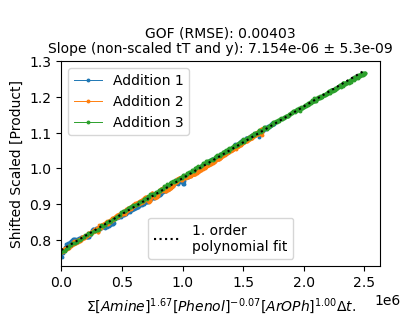

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E1b_cropped_fixed_ArOPh_overlay_plot_V1.svg


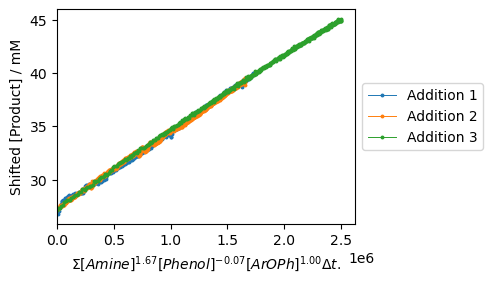

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E1b_cropped.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
  Downsampled (unfixed): total rows 2053 → 1500
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['2.0', '0.0', '1.5']
Best reaction order(s) from the 2nd order exploration: ['1.76667', '0.0', '1.26667']
Best reaction order(s) from the 3rd order exploration: ['1.70133', '-0.06533', '1.07067']
Best reaction order(s) from the 4th order exploration: ['1.76231', '-0.00436', '1.19262']
Best reaction order(s) from the 5th order exploration: ['1.74524', '-0.02143', '1.1414']
Best reaction order(s) from the 6th order exploration: ['1.7293', '-0.03736', '1.10953']
Best reaction order(s) from the 7th order exploration: ['1.72484', '-0.04183', '1.10507']
Best reaction order(s) from the 8th order exploration: ['1.72484', '-0.04183', '1.10507']
Best reaction order(s) from the 9th order exploration: ['1.72367', '-0.04299', '1.10157'

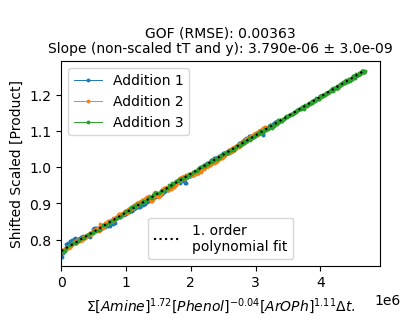

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E1b_cropped_fixed_None_overlay_plot_V1.svg


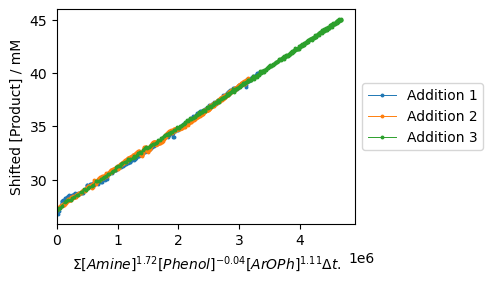

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E1b_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


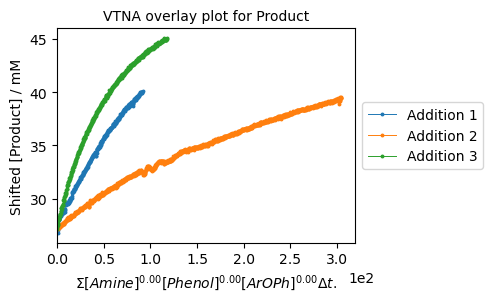

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E1b_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\C4_cropped_SAKE_datasets\C4_E1b_cropped.xlsx done
Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\C4_cropped_SAKE_datasets\C4_E2_cropped.xlsx
  Downsampled (fixed (ArOPh)): total rows 9159 → 3000
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.5', '0.0']
Best reaction order(s) from the 2nd order exploration: ['1.73333', '-0.23333']
Best reaction order(s) from the 3rd order exploration: ['1.40667', '-0.03733']
Best reaction order(s) from the 4th order exploration: ['1.46764', '-0.09831']
Best reaction order(s) from the 5th order exploration: ['1.45057', '-0.08124']
Best reaction order(s) from the 6th order exploration: ['1.45057', '-0.08124']
Best reaction order(s) from the 7th order exploration: ['1.44611', '-0.07678']
Best reaction order(s) from the 8th order exploration: ['1.

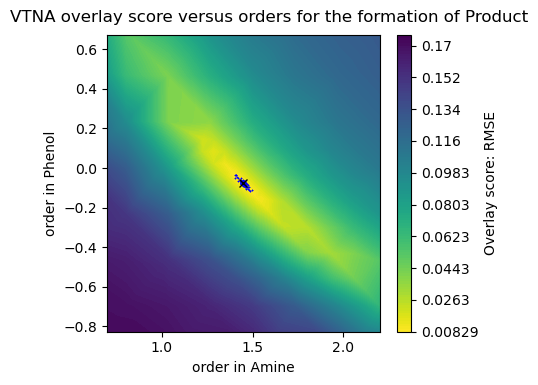

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E2_cropped.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.4486074098725925 -0.07744170353145681 0.008285021336525427


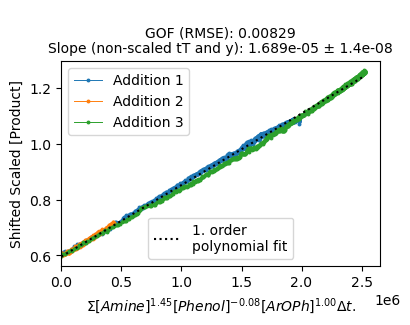

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E2_cropped_fixed_ArOPh_overlay_plot_V1.svg


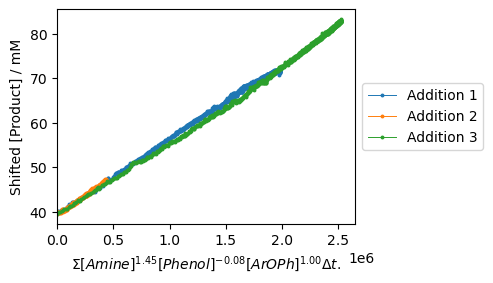

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E2_cropped.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
  Downsampled (unfixed): total rows 9159 → 1500
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.5', '-0.5', '0.5']
Best reaction order(s) from the 2nd order exploration: ['1.5', '-0.5', '0.5']
Best reaction order(s) from the 3rd order exploration: ['1.43467', '-0.304', '0.696']
Best reaction order(s) from the 4th order exploration: ['1.43467', '-0.24302', '0.75698']
Best reaction order(s) from the 5th order exploration: ['1.45174', '-0.22595', '0.8082']
Best reaction order(s) from the 6th order exploration: ['1.41987', '-0.19408', '0.82413']
Best reaction order(s) from the 7th order exploration: ['1.42433', '-0.20746', '0.81075']
Best reaction order(s) from the 8th order exploration: ['1.4285', '-0.2033', '0.81908']
Best reaction order(s) from the 9th order exploration: ['1.42733', '-0.20213', '0.82024']
The calcul

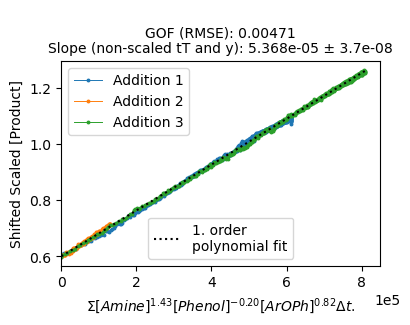

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E2_cropped_fixed_None_overlay_plot_V1.svg


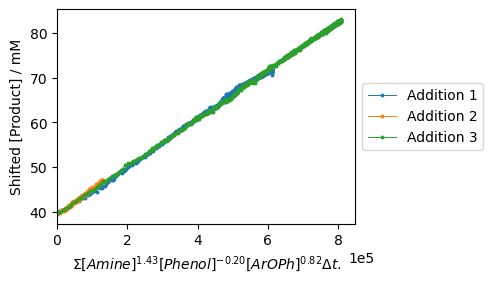

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E2_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


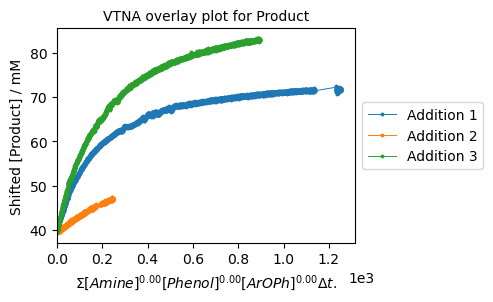

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E2_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\C4_cropped_SAKE_datasets\C4_E2_cropped.xlsx done
Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\C4_cropped_SAKE_datasets\C4_E3_cropped.xlsx
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.5', '0.0']
Best reaction order(s) from the 2nd order exploration: ['1.26667', '0.0']
Best reaction order(s) from the 3rd order exploration: ['1.332', '-0.06533']
Best reaction order(s) from the 4th order exploration: ['1.45396', '-0.12631']
Best reaction order(s) from the 5th order exploration: ['1.43688', '-0.10924']
Best reaction order(s) from the 6th order exploration: ['1.40501', '-0.0933']
Best reaction order(s) from the 7th order exploration: ['1.40055', '-0.08884']
Best reaction order(s) from the 8th order exploration: ['1.40888', '-0.093']
Best reaction order(s) from the 9th order expl

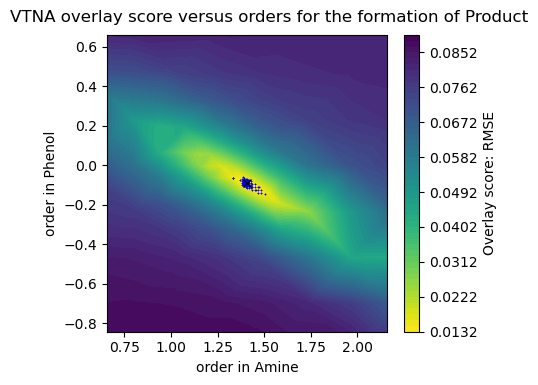

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E3_cropped.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.4077116913335308 -0.0918382887063704 0.013168790098180297


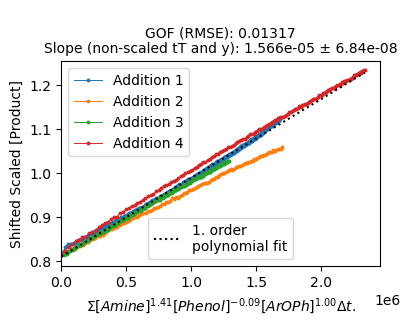

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E3_cropped_fixed_ArOPh_overlay_plot_V1.svg


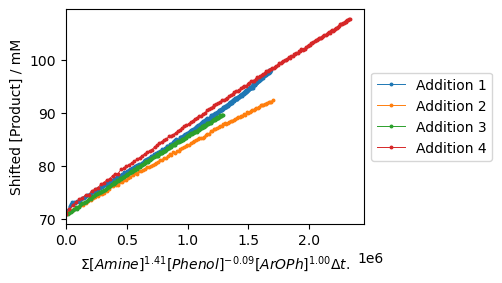

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E3_cropped.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.0', '0.0', '0.5']
Best reaction order(s) from the 2nd order exploration: ['1.23333', '-0.23333', '0.26667']
Best reaction order(s) from the 3rd order exploration: ['1.29867', '-0.168', '0.59333']
Best reaction order(s) from the 4th order exploration: ['1.23769', '-0.168', '0.47138']
Best reaction order(s) from the 5th order exploration: ['1.22062', '-0.15093', '0.48845']
Best reaction order(s) from the 6th order exploration: ['1.23655', '-0.16686', '0.47252']
Best reaction order(s) from the 7th order exploration: ['1.24101', '-0.1624', '0.4859']
Best reaction order(s) from the 8th order exploration: ['1.24101', '-0.1624', '0.49007']
Best reaction order(s) from the 9th order exploration: ['1.24218', '-0.16123', '0.4959']
The calculation is complete. Time elapsed: 274.8

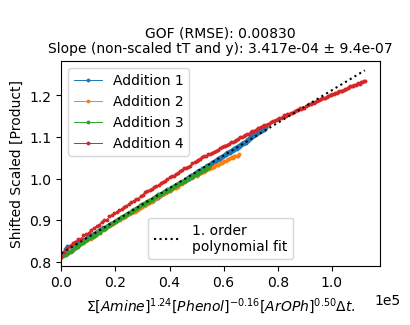

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E3_cropped_fixed_None_overlay_plot_V1.svg


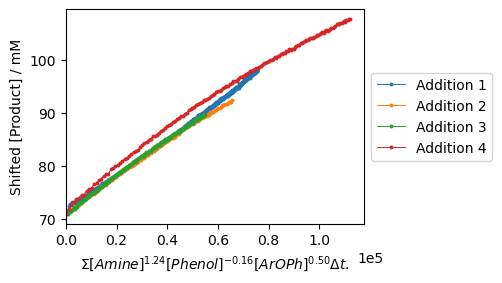

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E3_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


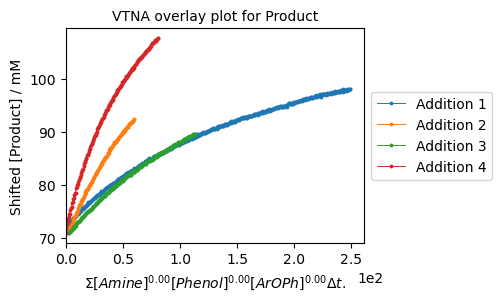

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E3_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\C4_cropped_SAKE_datasets\C4_E3_cropped.xlsx done
Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\C4_cropped_SAKE_datasets\C4_E4_cropped.xlsx
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.5', '0.0']
Best reaction order(s) from the 2nd order exploration: ['1.5', '0.0']
Best reaction order(s) from the 3rd order exploration: ['1.56533', '-0.06533']
Best reaction order(s) from the 4th order exploration: ['1.50436', '-0.06533']
Best reaction order(s) from the 5th order exploration: ['1.52143', '-0.04826']
Best reaction order(s) from the 6th order exploration: ['1.52143', '-0.04826']
Best reaction order(s) from the 7th order exploration: ['1.51697', '-0.05272']
Best reaction order(s) from the 8th order exploration: ['1.52113', '-0.05272']
Best reaction order(s) from the 9th order exp

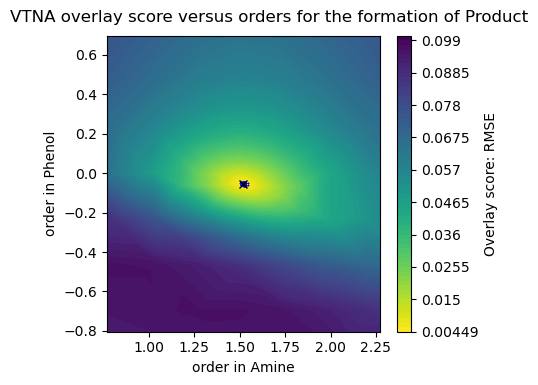

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E4_cropped.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.519965814632296 -0.053887558365234595 0.004491336152570097


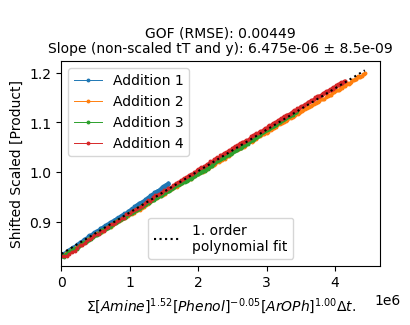

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E4_cropped_fixed_ArOPh_overlay_plot_V1.svg


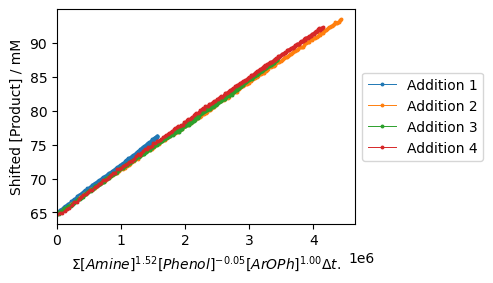

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E4_cropped.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.5', '0.0', '1.0']
Best reaction order(s) from the 2nd order exploration: ['1.5', '0.0', '1.0']
Best reaction order(s) from the 3rd order exploration: ['1.43467', '-0.06533', '0.93467']
Best reaction order(s) from the 4th order exploration: ['1.49564', '-0.06533', '0.93467']
Best reaction order(s) from the 5th order exploration: ['1.47857', '-0.08241', '0.88345']
Best reaction order(s) from the 6th order exploration: ['1.46264', '-0.08241', '0.88345']
Best reaction order(s) from the 7th order exploration: ['1.45817', '-0.08687', '0.87006']
Best reaction order(s) from the 8th order exploration: ['1.46234', '-0.0827', '0.87839']
Best reaction order(s) from the 9th order exploration: ['1.4635', '-0.08154', '0.88189']
The calculation is complete. Time elapsed: 369.0 second

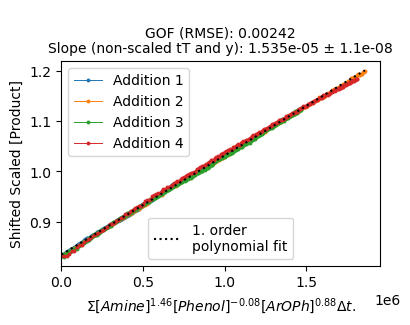

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E4_cropped_fixed_None_overlay_plot_V1.svg


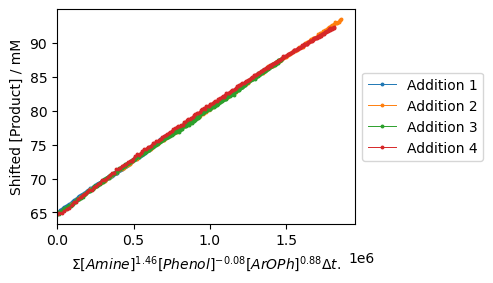

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E4_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


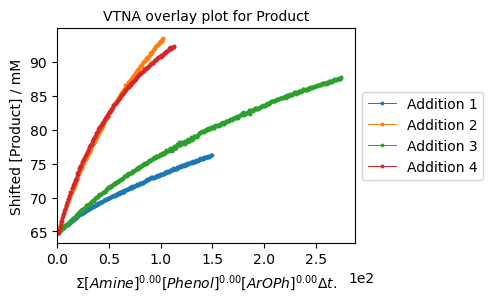

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E4_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\C4_cropped_SAKE_datasets\C4_E4_cropped.xlsx done
Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\C4_cropped_SAKE_datasets\C4_E5_cropped.xlsx
  Downsampled (fixed (ArOPh)): total rows 4326 → 3000
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['2.0', '-0.5']
Best reaction order(s) from the 2nd order exploration: ['1.3', '-0.03333']
Best reaction order(s) from the 3rd order exploration: ['1.23467', '0.032']
Best reaction order(s) from the 4th order exploration: ['1.4176', '-0.08996']
Best reaction order(s) from the 5th order exploration: ['1.50297', '-0.17532']
Best reaction order(s) from the 6th order exploration: ['1.50297', '-0.17532']
Best reaction order(s) from the 7th order exploration: ['1.49851', '-0.17086']
Best reaction order(s) from the 8th order exploration: ['1.48601', '

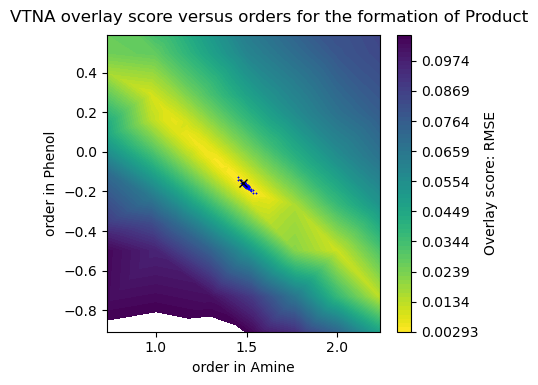

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E5_cropped.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.4825153226524443 -0.15903536231664214 0.002926944860490384


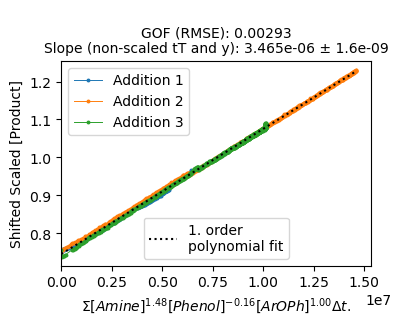

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E5_cropped_fixed_ArOPh_overlay_plot_V1.svg


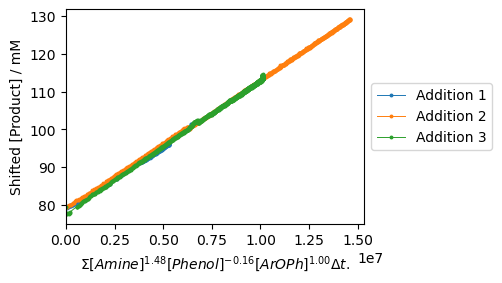

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E5_cropped.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
  Downsampled (unfixed): total rows 4326 → 1500
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['2.0', '-0.5', '1.0']
Best reaction order(s) from the 2nd order exploration: ['1.3', '-0.03333', '1.0']
Best reaction order(s) from the 3rd order exploration: ['1.36533', '0.032', '1.06533']
Best reaction order(s) from the 4th order exploration: ['1.48729', '-0.15093', '1.00436']
Best reaction order(s) from the 5th order exploration: ['1.53851', '-0.16801', '1.02143']
Best reaction order(s) from the 6th order exploration: ['1.50664', '-0.16801', '1.00549']
Best reaction order(s) from the 7th order exploration: ['1.48433', '-0.1457', '1.00996']
Best reaction order(s) from the 8th order exploration: ['1.49682', '-0.15403', '1.00996']
Best reaction order(s) from the 9th order exploration: ['1.49566', '-0.15286', '1.01112']
The

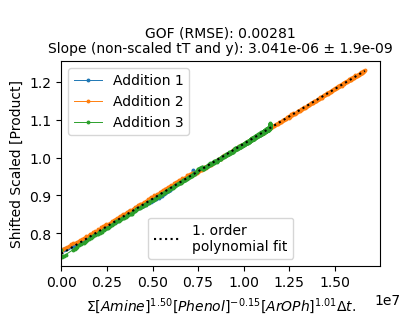

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E5_cropped_fixed_None_overlay_plot_V1.svg


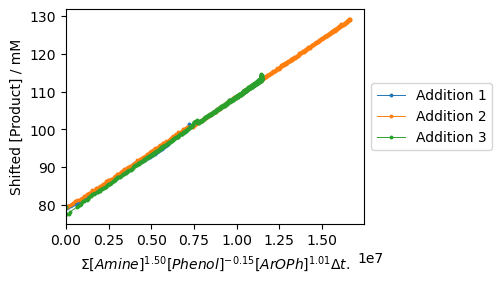

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E5_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


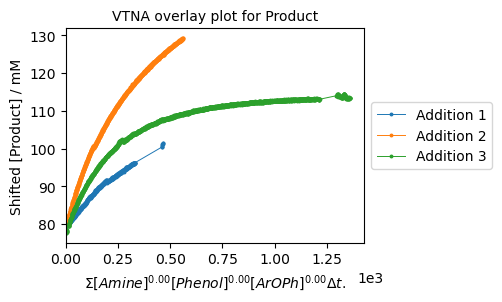

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E5_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\C4_cropped_SAKE_datasets\C4_E5_cropped.xlsx done
Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\C4_cropped_SAKE_datasets\C4_E6_cropped_v2.xlsx
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['2.0', '0.0']
Best reaction order(s) from the 2nd order exploration: ['2.23333', '-0.23333']
Best reaction order(s) from the 3rd order exploration: ['2.03733', '-0.168']
Best reaction order(s) from the 4th order exploration: ['1.91538', '-0.10702']
Best reaction order(s) from the 5th order exploration: ['1.9666', '-0.1241']
Best reaction order(s) from the 6th order exploration: ['1.9666', '-0.1241']
Best reaction order(s) from the 7th order exploration: ['1.97106', '-0.12856']
Best reaction order(s) from the 8th order exploration: ['1.96273', '-0.12439']
Best reaction order(s) from the 9th ord

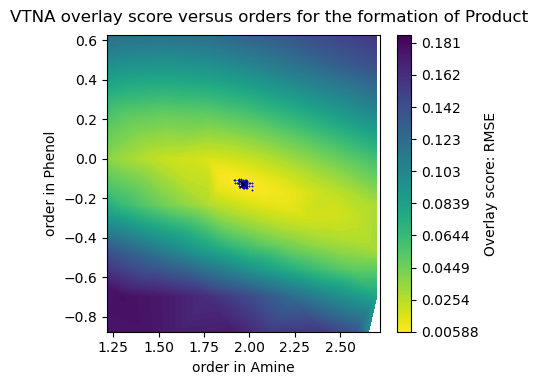

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E6_cropped_v2.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.9662302568043457 -0.12555951870103707 0.005876059176572957


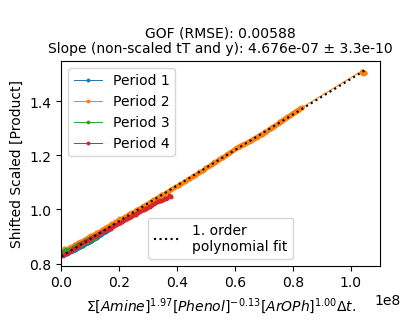

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E6_cropped_v2_fixed_ArOPh_overlay_plot_V1.svg


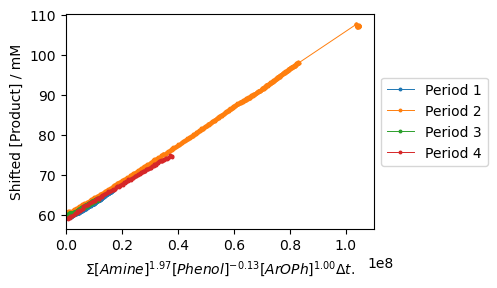

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E6_cropped_v2.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
  Downsampled (unfixed): total rows 2126 → 1500
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['2.0', '0.0', '1.5']
Best reaction order(s) from the 2nd order exploration: ['2.0', '0.0', '1.5']
Best reaction order(s) from the 3rd order exploration: ['1.93467', '-0.06533', '1.304']
Best reaction order(s) from the 4th order exploration: ['1.99564', '-0.06533', '1.304']
Best reaction order(s) from the 5th order exploration: ['1.94442', '-0.04826', '1.32107']
Best reaction order(s) from the 6th order exploration: ['1.96036', '-0.04826', '1.33701']
Best reaction order(s) from the 7th order exploration: ['1.9559', '-0.0438', '1.34147']
Best reaction order(s) from the 8th order exploration: ['1.9559', '-0.04796', '1.32898']
Best reaction order(s) from the 9th order exploration: ['1.95706', '-0.0468', '1.33481']
The calcul

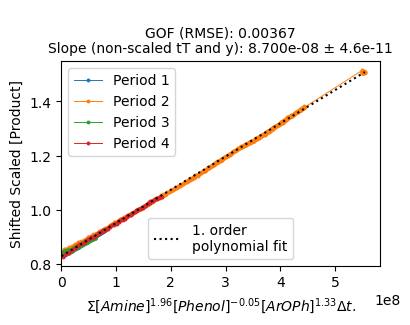

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E6_cropped_v2_fixed_None_overlay_plot_V1.svg


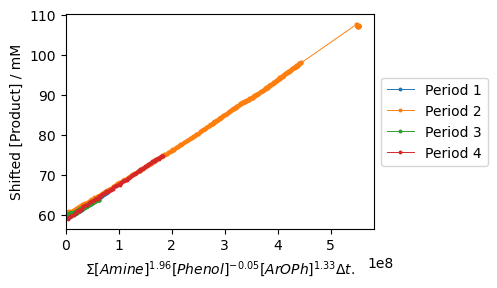

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E6_cropped_v2.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


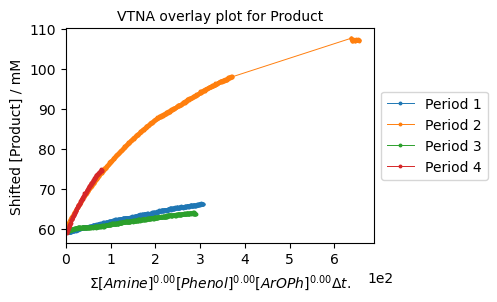

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E6_cropped_v2.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\C4_cropped_SAKE_datasets\C4_E6_cropped_v2.xlsx done
Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\C4_cropped_SAKE_datasets\C4_E7_cropped.xlsx
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.0', '0.0']
Best reaction order(s) from the 2nd order exploration: ['1.23333', '0.0']
Best reaction order(s) from the 3rd order exploration: ['1.29867', '-0.06533']
Best reaction order(s) from the 4th order exploration: ['1.29867', '-0.06533']
Best reaction order(s) from the 5th order exploration: ['1.28159', '-0.04826']
Best reaction order(s) from the 6th order exploration: ['1.26566', '-0.04826']
Best reaction order(s) from the 7th order exploration: ['1.2612', '-0.0438']
Best reaction order(s) from the 8th order exploration: ['1.25287', '-0.03963']
Best reaction order(s) from the 9th o

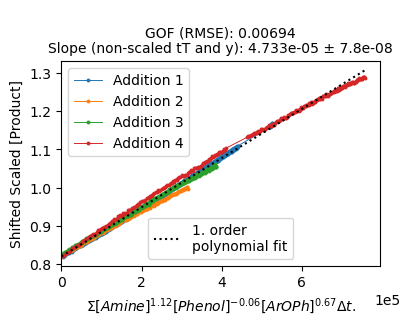

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E7_cropped_fixed_None_overlay_plot_V1.svg


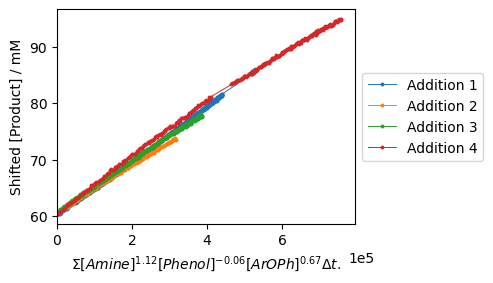

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E7_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


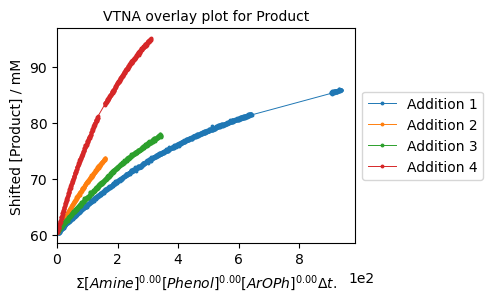

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E7_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\C4_cropped_SAKE_datasets\C4_E7_cropped.xlsx done
Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\C4_cropped_SAKE_datasets\C4_E8_cropped.xlsx
  Downsampled (fixed (ArOPh)): total rows 3027 → 3000
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.5', '0.0']
Best reaction order(s) from the 2nd order exploration: ['1.26667', '0.0']
Best reaction order(s) from the 3rd order exploration: ['1.20133', '0.06533']
Best reaction order(s) from the 4th order exploration: ['1.14036', '0.06533']
Best reaction order(s) from the 5th order exploration: ['1.12328', '0.08241']
Best reaction order(s) from the 6th order exploration: ['1.15515', '0.06647']
Best reaction order(s) from the 7th order exploration: ['1.15961', '0.06201']
Best reaction order(s) from the 8th order exploration: ['1.15545', '0.0

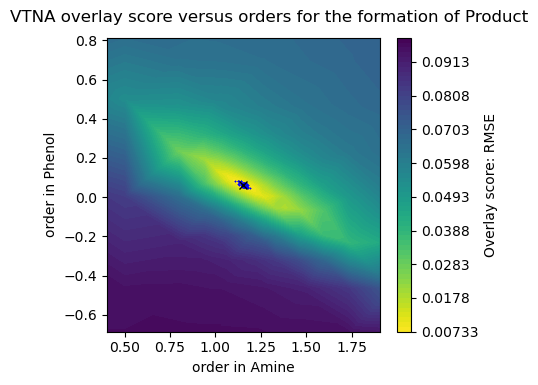

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E8_cropped.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.1542842372298272 0.06317569347634563 0.007329052221209845


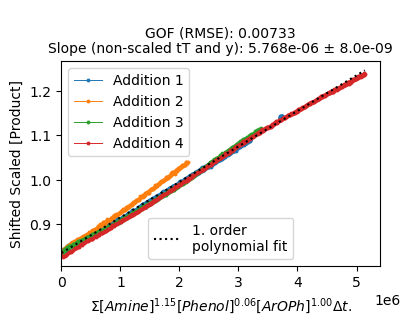

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E8_cropped_fixed_ArOPh_overlay_plot_V1.svg


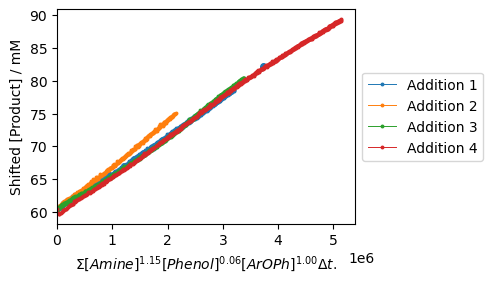

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E8_cropped.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
  Downsampled (unfixed): total rows 3027 → 1500
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.0', '0.0', '0.5']
Best reaction order(s) from the 2nd order exploration: ['1.23333', '0.0', '0.96667']
Best reaction order(s) from the 3rd order exploration: ['1.29867', '0.06533', '1.29333']
Best reaction order(s) from the 4th order exploration: ['1.23769', '0.06533', '1.17138']
Best reaction order(s) from the 5th order exploration: ['1.25476', '0.08241', '1.25675']
Best reaction order(s) from the 6th order exploration: ['1.28663', '0.06647', '1.25675']
Best reaction order(s) from the 7th order exploration: ['1.28217', '0.07093', '1.26121']
Best reaction order(s) from the 8th order exploration: ['1.28634', '0.06677', '1.25704']
Best reaction order(s) from the 9th order exploration: ['1.28983', '0.0656', '1.25821']
The c

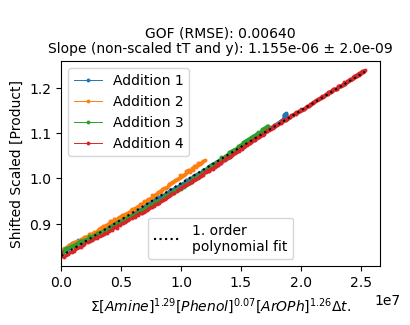

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E8_cropped_fixed_None_overlay_plot_V1.svg


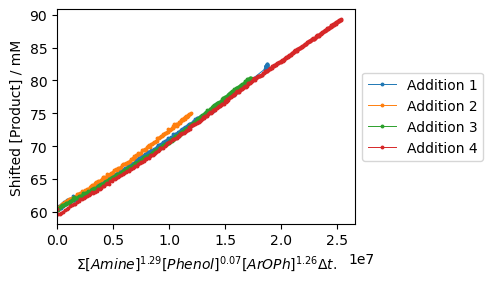

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E8_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


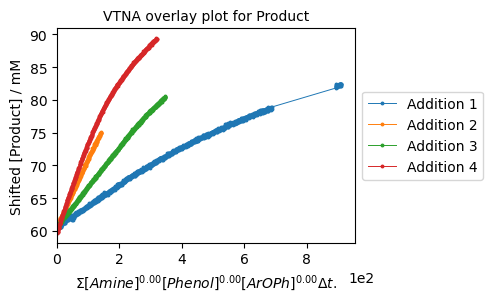

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E8_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\C4_cropped_SAKE_datasets\C4_E8_cropped.xlsx done
Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\C4_cropped_SAKE_datasets\C4_E9_cropped.xlsx
  Downsampled (fixed (ArOPh)): total rows 4330 → 3000
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.5', '0.0']
Best reaction order(s) from the 2nd order exploration: ['1.5', '0.0']
Best reaction order(s) from the 3rd order exploration: ['1.56533', '-0.06533']
Best reaction order(s) from the 4th order exploration: ['1.3824', '0.05662']
Best reaction order(s) from the 5th order exploration: ['1.46777', '0.0054']
Best reaction order(s) from the 6th order exploration: ['1.49964', '-0.02647']
Best reaction order(s) from the 7th order exploration: ['1.47733', '-0.01308']
Best reaction order(s) from the 8th order exploration: ['1.47733', '-0.013

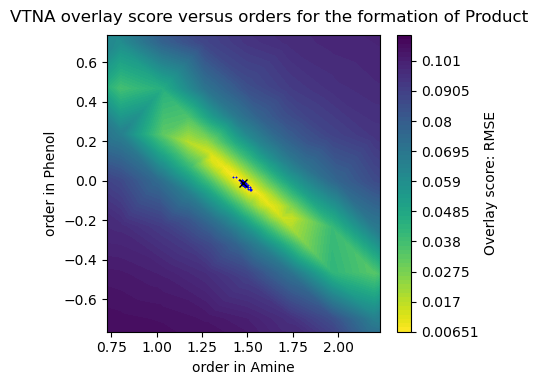

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E9_cropped.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.4773302044444443 -0.013084321185185183 0.006508209134252221


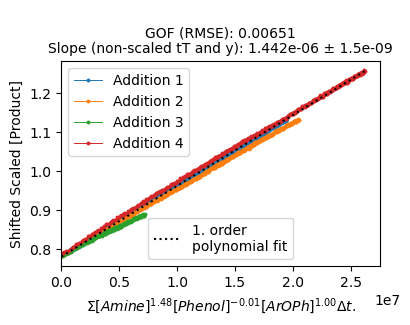

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E9_cropped_fixed_ArOPh_overlay_plot_V1.svg


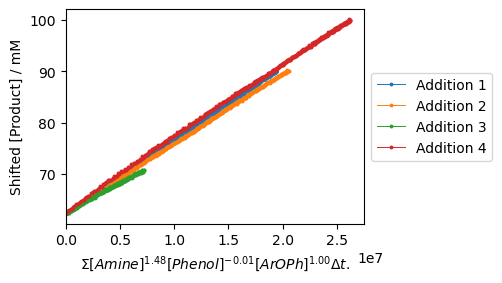

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E9_cropped.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
  Downsampled (unfixed): total rows 4330 → 1500
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.5', '0.0', '1.0']
Best reaction order(s) from the 2nd order exploration: ['1.5', '-0.23333', '0.53333']
Best reaction order(s) from the 3rd order exploration: ['1.43467', '-0.03733', '0.86']
Best reaction order(s) from the 4th order exploration: ['1.43467', '-0.03733', '0.86']
Best reaction order(s) from the 5th order exploration: ['1.48589', '-0.08855', '0.84293']
Best reaction order(s) from the 6th order exploration: ['1.45402', '-0.05668', '0.85886']
Best reaction order(s) from the 7th order exploration: ['1.4674', '-0.06115', '0.87225']
Best reaction order(s) from the 8th order exploration: ['1.4674', '-0.06531', '0.85975']
Best reaction order(s) from the 9th order exploration: ['1.46857', '-0.06414', '0.86558']
The 

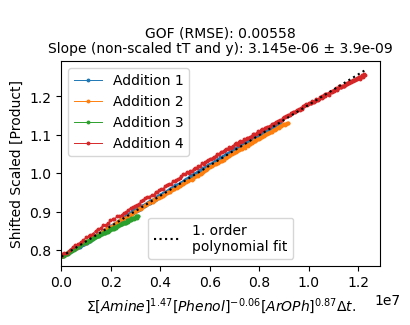

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E9_cropped_fixed_None_overlay_plot_V1.svg


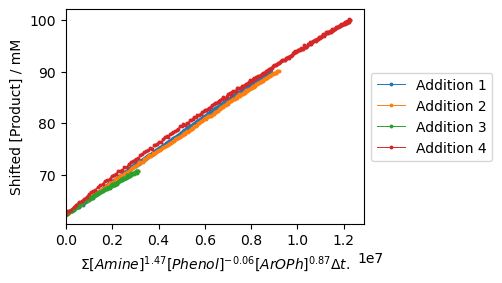

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E9_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


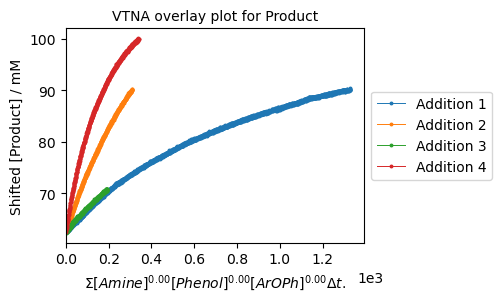

Saved SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_E9_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\C4_cropped_SAKE_datasets\C4_E9_cropped.xlsx done
Data saved to SAKE dataset analysis\Automatic VTNA\C4_Automatic_VTNA_Results\C4_Automatic_VTNA_Resultssummary_results_V1.csv


In [22]:
calc_C4=Automatic_VTNA_bulk_analysis(Experiment_paths_cropped_C4,'C4_Automatic_VTNA_Results.csv',folder_name='C4_Automatic_VTNA_Results',filename_addition='_V1',title_present=False,cwd=base_path)

### Repeated Experiments Combined

In [23]:
Experiment_names_repeats_combined=['C1_E4a-b','C2_E7a-b','C4_E1a-b']
Experiment_paths_repeats_combined=[path_datasets+i+'.xlsx' for i in Experiment_names_repeats_combined]

In [24]:
crop_largest_difference(Experiment_paths_repeats_combined, column="Product", percent_threshold=35.0,folder_name='Combined_repeated_cropped_SAKE_datasets',keep_original_if_unique=True,cwd=base_path)


Processing: SAKE datasets\C1_E4a-b.xlsx
  Cropping 'C1_E4b Addition 4' (diff=59.05) → limit=50.96
  Saved modified workbook → SAKE dataset analysis\Automatic VTNA\Combined_repeated_cropped_SAKE_datasets\C1_E4a-b_cropped.xlsx

Processing: SAKE datasets\C2_E7a-b.xlsx
  No cropping needed.
  Saved workbook → SAKE dataset analysis\Automatic VTNA\Combined_repeated_cropped_SAKE_datasets\C2_E7a-b_cropped.xlsx

Processing: SAKE datasets\C4_E1a-b.xlsx
  Cropping 'C4_E1a Addition 3' (diff=62.16) → limit=35.74
  Saved modified workbook → SAKE dataset analysis\Automatic VTNA\Combined_repeated_cropped_SAKE_datasets\C4_E1a-b_cropped.xlsx


In [25]:
path_cropped_datasets=os.getcwd()+'\\Combined_repeated_cropped_SAKE_datasets'
Experiment_paths_cropped_repeats_combined=[path_cropped_datasets+'\\'+i+'_cropped.xlsx' for i in Experiment_names_repeats_combined]

Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\Combined_repeated_cropped_SAKE_datasets\C1_E4a-b_cropped.xlsx
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.0', '0.0']
Best reaction order(s) from the 2nd order exploration: ['1.0', '0.0']
Best reaction order(s) from the 3rd order exploration: ['1.196', '-0.06533']
Best reaction order(s) from the 4th order exploration: ['1.25698', '-0.06533']
Best reaction order(s) from the 5th order exploration: ['1.20576', '-0.04826']
Best reaction order(s) from the 6th order exploration: ['1.23763', '-0.0642']
Best reaction order(s) from the 7th order exploration: ['1.22424', '-0.05973']
Best reaction order(s) from the 8th order exploration: ['1.22424', '-0.05973']
Best reaction order(s) from the 9th order exploration: ['1.22074', '-0.05857']
The calculation is complete. Time elapsed: 79.7 seconds


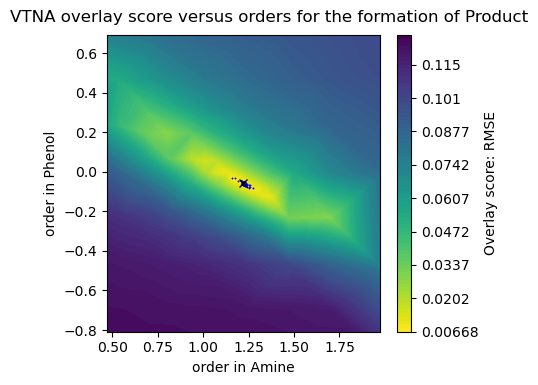

Saved SAKE dataset analysis\Automatic VTNA\Comb_Datasets_AutoVTNA_Results\C1_E4a-b_cropped.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.2207434878672594 -0.058567078671802504 0.006680681468379249


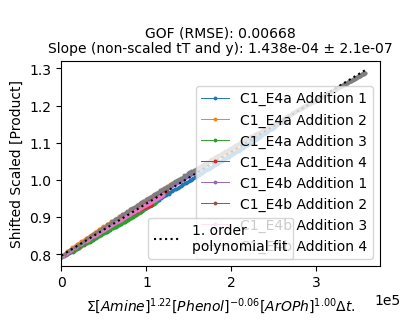

Saved SAKE dataset analysis\Automatic VTNA\Comb_Datasets_AutoVTNA_Results\C1_E4a-b_cropped_fixed_ArOPh_overlay_plot_V1.svg


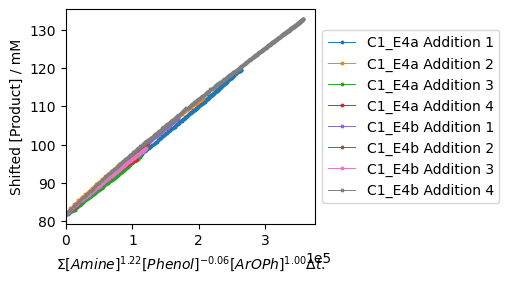

Saved SAKE dataset analysis\Automatic VTNA\Comb_Datasets_AutoVTNA_Results\C1_E4a-b_cropped.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.0', '0.0', '1.0']
Best reaction order(s) from the 2nd order exploration: ['1.23333', '0.0', '1.23333']
Best reaction order(s) from the 3rd order exploration: ['1.29867', '-0.06533', '1.03733']
Best reaction order(s) from the 4th order exploration: ['1.29867', '-0.06533', '1.09831']
Best reaction order(s) from the 5th order exploration: ['1.24745', '-0.04826', '1.04709']
Best reaction order(s) from the 6th order exploration: ['1.26338', '-0.0642', '1.04709']
Best reaction order(s) from the 7th order exploration: ['1.25892', '-0.05973', '1.05155']
Best reaction order(s) from the 8th order exploration: ['1.26308', '-0.05973', '1.05572']
Best reaction order(s) from the 9th order exploration: ['1.25959', '-0.05857', '1.05455']
The calculation is complete. Time elap

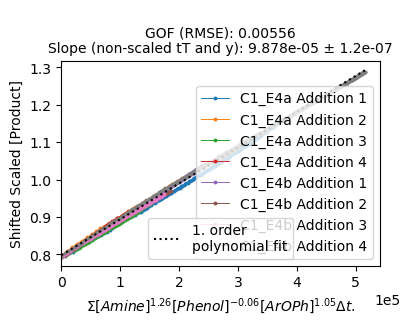

Saved SAKE dataset analysis\Automatic VTNA\Comb_Datasets_AutoVTNA_Results\C1_E4a-b_cropped_fixed_None_overlay_plot_V1.svg


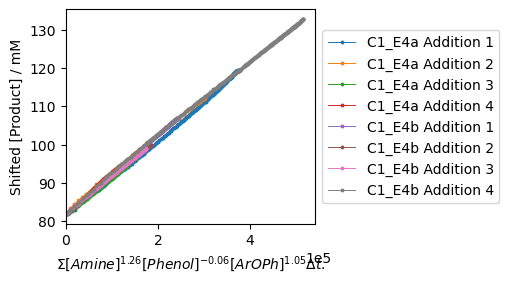

Saved SAKE dataset analysis\Automatic VTNA\Comb_Datasets_AutoVTNA_Results\C1_E4a-b_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


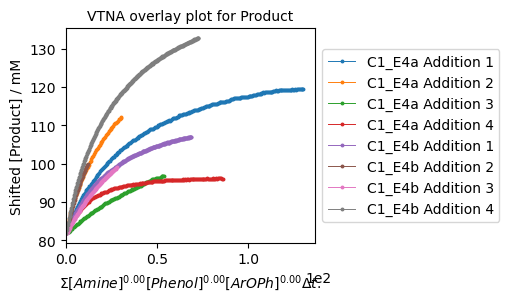

Saved SAKE dataset analysis\Automatic VTNA\Comb_Datasets_AutoVTNA_Results\C1_E4a-b_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\Combined_repeated_cropped_SAKE_datasets\C1_E4a-b_cropped.xlsx done
Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\Combined_repeated_cropped_SAKE_datasets\C2_E7a-b_cropped.xlsx
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.5', '0.0']
Best reaction order(s) from the 2nd order exploration: ['1.96667', '-0.23333']
Best reaction order(s) from the 3rd order exploration: ['1.90133', '-0.168']
Best reaction order(s) from the 4th order exploration: ['1.77938', '-0.10702']
Best reaction order(s) from the 5th order exploration: ['1.8306', '-0.1241']
Best reaction order(s) from the 6th order exploration: ['1.79873', '-0.10816']
Best reaction order(s) from the 7th order exploration: ['1.79427', '-0.1037']
Best reaction order(s) from the 8th order exploration: ['1.79843', '-0.10786

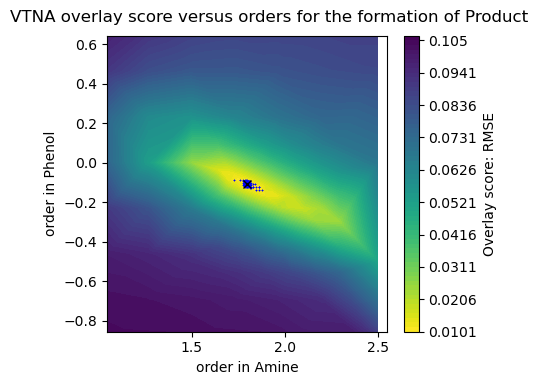

Saved SAKE dataset analysis\Automatic VTNA\Comb_Datasets_AutoVTNA_Results\C2_E7a-b_cropped.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.7972645405582222 -0.10669695537303706 0.010053628916457362


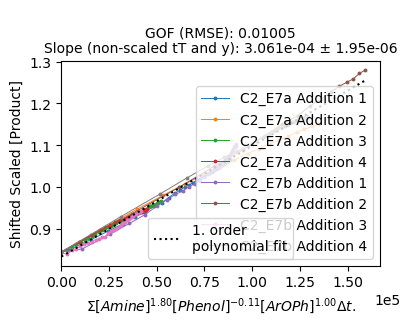

Saved SAKE dataset analysis\Automatic VTNA\Comb_Datasets_AutoVTNA_Results\C2_E7a-b_cropped_fixed_ArOPh_overlay_plot_V1.svg


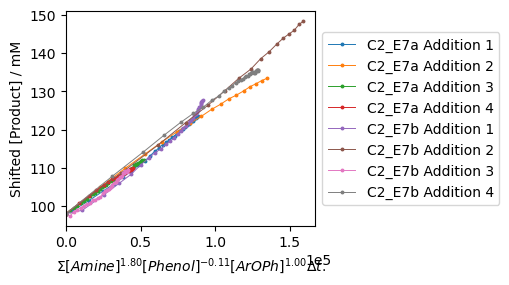

Saved SAKE dataset analysis\Automatic VTNA\Comb_Datasets_AutoVTNA_Results\C2_E7a-b_cropped.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.5', '0.0', '1.0']
Best reaction order(s) from the 2nd order exploration: ['1.96667', '0.0', '1.23333']
Best reaction order(s) from the 3rd order exploration: ['1.77067', '-0.06533', '1.03733']
Best reaction order(s) from the 4th order exploration: ['1.83164', '-0.06533', '1.09831']
Best reaction order(s) from the 5th order exploration: ['1.81457', '-0.08241', '1.04709']
Best reaction order(s) from the 6th order exploration: ['1.84644', '-0.09834', '1.04709']
Best reaction order(s) from the 7th order exploration: ['1.83306', '-0.09388', '1.05155']
Best reaction order(s) from the 8th order exploration: ['1.82889', '-0.09388', '1.04739']
Best reaction order(s) from the 9th order exploration: ['1.83006', '-0.09271', '1.04855']
The calculation is complete. Time ela

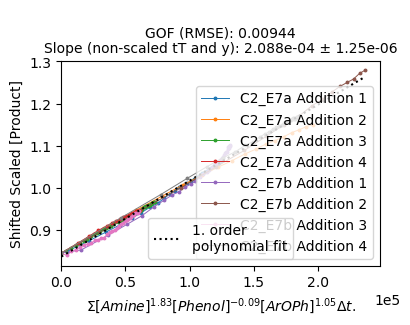

Saved SAKE dataset analysis\Automatic VTNA\Comb_Datasets_AutoVTNA_Results\C2_E7a-b_cropped_fixed_None_overlay_plot_V1.svg


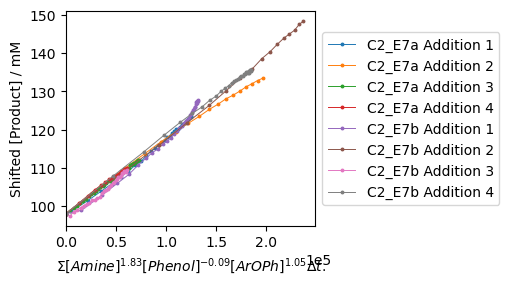

Saved SAKE dataset analysis\Automatic VTNA\Comb_Datasets_AutoVTNA_Results\C2_E7a-b_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


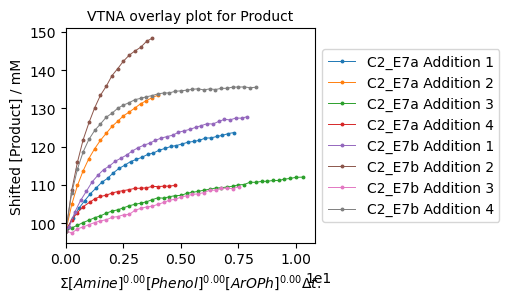

Saved SAKE dataset analysis\Automatic VTNA\Comb_Datasets_AutoVTNA_Results\C2_E7a-b_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\Combined_repeated_cropped_SAKE_datasets\C2_E7a-b_cropped.xlsx done
Dataset being analysed:  SAKE dataset analysis\Automatic VTNA\Combined_repeated_cropped_SAKE_datasets\C4_E1a-b_cropped.xlsx
  Downsampled (fixed (ArOPh)): total rows 6421 → 3000
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.5', '0.0']
Best reaction order(s) from the 2nd order exploration: ['1.73333', '-0.23333']
Best reaction order(s) from the 3rd order exploration: ['1.668', '-0.168']
Best reaction order(s) from the 4th order exploration: ['1.60702', '-0.168']
Best reaction order(s) from the 5th order exploration: ['1.6241', '-0.18507']
Best reaction order(s) from the 6th order exploration: ['1.60816', '-0.16914']
Best reaction order(s) from the 7th order exploration: ['1.61262', '-0.1736']
Best reaction order(s) fr

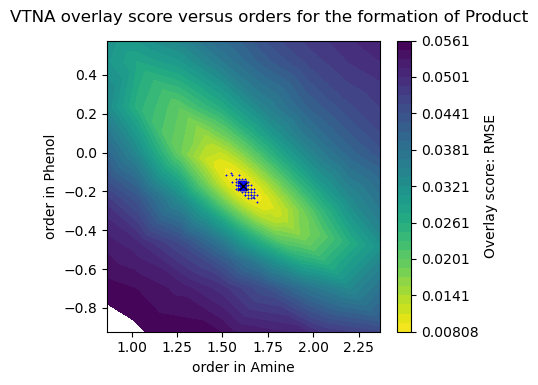

Saved SAKE dataset analysis\Automatic VTNA\Comb_Datasets_AutoVTNA_Results\C4_E1a-b_cropped.xlsx_fixed_ArOPh_ovso_plot_V1.svg
Best parameters for fixed orders: 1.6156208498915556 -0.17243414356069137 0.008078551335085175


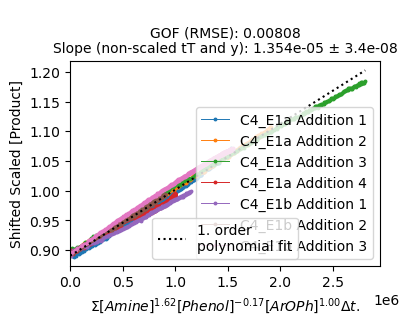

Saved SAKE dataset analysis\Automatic VTNA\Comb_Datasets_AutoVTNA_Results\C4_E1a-b_cropped_fixed_ArOPh_overlay_plot_V1.svg


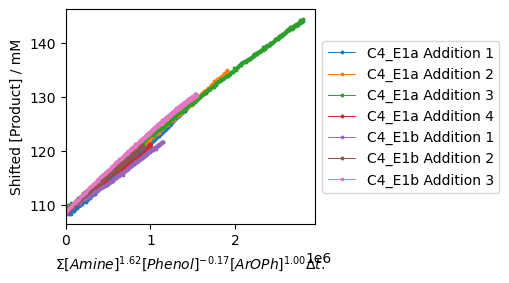

Saved SAKE dataset analysis\Automatic VTNA\Comb_Datasets_AutoVTNA_Results\C4_E1a-b_cropped.xlsx_fixed_ArOPh_overlay_plot_no_legends_V1.svg
  Downsampled (unfixed): total rows 6421 → 1500
Auto-VTNA calculation underway.
Best reaction order(s) from the 1st order exploration: ['1.5', '0.0', '1.0']
Best reaction order(s) from the 2nd order exploration: ['1.73333', '-0.23333', '1.0']
Best reaction order(s) from the 3rd order exploration: ['1.53733', '-0.168', '0.93467']
Best reaction order(s) from the 4th order exploration: ['1.59831', '-0.168', '0.99564']
Best reaction order(s) from the 5th order exploration: ['1.64953', '-0.18507', '1.01272']
Best reaction order(s) from the 6th order exploration: ['1.60173', '-0.16914', '0.99678']
Best reaction order(s) from the 7th order exploration: ['1.61511', '-0.1736', '1.00124']
Best reaction order(s) from the 8th order exploration: ['1.61095', '-0.1736', '0.99708']
Best reaction order(s) from the 9th order exploration: ['1.61445', '-0.17477', '0.99

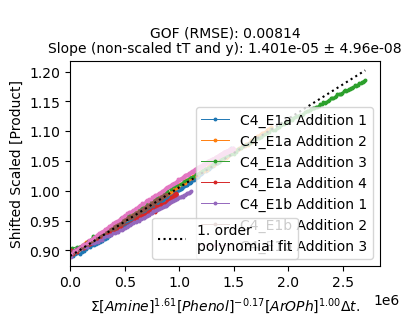

Saved SAKE dataset analysis\Automatic VTNA\Comb_Datasets_AutoVTNA_Results\C4_E1a-b_cropped_fixed_None_overlay_plot_V1.svg


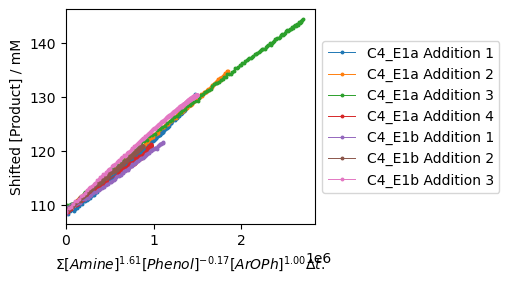

Saved SAKE dataset analysis\Automatic VTNA\Comb_Datasets_AutoVTNA_Results\C4_E1a-b_cropped.xlsx_fixed_None_overlay_plot_no_legends_V1.svg


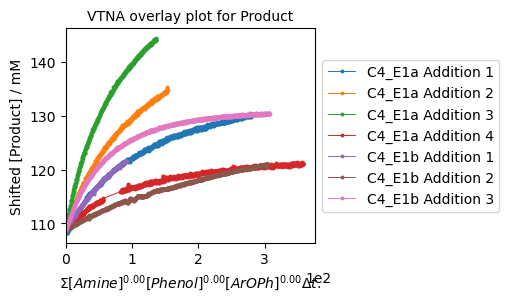

Saved SAKE dataset analysis\Automatic VTNA\Comb_Datasets_AutoVTNA_Results\C4_E1a-b_cropped.xlsx_no_time_normalisation_V1.svg
SAKE dataset analysis\Automatic VTNA\Combined_repeated_cropped_SAKE_datasets\C4_E1a-b_cropped.xlsx done
Data saved to SAKE dataset analysis\Automatic VTNA\Comb_Datasets_AutoVTNA_Results\Comb_Datasets_AutoVTNA_Resultssummary_results_V1.csv


In [26]:
calc_combined_datasets=Automatic_VTNA_bulk_analysis(Experiment_paths_cropped_repeats_combined,'Combined_Datasets_Automatic_Automatic_VTNA_Results.csv',folder_name='Comb_Datasets_AutoVTNA_Results',filename_addition='_V1',title_present=False,cwd=base_path)